This notebook will be aimed at exploring the distribution of fires/non-fires geographically. After building out some plotting functionality in another repository ([dsfuncs](https://github.com/sallamander/dsfuncs)), I'll be using it to plot fires. I'll start off by focusing on counties that have had a good number of fires in 2015, and look at the distribution of fires/non-fires in those counties in 2015 (and probably in a one month span). After that, I'll move to looking at the distribution of fires/non-fires in those same counties, but in earlier years. I'm aiming to explore the data to identify patterns that I might use in modeling, and specifically looking to see if: 

1. Fires clump together, as we might expect. Since the "detected fires" are just centroids detected at one point in the day, it seems reasonable to expect that multiple centroids that are truly fires would be detected close to each other in time and space. 
2. Fires are not present in the same locations from year to year. Forest-fires are often described as cyclical in nature, at least when we look at the same location across time. I'll be looking to try to confirm this (or support this) with this exploration here. 

The first thing I'll need to do is read in the data and figure out how to parse it to a given state and/or county. I'm going to intially focus on forest-fires in Washington, California, Colorado, Montana, and Texas. I think this will give me a reasonable mix of places that have enough potential fires to look at, while still being somewhat geographically diverse (unfortunately nothing in the east will really have enough). 

As a last note, in any of the writing in this notebook, I am referring to fires as forest-fires, and non-fires as non forest-fires (they may still be some other kind of fire, though). 

In [1]:
import pandas as pd
from dsfuncs.geo_plotting import USMapBuilder
import matplotlib.pyplot as plt
import fiona
import subprocess
import datetime
%matplotlib inline

The first step will be to create functions to read in the data, and then only grab those rows of the data set that correspond to a given location (state & county) as well as a given month (or months). 

In [2]:
def read_df(year, modis=True): 
    """This function will read in a year of data, and add a month column. 
    
    Args: 
        year: str
        modis: bool
            Whether to use the modis or viirs data for plotting. 
        
    Return:
        Pandas DataFrame
    """
    if modis: 
        output_df = pd.read_csv('../../../data/csvs/detected_fires_MODIS_' + str(year) + '.csv', 
                                parse_dates=['date'], true_values=['t'], false_values=['f'])
    else: 
         output_df = pd.read_csv('../../../data/csvs/detected_fires_VIIRS_' + str(year) + '.csv', 
                                parse_dates=['date'], true_values=['t'], false_values=['f'])
    output_df['month'] = output_df.date.apply(lambda dt: dt.strftime('%B'))
    output_df.dropna(subset=['region_name'], inplace=True) # These will be obs. in Canada. 
    return output_df
    
def grab_by_location(df, state_names, county_names=None): 
    """Grab the data for a specified inputted state and county. 
    
    Args: 
        df: Pandas DataFrame
        state: set (or iterable of strings)
            State to grab for plotting.
        county: set (or iterable of strings) (optional)
            County names to grab for plotting. If None, simply grab the 
            entire state to plot. 
            
    Return: 
        Pandas DataFrame
    """
    if county_names: 
        output_df = df.query('state_name in @state_names and county_name in @county_names')
    else: 
        output_df = df.query('state_name in @state_names')
    return output_df

def grab_by_date(df, months=None, dt=None): 
    """Grab the data for a set of specified months.
    
    Args: 
        df: Pandas DataFrame
        months: set (or iterable of strings)
    
    Return: 
        Pandas DataFrame
    """
    if months is not None: 
        output_df = df.query("month in @months")
    else: 
        split_dt = dt.split('-')
        year, month, dt = int(split_dt[0]), int(split_dt[1]), int(split_dt[2])
        match_dt = datetime.datetime(year, month, dt, 0, 0, 0)
        output_df = df.query('date == @match_dt')
    return output_df

The next step is to just parse the data to get it into a format to plot. The format that the `USMapBuilder` class will expect the data to be in is an iterable of three items: 

1. Longitude of the point. 
2. Latitude of the point. 
3. Color to plot the point in. 

I'll create a function that will take in the previously parsed location/date DataFrame and get the data set up to be in that format. 

In [3]:
def format_df(df): 
    """Format the data to plot it on maps. 
    
    This function will grab the latitude and longitude 
    columns of the DataFrame, and return those, along 
    with a third column that will be newly generated. This 
    new column will hold what color we want to use to plot 
    the lat/long coordinate - I'll use red for fire and 
    green for non-fire. 
    
    Args: 
        df: Pandas DataFrame
    
    Return: 
        numpy.ndarray
    """
    
    keep_cols = ['long', 'lat', 'fire_bool']
    intermediate_df = df[keep_cols]
    output_df = parse_fire_bool(intermediate_df)
    output_array = output_df.values
    return output_array

def parse_fire_bool(df): 
    """Parse the fire boolean to a color for plotting. 
    
    Args: 
        df: Pandas DataFrame
        
    Return: 
        Pandas DataFrame
    """
    
    # Plot actual fires red and non-fires green. 
    output_df = df.drop('fire_bool', axis=1)
    output_df['plotting_mark'] = df['fire_bool'].apply(lambda f_bool: 'ro' if f_bool == True else 'go')
    return output_df

Now let's put all of this into a master function. 

In [4]:
def read_n_parse(year, state_names, county_names=None, months=None, plotting=False, dt=None): 
    """Read and parse the data for plotting.
    
    Args: 
        year: str
        state_names: set (or other iterable) of state names
            State names to grab for plotting. 
        county_names: set (or other iterable) of county names (optional)
            County names to grab for plotting. 
        months: months (or other iterable) of months (optional)
            Month names to grab for plotting. 
        plotting: bool 
            Whether or not to format the data for plotting. 
            
    Return: 
        Pandas DataFrame
    """
    
    fires_df = read_df(year)
    if state_names: 
        fires_df = grab_by_location(fires_df, state_names, county_names)
    
    if months or dt: 
        fires_df = grab_by_date(fires_df, months, dt)
    
    if plotting: 
        fires_df = format_df(fires_df)
    return fires_df

def plot_states(year, state_names, months=None, plotting=True): 
    """Plot a state map and the given fires data points for that state. 
    
    Args: 
        year: str
        state_names: set (or other iterable) of state names
            State names to grab for plotting. 
        months: set (or other iterable) of month names 
            Month names to grab for plotting. 
        plotting: bool 
            Whether or not to format the data for plotting. 
    
    Return: Plotted Basemap
    """
    ax = plt.subplot(1, 2, 1)
    state_map = USMapBuilder('data/state_shapefiles_2014/cb_2014_us_state_500k2.shp', geo_level='State', 
                        state_names=state_names, ax=ax, border_padding=1)
    fires_data = read_n_parse(year, state_names, months=months, plotting=plotting)
    fires_data_trues = fires_data[fires_data[:,2] == 'ro']
    fires_data_falses = fires_data[fires_data[:,2] == 'go']
    print fires_data_trues.shape, fires_data_falses.shape
    state_map.plot_points(fires_data_trues)
    ax = plt.subplot(1, 2, 2)
    state_map = USMapBuilder('data/state_shapefiles_2014/cb_2014_us_state_500k2.shp', geo_level='State',  
                        state_names=state_names, ax=ax, border_padding=1)
    state_map.plot_points(fires_data_falses)
    plt.show()

In [5]:
years = ['2012', '2013', '2014', '2015']
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 
         'November', 'December']

Year: 2012, Month: January
(0, 3) (126, 3)


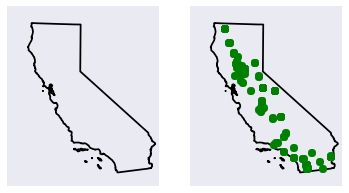

Year: 2013, Month: January
(0, 3) (131, 3)


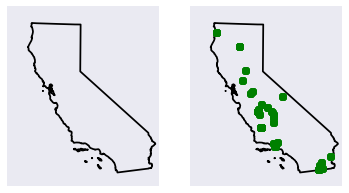

Year: 2014, Month: January
(35, 3) (696, 3)


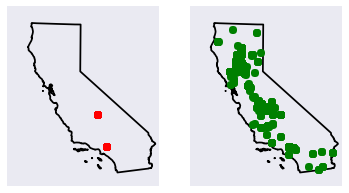

Year: 2015, Month: January
(0, 3) (139, 3)


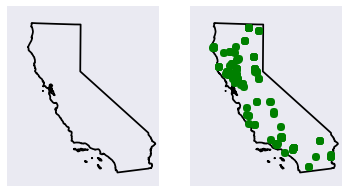

Year: 2012, Month: February
(1, 3) (115, 3)


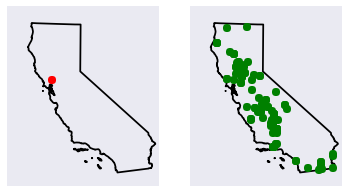

Year: 2013, Month: February
(3, 3) (538, 3)


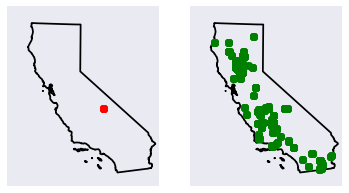

Year: 2014, Month: February
(0, 3) (744, 3)


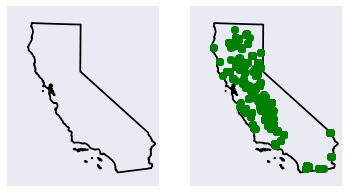

Year: 2015, Month: February
(0, 3) (297, 3)


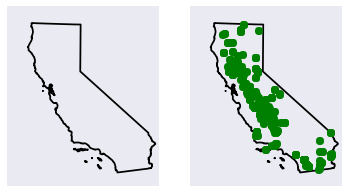

Year: 2012, Month: March
(0, 3) (130, 3)


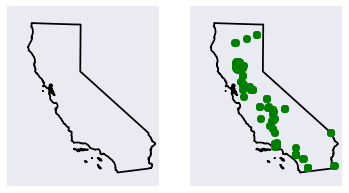

Year: 2013, Month: March
(0, 3) (392, 3)


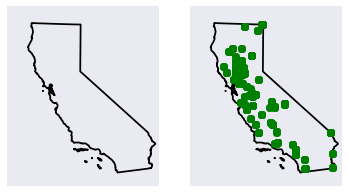

Year: 2014, Month: March
(0, 3) (715, 3)


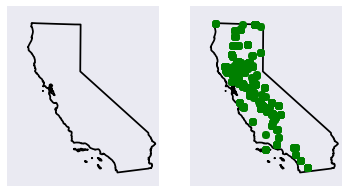

Year: 2015, Month: March
(0, 3) (333, 3)


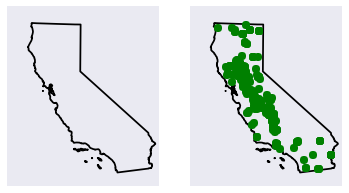

Year: 2012, Month: April
(0, 3) (145, 3)


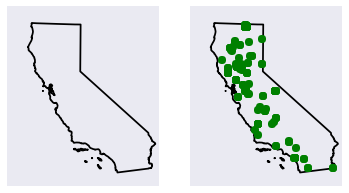

Year: 2013, Month: April
(0, 3) (392, 3)


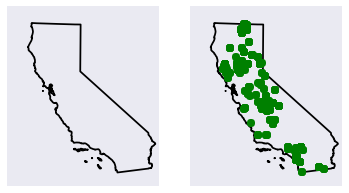

Year: 2014, Month: April
(19, 3) (492, 3)


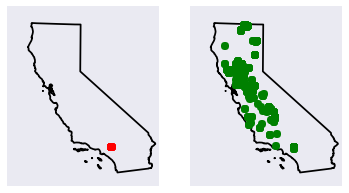

Year: 2015, Month: April
(0, 3) (255, 3)


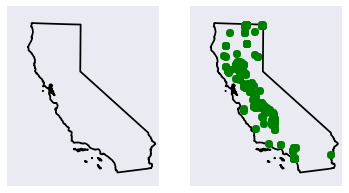

Year: 2012, Month: May
(5, 3) (188, 3)


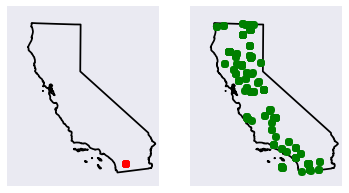

Year: 2013, Month: May
(388, 3) (510, 3)


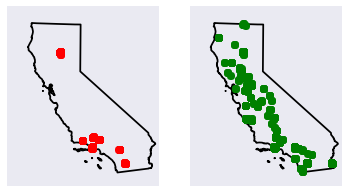

Year: 2014, Month: May
(122, 3) (568, 3)


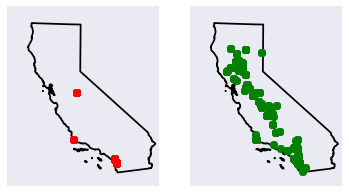

Year: 2015, Month: May
(0, 3) (128, 3)


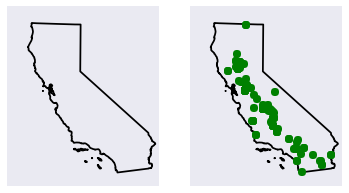

Year: 2012, Month: June
(48, 3) (656, 3)


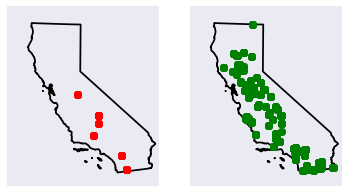

Year: 2013, Month: June
(369, 3) (656, 3)


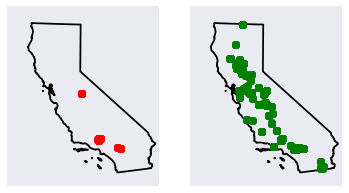

Year: 2014, Month: June
(59, 3) (404, 3)


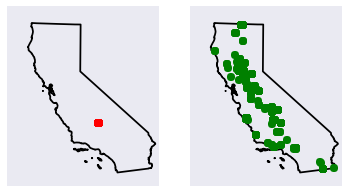

Year: 2015, Month: June
(438, 3) (619, 3)


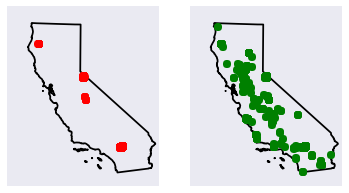

Year: 2012, Month: July
(695, 3) (1147, 3)


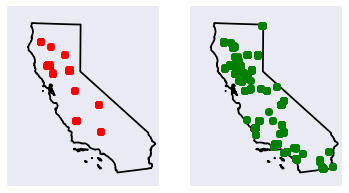

Year: 2013, Month: July
(692, 3) (946, 3)


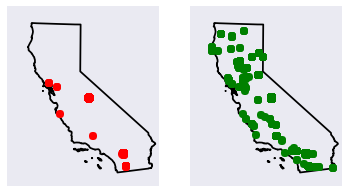

Year: 2014, Month: July
(654, 3) (916, 3)


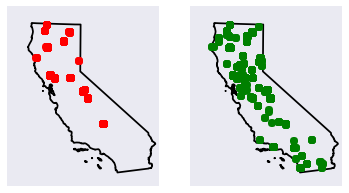

Year: 2015, Month: July
(329, 3) (383, 3)


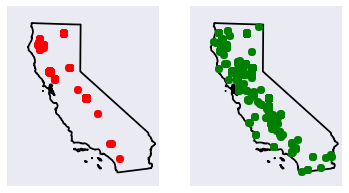

Year: 2012, Month: August
(6391, 3) (8406, 3)


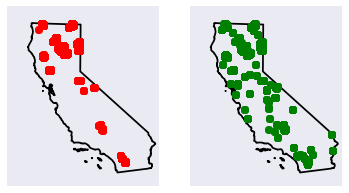

Year: 2013, Month: August
(8096, 3) (4564, 3)


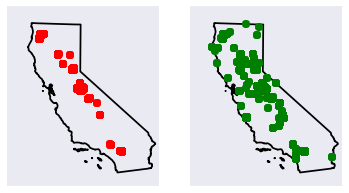

Year: 2014, Month: August
(4420, 3) (3625, 3)


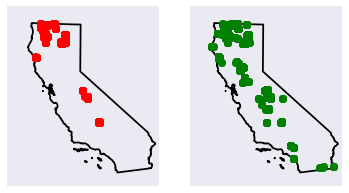

Year: 2015, Month: August
(4829, 3) (5652, 3)


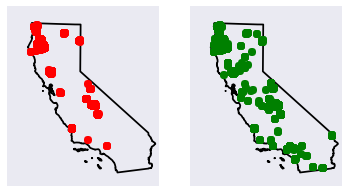

Year: 2012, Month: September
(738, 3) (1372, 3)


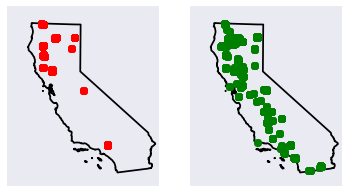

Year: 2013, Month: September
(1700, 3) (1704, 3)


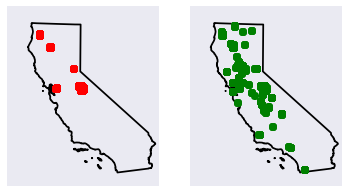

Year: 2014, Month: September
(3826, 3) (2903, 3)


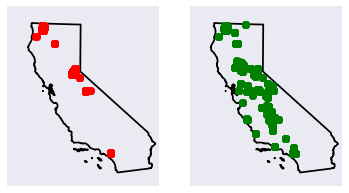

Year: 2015, Month: September
(1022, 3) (896, 3)


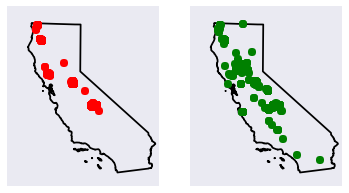

Year: 2012, Month: October
(0, 3) (451, 3)


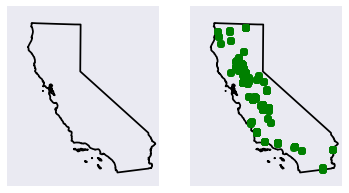

Year: 2013, Month: October
(4, 3) (760, 3)


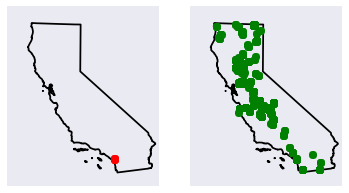

Year: 2014, Month: October
(4, 3) (1033, 3)


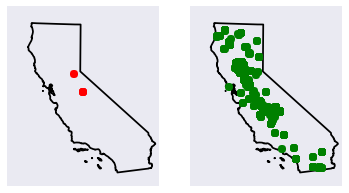

Year: 2015, Month: October
(8, 3) (611, 3)


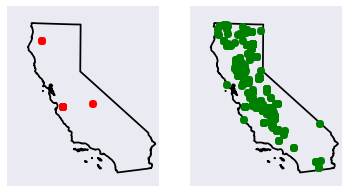

Year: 2012, Month: November
(3, 3) (476, 3)


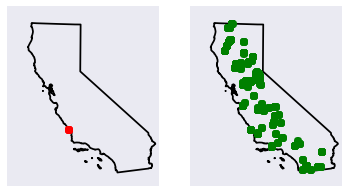

Year: 2013, Month: November
(9, 3) (765, 3)


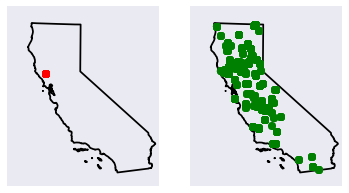

Year: 2014, Month: November
(0, 3) (413, 3)


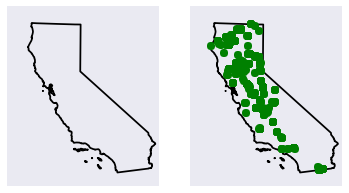

Year: 2015, Month: November
(0, 3) (544, 3)


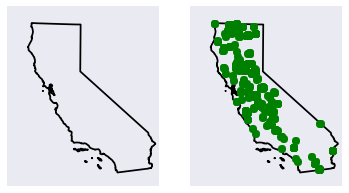

Year: 2012, Month: December
(0, 3) (53, 3)


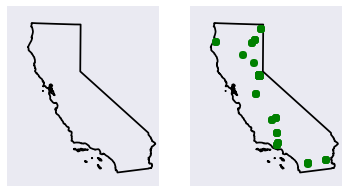

Year: 2013, Month: December
(9, 3) (357, 3)


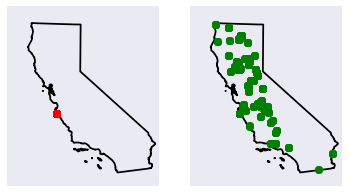

Year: 2014, Month: December
(0, 3) (152, 3)


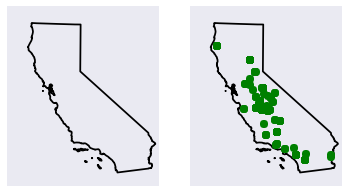

Year: 2015, Month: December
(0, 3) (198, 3)


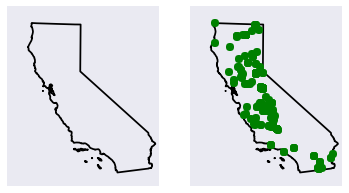

In [6]:
state_names = ['California']
for month in months: 
    for year in years: 
        print 'Year: {}, Month: {}'.format(year, month)
        plot_states(year, state_names, months=[month])

Year: 2012, Month: January
(0, 3) (5, 3)


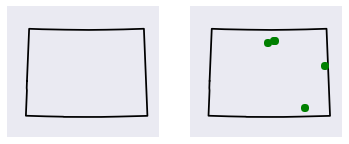

Year: 2013, Month: January
(0, 3) (27, 3)


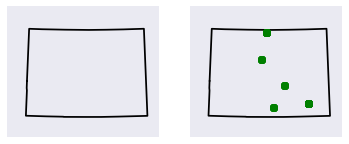

Year: 2014, Month: January
(0, 3) (9, 3)


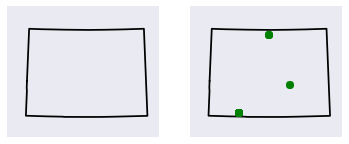

Year: 2015, Month: January
(0, 3) (3, 3)


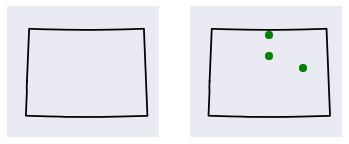

Year: 2012, Month: February
(0, 3) (31, 3)


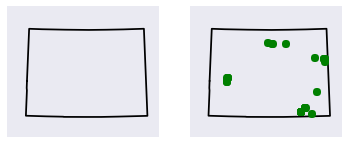

Year: 2013, Month: February
(0, 3) (19, 3)


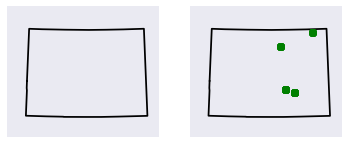

Year: 2014, Month: February
(0, 3) (17, 3)


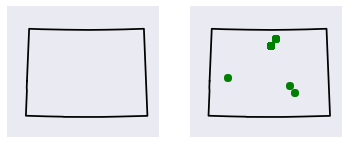

Year: 2015, Month: February
(0, 3) (34, 3)


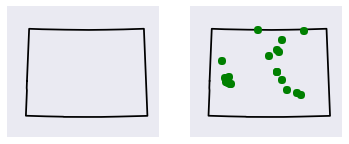

Year: 2012, Month: March
(2, 3) (171, 3)


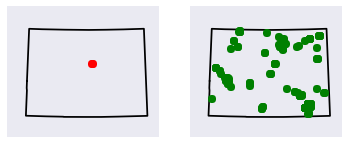

Year: 2013, Month: March
(0, 3) (89, 3)


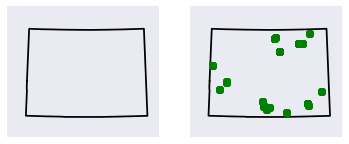

Year: 2014, Month: March
(0, 3) (142, 3)


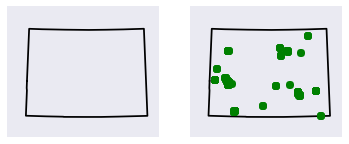

Year: 2015, Month: March
(0, 3) (131, 3)


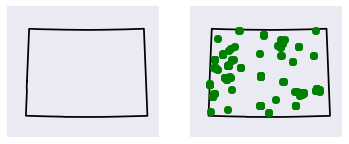

Year: 2012, Month: April
(0, 3) (67, 3)


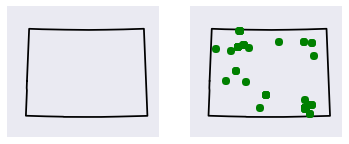

Year: 2013, Month: April
(0, 3) (45, 3)


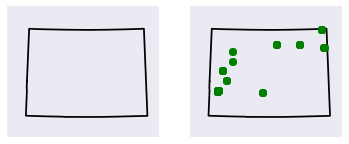

Year: 2014, Month: April
(0, 3) (78, 3)


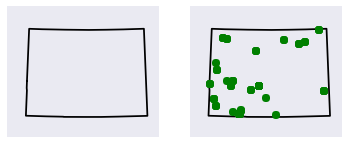

Year: 2015, Month: April
(1, 3) (79, 3)


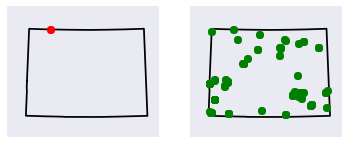

Year: 2012, Month: May
(25, 3) (132, 3)


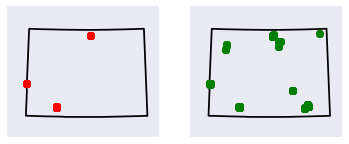

Year: 2013, Month: May
(0, 3) (24, 3)


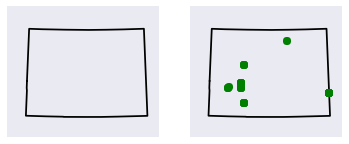

Year: 2014, Month: May
(0, 3) (69, 3)


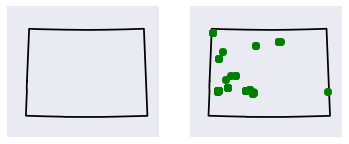

Year: 2015, Month: May
(0, 3) (23, 3)


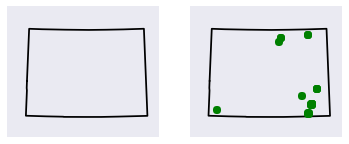

Year: 2012, Month: June
(2066, 3) (1700, 3)


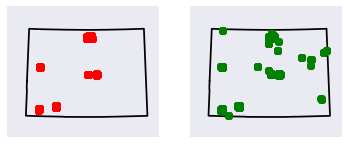

Year: 2013, Month: June
(842, 3) (2130, 3)


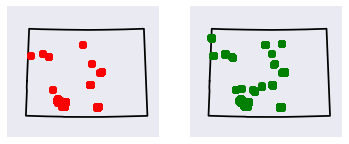

Year: 2014, Month: June
(0, 3) (62, 3)


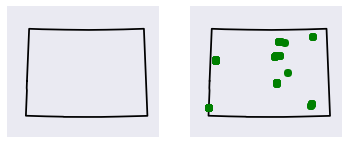

Year: 2015, Month: June
(0, 3) (37, 3)


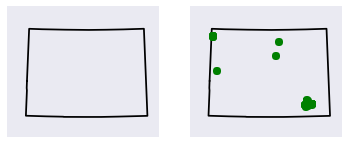

Year: 2012, Month: July
(47, 3) (91, 3)


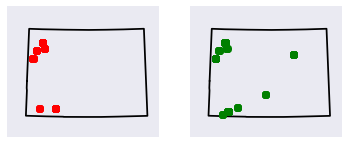

Year: 2013, Month: July
(31, 3) (223, 3)


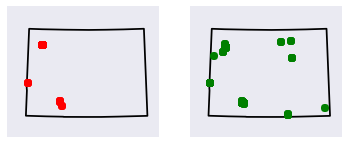

Year: 2014, Month: July
(0, 3) (79, 3)


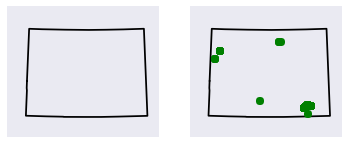

Year: 2015, Month: July
(0, 3) (17, 3)


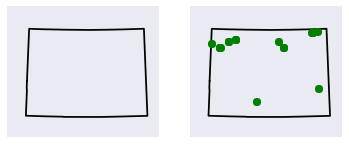

Year: 2012, Month: August
(9, 3) (111, 3)


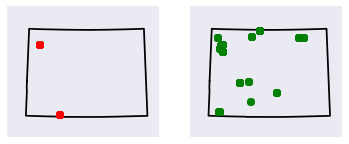

Year: 2013, Month: August
(0, 3) (133, 3)


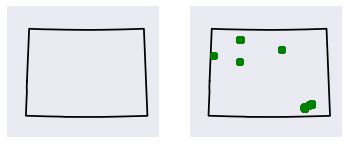

Year: 2014, Month: August
(0, 3) (67, 3)


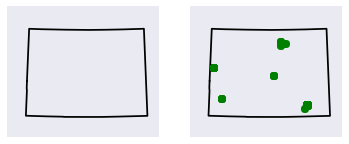

Year: 2015, Month: August
(3, 3) (36, 3)


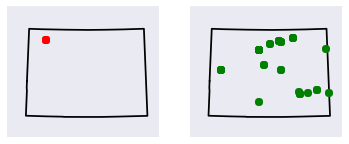

Year: 2012, Month: September
(0, 3) (21, 3)


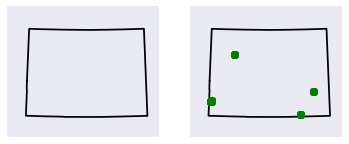

Year: 2013, Month: September
(0, 3) (9, 3)


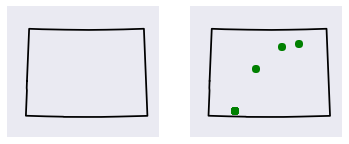

Year: 2014, Month: September
(0, 3) (81, 3)


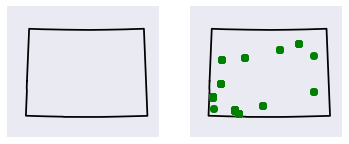

Year: 2015, Month: September
(0, 3) (54, 3)


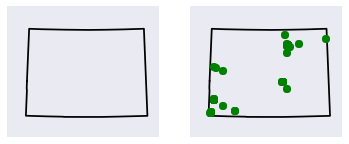

Year: 2012, Month: October
(65, 3) (261, 3)


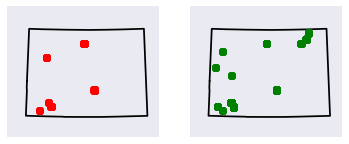

Year: 2013, Month: October
(0, 3) (15, 3)


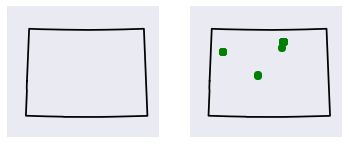

Year: 2014, Month: October
(0, 3) (118, 3)


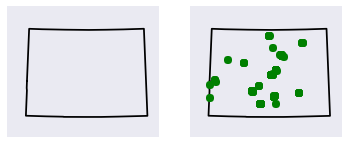

Year: 2015, Month: October
(0, 3) (92, 3)


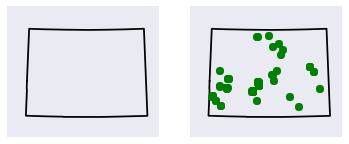

Year: 2012, Month: November
(36, 3) (138, 3)


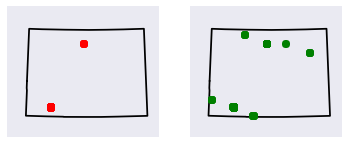

Year: 2013, Month: November
(0, 3) (66, 3)


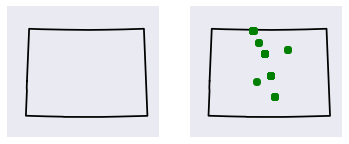

Year: 2014, Month: November
(0, 3) (26, 3)


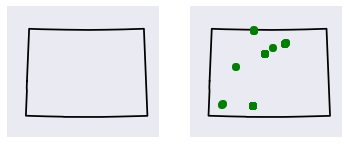

Year: 2015, Month: November
(0, 3) (50, 3)


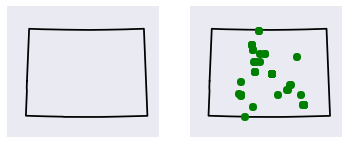

Year: 2012, Month: December
(18, 3) (6, 3)


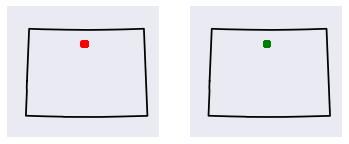

Year: 2013, Month: December
(0, 3) (12, 3)


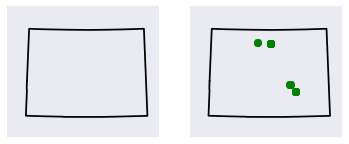

Year: 2014, Month: December
(0, 3) (1, 3)


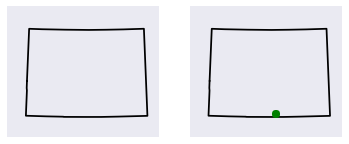

Year: 2015, Month: December
(0, 3) (4, 3)


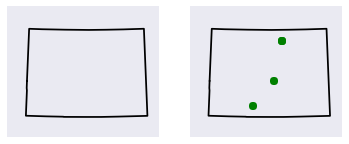

In [7]:
state_names = ['Colorado']
for month in months: 
    for year in years: 
        print 'Year: {}, Month: {}'.format(year, month)
        plot_states(year, state_names, months=[month])

Year: 2012, Month: January
(0, 3) (26, 3)


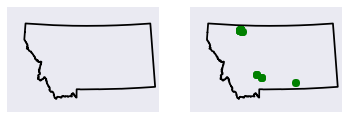

Year: 2013, Month: January
(0, 3) (32, 3)


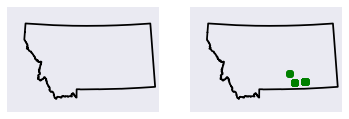

Year: 2014, Month: January
(0, 3) (10, 3)


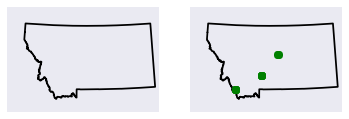

Year: 2015, Month: January
(0, 3) (14, 3)


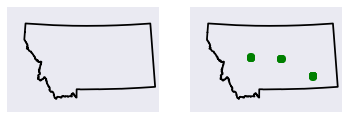

Year: 2012, Month: February
(0, 3) (0, 3)


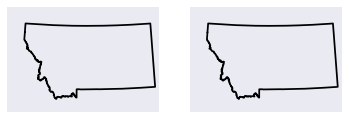

Year: 2013, Month: February
(0, 3) (0, 3)


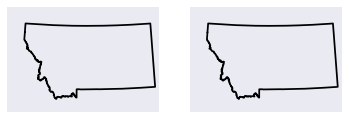

Year: 2014, Month: February
(0, 3) (0, 3)


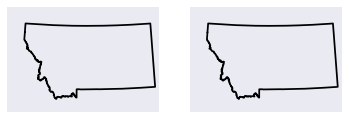

Year: 2015, Month: February
(0, 3) (3, 3)


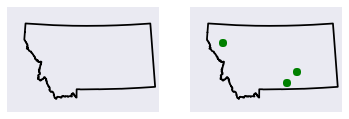

Year: 2012, Month: March
(0, 3) (78, 3)


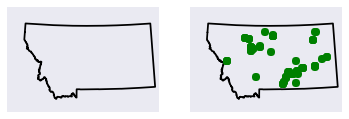

Year: 2013, Month: March
(0, 3) (257, 3)


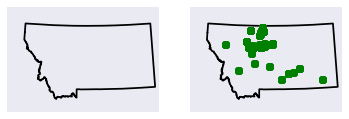

Year: 2014, Month: March
(0, 3) (2, 3)


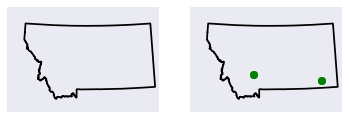

Year: 2015, Month: March
(0, 3) (193, 3)


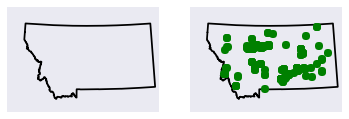

Year: 2012, Month: April
(0, 3) (273, 3)


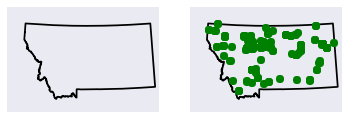

Year: 2013, Month: April
(0, 3) (374, 3)


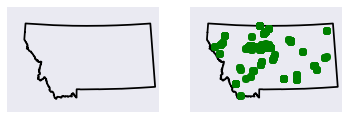

Year: 2014, Month: April
(0, 3) (929, 3)


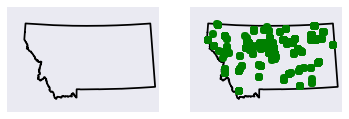

Year: 2015, Month: April
(0, 3) (469, 3)


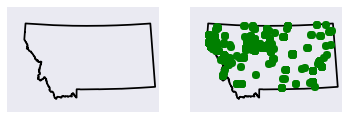

Year: 2012, Month: May
(3, 3) (257, 3)


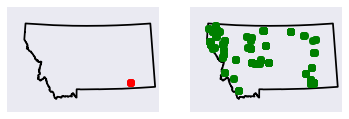

Year: 2013, Month: May
(0, 3) (409, 3)


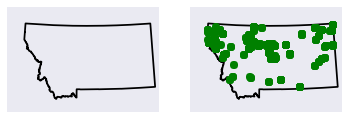

Year: 2014, Month: May
(0, 3) (490, 3)


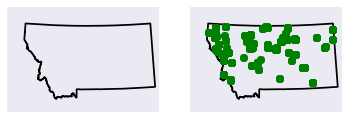

Year: 2015, Month: May
(0, 3) (77, 3)


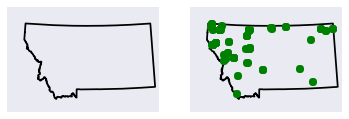

Year: 2012, Month: June
(1563, 3) (1603, 3)


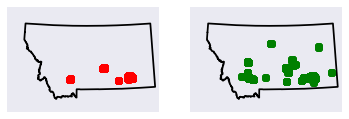

Year: 2013, Month: June
(0, 3) (18, 3)


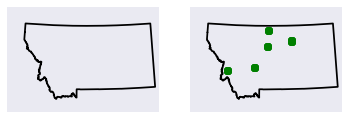

Year: 2014, Month: June
(6, 3) (30, 3)


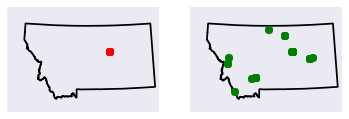

Year: 2015, Month: June
(0, 3) (25, 3)


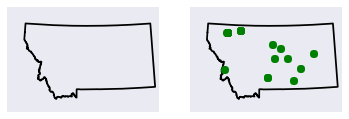

Year: 2012, Month: July
(1953, 3) (1793, 3)


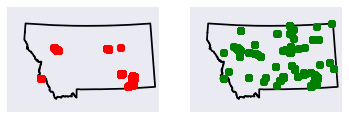

Year: 2013, Month: July
(505, 3) (961, 3)


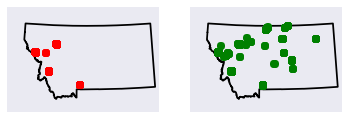

Year: 2014, Month: July
(32, 3) (164, 3)


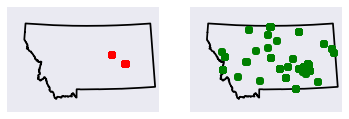

Year: 2015, Month: July
(74, 3) (144, 3)


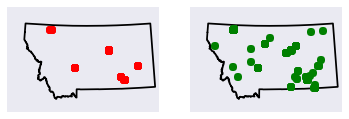

Year: 2012, Month: August
(1572, 3) (3964, 3)


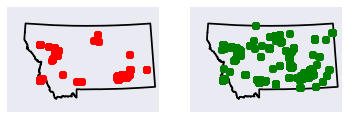

Year: 2013, Month: August
(601, 3) (1474, 3)


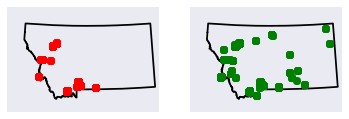

Year: 2014, Month: August
(29, 3) (288, 3)


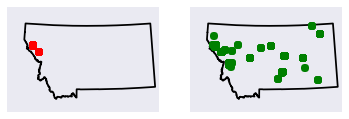

Year: 2015, Month: August
(1272, 3) (3090, 3)


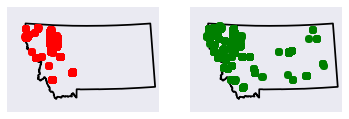

Year: 2012, Month: September
(406, 3) (2045, 3)


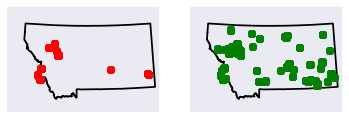

Year: 2013, Month: September
(17, 3) (284, 3)


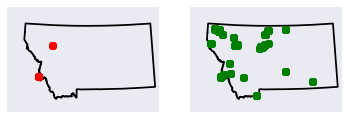

Year: 2014, Month: September
(0, 3) (514, 3)


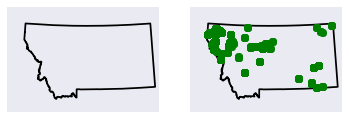

Year: 2015, Month: September
(47, 3) (301, 3)


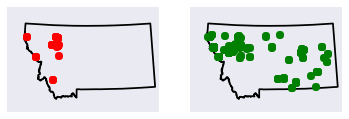

Year: 2012, Month: October
(3, 3) (345, 3)


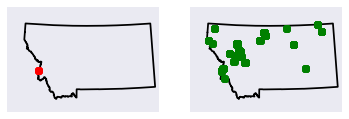

Year: 2013, Month: October
(0, 3) (208, 3)


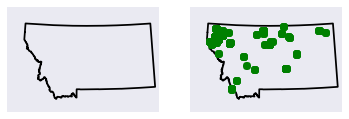

Year: 2014, Month: October
(0, 3) (410, 3)


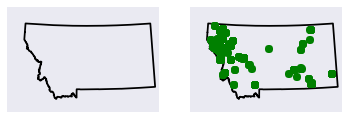

Year: 2015, Month: October
(2, 3) (148, 3)


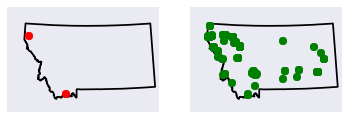

Year: 2012, Month: November
(0, 3) (155, 3)


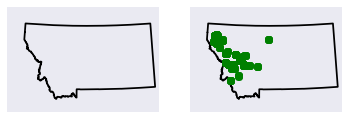

Year: 2013, Month: November
(0, 3) (146, 3)


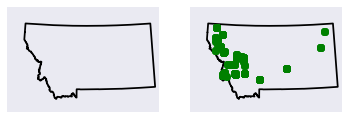

Year: 2014, Month: November
(0, 3) (64, 3)


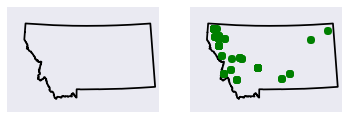

Year: 2015, Month: November
(0, 3) (37, 3)


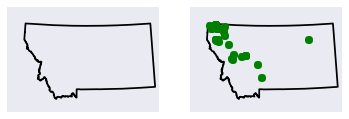

Year: 2012, Month: December
(0, 3) (3, 3)


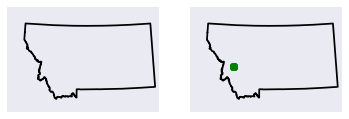

Year: 2013, Month: December
(0, 3) (9, 3)


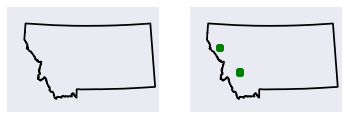

Year: 2014, Month: December
(0, 3) (19, 3)


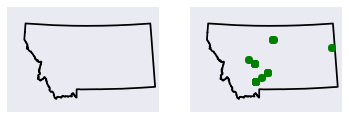

Year: 2015, Month: December
(0, 3) (7, 3)


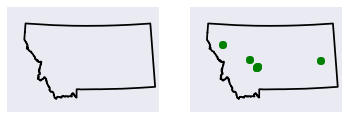

In [8]:
state_names = ['Montana']
for month in months: 
    for year in years: 
        print 'Year: {}, Month: {}'.format(year, month)
        plot_states(year, state_names, months=[month])

Year: 2012, Month: January
(0, 3) (12, 3)


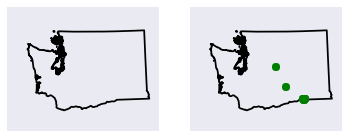

Year: 2013, Month: January
(0, 3) (8, 3)


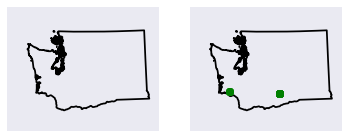

Year: 2014, Month: January
(0, 3) (61, 3)


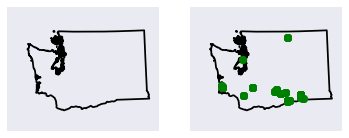

Year: 2015, Month: January
(0, 3) (1, 3)


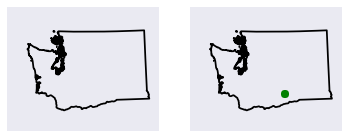

Year: 2012, Month: February
(0, 3) (4, 3)


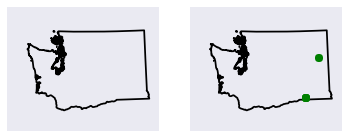

Year: 2013, Month: February
(0, 3) (51, 3)


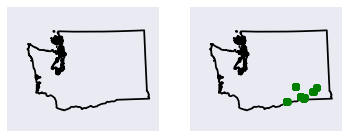

Year: 2014, Month: February
(0, 3) (65, 3)


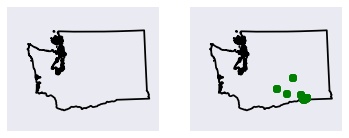

Year: 2015, Month: February
(0, 3) (40, 3)


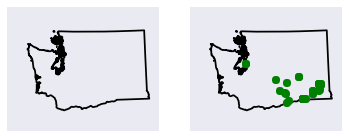

Year: 2012, Month: March
(0, 3) (92, 3)


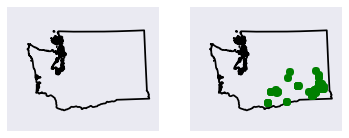

Year: 2013, Month: March
(0, 3) (153, 3)


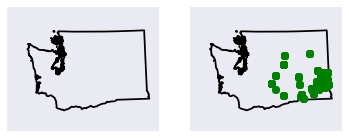

Year: 2014, Month: March
(0, 3) (437, 3)


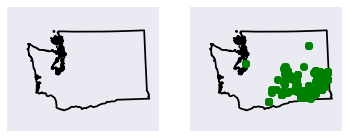

Year: 2015, Month: March
(0, 3) (187, 3)


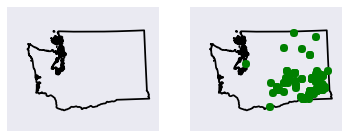

Year: 2012, Month: April
(0, 3) (195, 3)


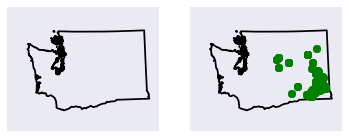

Year: 2013, Month: April
(0, 3) (303, 3)


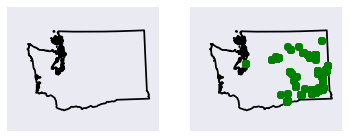

Year: 2014, Month: April
(0, 3) (373, 3)


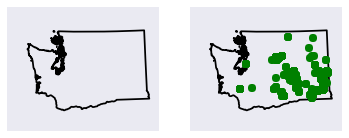

Year: 2015, Month: April
(0, 3) (109, 3)


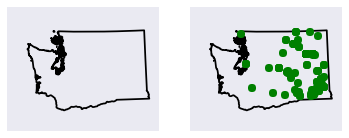

Year: 2012, Month: May
(0, 3) (131, 3)


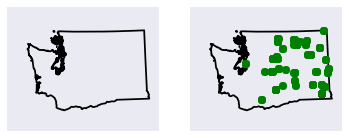

Year: 2013, Month: May
(0, 3) (165, 3)


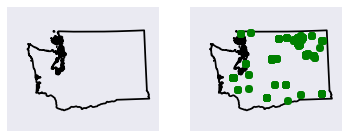

Year: 2014, Month: May
(0, 3) (153, 3)


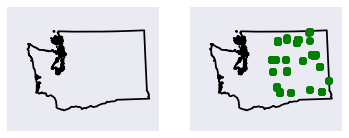

Year: 2015, Month: May
(0, 3) (44, 3)


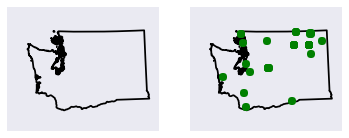

Year: 2012, Month: June
(0, 3) (18, 3)


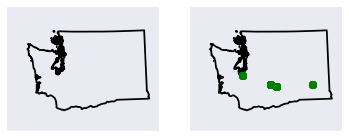

Year: 2013, Month: June
(0, 3) (56, 3)


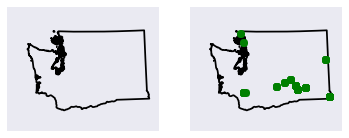

Year: 2014, Month: June
(0, 3) (124, 3)


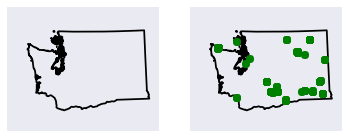

Year: 2015, Month: June
(5, 3) (82, 3)


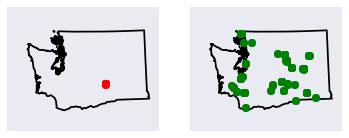

Year: 2012, Month: July
(6, 3) (212, 3)


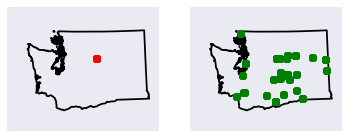

Year: 2013, Month: July
(1092, 3) (871, 3)


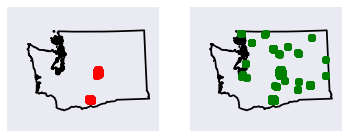

Year: 2014, Month: July
(3376, 3) (2260, 3)


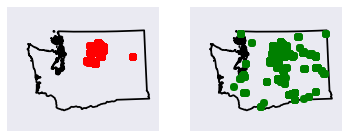

Year: 2015, Month: July
(156, 3) (486, 3)


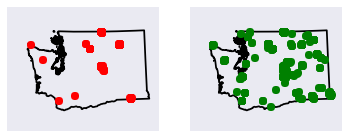

Year: 2012, Month: August
(436, 3) (723, 3)


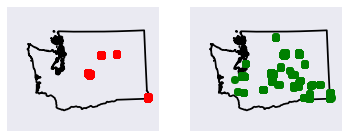

Year: 2013, Month: August
(218, 3) (433, 3)


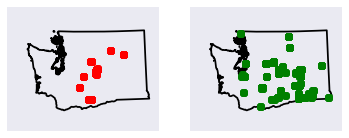

Year: 2014, Month: August
(1941, 3) (2635, 3)


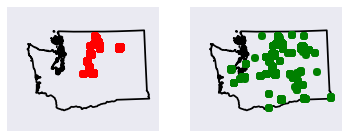

Year: 2015, Month: August
(14647, 3) (10548, 3)


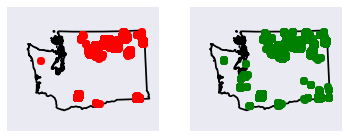

Year: 2012, Month: September
(2774, 3) (3871, 3)


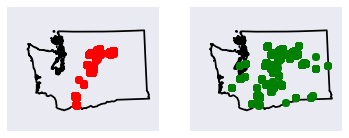

Year: 2013, Month: September
(0, 3) (322, 3)


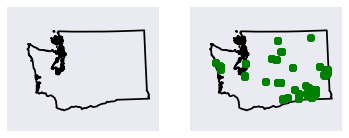

Year: 2014, Month: September
(0, 3) (469, 3)


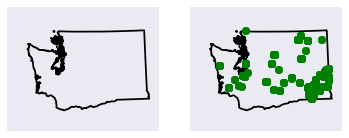

Year: 2015, Month: September
(120, 3) (177, 3)


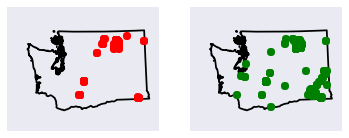

Year: 2012, Month: October
(396, 3) (646, 3)


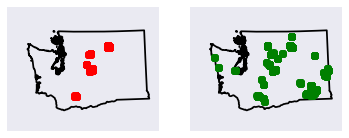

Year: 2013, Month: October
(0, 3) (469, 3)


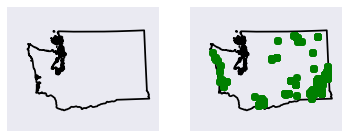

Year: 2014, Month: October
(0, 3) (530, 3)


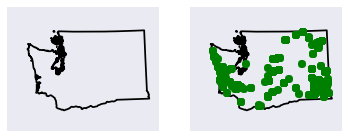

Year: 2015, Month: October
(4, 3) (175, 3)


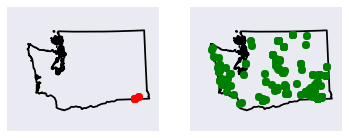

Year: 2012, Month: November
(0, 3) (44, 3)


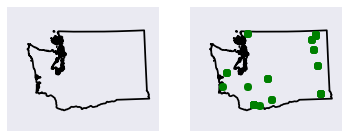

Year: 2013, Month: November
(0, 3) (102, 3)


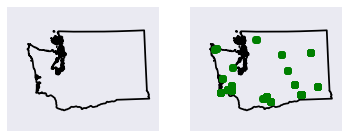

Year: 2014, Month: November
(0, 3) (188, 3)


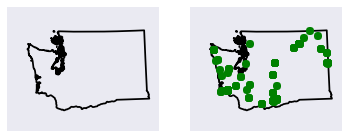

Year: 2015, Month: November
(0, 3) (167, 3)


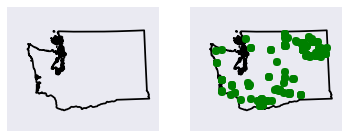

Year: 2012, Month: December
(0, 3) (0, 3)


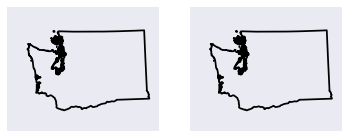

Year: 2013, Month: December
(0, 3) (36, 3)


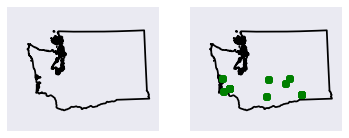

Year: 2014, Month: December
(0, 3) (22, 3)


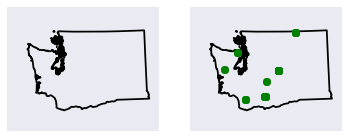

Year: 2015, Month: December
(0, 3) (3, 3)


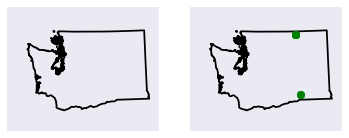

In [9]:
state_names = ['Washington']
for month in months: 
    for year in years: 
        print 'Year: {}, Month: {}'.format(year, month)
        plot_states(year, state_names, months=[month])

Year: 2012, Month: January
(0, 3) (620, 3)


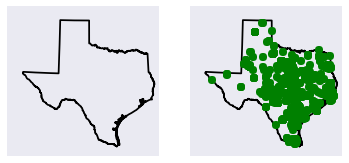

Year: 2013, Month: January
(0, 3) (803, 3)


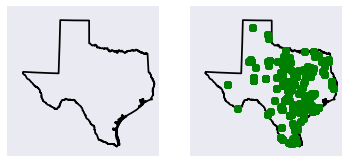

Year: 2014, Month: January
(0, 3) (1624, 3)


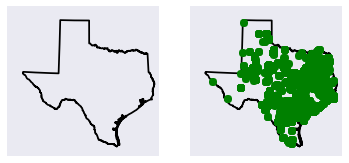

Year: 2015, Month: January
(0, 3) (535, 3)


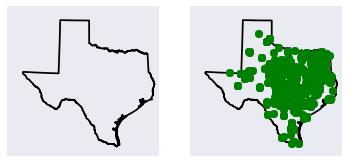

Year: 2012, Month: February
(0, 3) (351, 3)


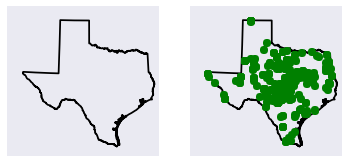

Year: 2013, Month: February
(0, 3) (1520, 3)


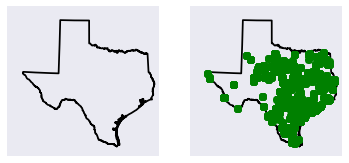

Year: 2014, Month: February
(0, 3) (920, 3)


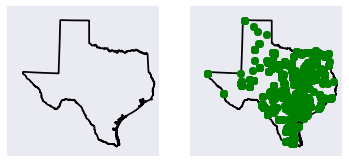

Year: 2015, Month: February
(0, 3) (842, 3)


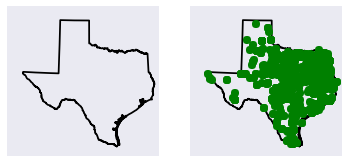

Year: 2012, Month: March
(0, 3) (631, 3)


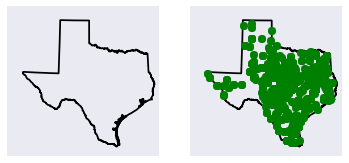

Year: 2013, Month: March
(0, 3) (2754, 3)


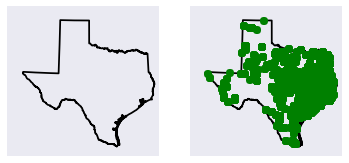

Year: 2014, Month: March
(0, 3) (2012, 3)


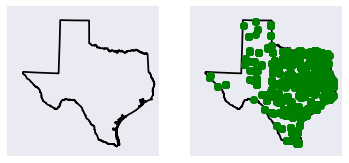

Year: 2015, Month: March
(0, 3) (671, 3)


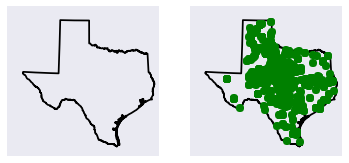

Year: 2012, Month: April
(0, 3) (542, 3)


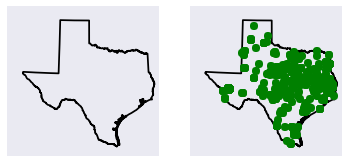

Year: 2013, Month: April
(0, 3) (1388, 3)


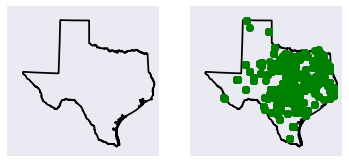

Year: 2014, Month: April
(0, 3) (1722, 3)


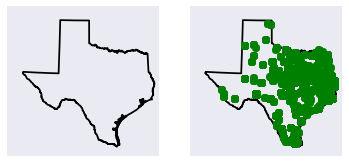

Year: 2015, Month: April
(0, 3) (335, 3)


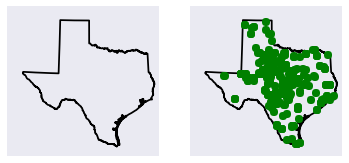

Year: 2012, Month: May
(6, 3) (621, 3)


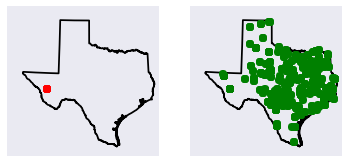

Year: 2013, Month: May
(0, 3) (862, 3)


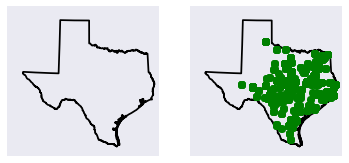

Year: 2014, Month: May
(0, 3) (1035, 3)


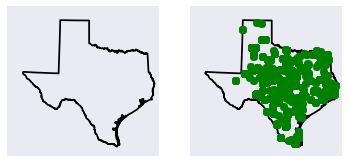

Year: 2015, Month: May
(0, 3) (218, 3)


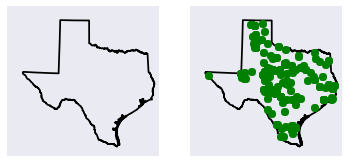

Year: 2012, Month: June
(0, 3) (1024, 3)


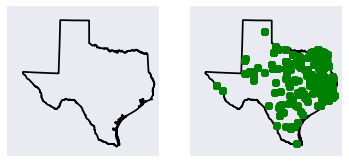

Year: 2013, Month: June
(0, 3) (918, 3)


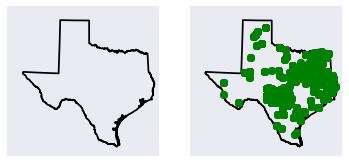

Year: 2014, Month: June
(0, 3) (892, 3)


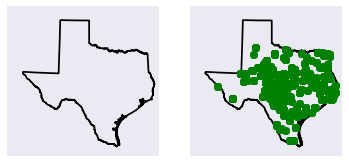

Year: 2015, Month: June
(0, 3) (410, 3)


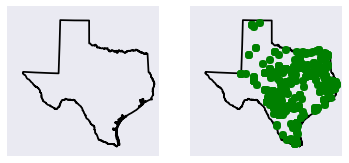

Year: 2012, Month: July
(0, 3) (745, 3)


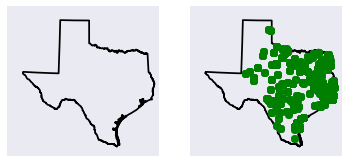

Year: 2013, Month: July
(0, 3) (762, 3)


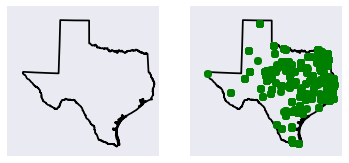

Year: 2014, Month: July
(0, 3) (970, 3)


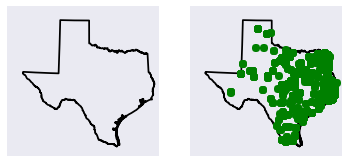

Year: 2015, Month: July
(0, 3) (445, 3)


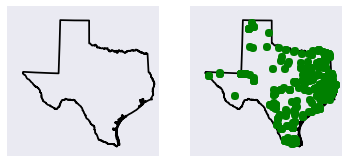

Year: 2012, Month: August
(0, 3) (1019, 3)


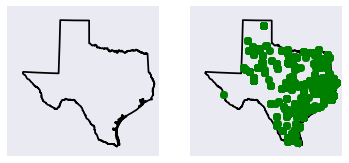

Year: 2013, Month: August
(0, 3) (724, 3)


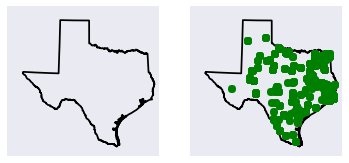

Year: 2014, Month: August
(0, 3) (1029, 3)


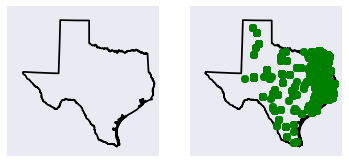

Year: 2015, Month: August
(0, 3) (1036, 3)


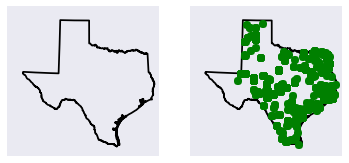

Year: 2012, Month: September
(0, 3) (1515, 3)


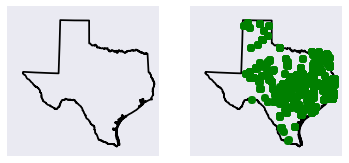

Year: 2013, Month: September
(0, 3) (1469, 3)


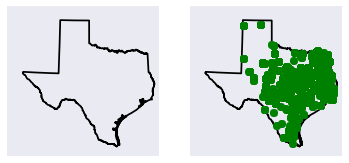

Year: 2014, Month: September
(0, 3) (830, 3)


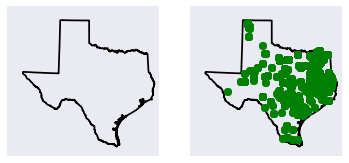

Year: 2015, Month: September
(0, 3) (534, 3)


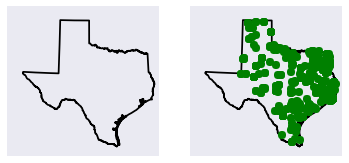

Year: 2012, Month: October
(0, 3) (2206, 3)


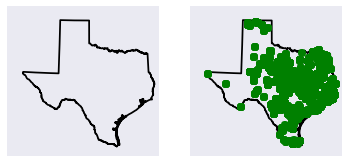

Year: 2013, Month: October
(0, 3) (1512, 3)


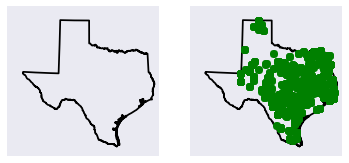

Year: 2014, Month: October
(0, 3) (1665, 3)


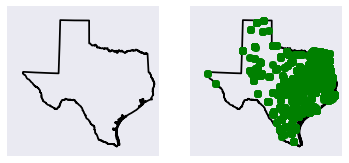

Year: 2015, Month: October
(21, 3) (778, 3)


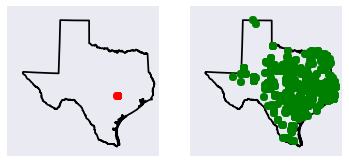

Year: 2012, Month: November
(0, 3) (1304, 3)


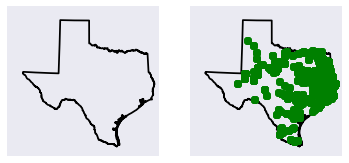

Year: 2013, Month: November
(0, 3) (500, 3)


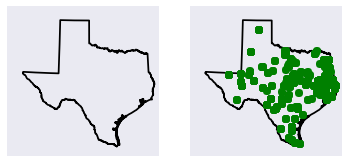

Year: 2014, Month: November
(0, 3) (828, 3)


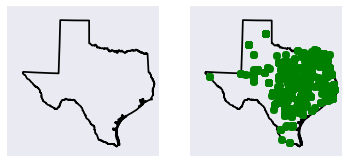

Year: 2015, Month: November
(0, 3) (319, 3)


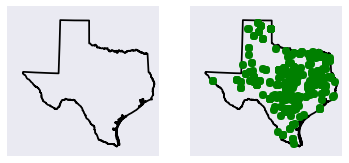

Year: 2012, Month: December
(0, 3) (700, 3)


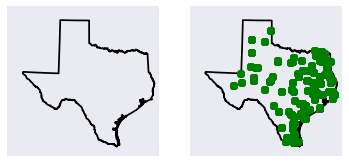

Year: 2013, Month: December
(0, 3) (400, 3)


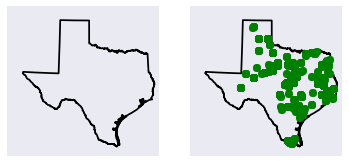

Year: 2014, Month: December
(0, 3) (417, 3)


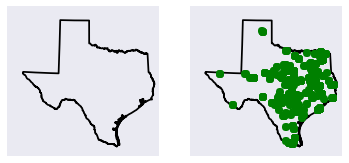

Year: 2015, Month: December
(0, 3) (471, 3)


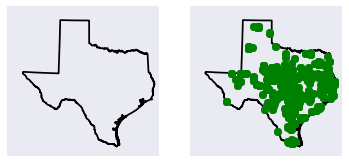

In [10]:
state_names = ['Texas']
for month in months: 
    for year in years: 
        print 'Year: {}, Month: {}'.format(year, month)
        plot_states(year, state_names, months=[month])

In the above set of plots, for each state I have plotted for each year and month of the data (2012-2015): 

1. One plot of the state with all observations that I've labeled as forest-fires (a forest-fire being an observation whose lat/long coordinates fell within a forest-fire perimeter boundary submitted by a state for a given day). This is the left plot, where the forest-fires are plotted as red points. 
2. One plot of the state will all observations that I've labeled as non forest-fires (an observation whose lat/long coordinates did not fall within a forest-fire perimeter boundary submitted by a state for a given day). This is the right plot, where the non forest-fires are plotted as green points. 

From the above plots, it seems clear to me that forest-fire observations do clump together; this was the first pattern that I set out to look for in this notebook. I think that it's pretty easy to see from the above plots that in the left plots with forest-fires, the forest-fires fall into a relatively small, clustered groups. This is strikingly different from the right plots with non forest-fires, where the observations are all over the place; they clearly do not fall into relatively small, clustered groups. To highlight this, we can look at one of the following plots from a year/month of each of the plotted states: 

1. California - June 2013, where 369 forest-fire observations are grouped into three distinct clusters. 
2. Colorado - June 2012, where 2066 forest-fire observations are grouped into five distinct clusters. 
3. Montana - June 2012, where 1593 forest-fire observations are grouped into four distinct clusters. 
4. Washington - July 2013, where 1092 forest-fire observations are grouped into two distinct clusters. 
5. Texas - October 2015, where 21 forest-fire observations are grouped into a distinct cluster (unfortunately this is just about the only month that Texas is showing forest-fires in my data set). 

The presence/absence of the second pattern does not seem apparent to me from the above plots. I think that in order to fully explore this, I need to do these plots in a more aggregate fashion. I think I need to plot the fires/non-fires across year and state, and not plot by month within the years. 

Year: 2012
(7881, 3) (13265, 3)


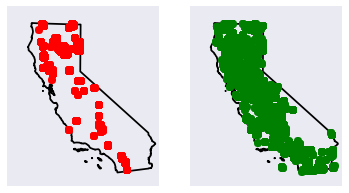

Year: 2013
(11270, 3) (11715, 3)


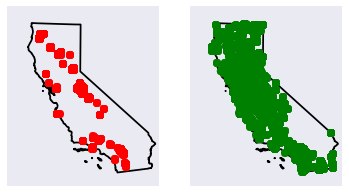

Year: 2014
(9139, 3) (12661, 3)


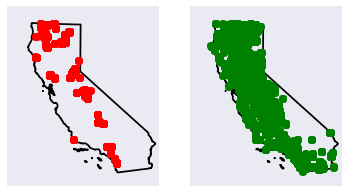

Year: 2015
(6626, 3) (10055, 3)


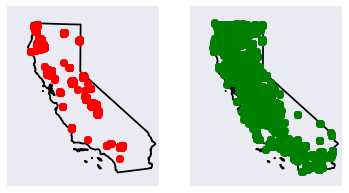

In [11]:
state_names = ['California']
for year in years: 
    print 'Year: {}'.format(year)
    plot_states(year, state_names)

Year: 2012
(2268, 3) (2734, 3)


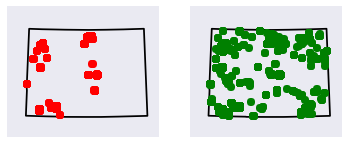

Year: 2013
(873, 3) (2792, 3)


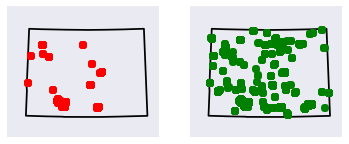

Year: 2014
(0, 3) (749, 3)


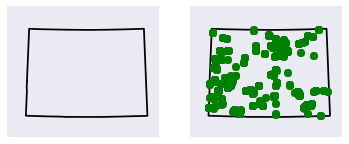

Year: 2015
(4, 3) (560, 3)


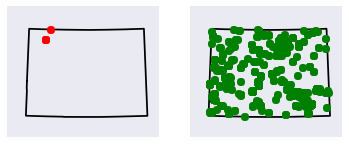

In [12]:
state_names = ['Colorado']
for year in years: 
    print 'Year: {}'.format(year)
    plot_states(year, state_names)

Year: 2012
(5500, 3) (10542, 3)


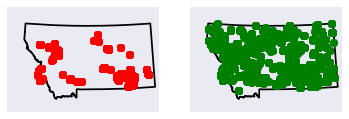

Year: 2013
(1123, 3) (4172, 3)


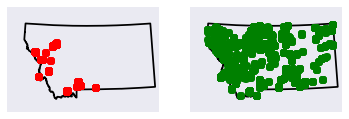

Year: 2014
(67, 3) (2920, 3)


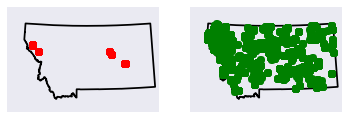

Year: 2015
(1395, 3) (4508, 3)


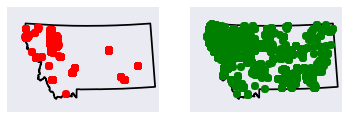

In [13]:
state_names = ['Montana']
for year in years: 
    print 'Year: {}'.format(year)
    plot_states(year, state_names)

Year: 2012
(3612, 3) (5948, 3)


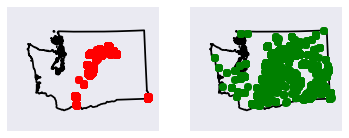

Year: 2013
(1310, 3) (2969, 3)


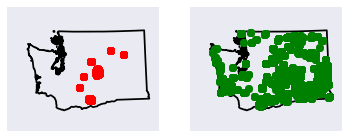

Year: 2014
(5317, 3) (7317, 3)


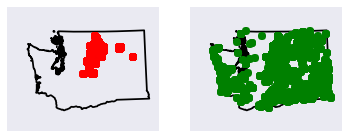

Year: 2015
(14932, 3) (12019, 3)


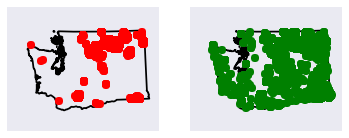

In [14]:
state_names = ['Washington']
for year in years: 
    print 'Year: {}'.format(year)
    plot_states(year, state_names)

Year: 2012
(6, 3) (11278, 3)


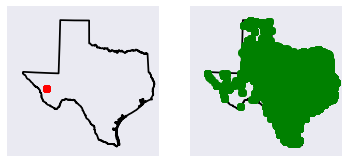

Year: 2013
(0, 3) (13612, 3)


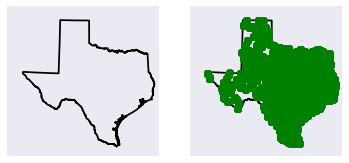

Year: 2014
(0, 3) (13944, 3)


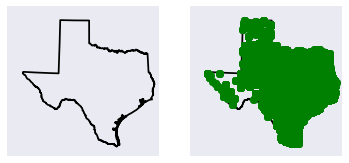

Year: 2015
(21, 3) (6594, 3)


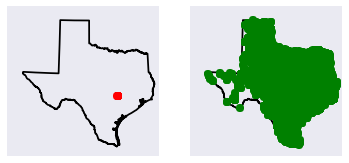

In [15]:
state_names = ['Texas']
for year in years: 
    print 'Year: {}'.format(year)
    plot_states(year, state_names)

If we look at the plots of all fires/non-fires across years, and again across our five states, we have a couple of reasonable looking states, and a couple that look off. 

For California, Washington, and Monatana, we see what looks like a resonable number of forest-fires. Without doing a ton of research or having expertise about the fire landscape for each of these states for the given years, nothing looks out of place. The number of forest-fires that the above plots are showing looks reasonable. 

For Colorado and Texas, however, we see very few, if any, forest-fires in some years. In Colorado, we see no forest-fires in 2014, and only a few (4) in 2015. This seems pretty unlikely, given the historical prevelance of fires in Colorado. If we Google around and do some research about the 2014 fire season, we can find resources that indicate that were fires in this year - [this](http://www.coloradoindependent.com/150405/colorado-wildfire-activity-near-historic-low-this-year) resource suggests that while the 2014 season was mild, there were reasonably sized forest-fires that we would expect to show up in my plots. In Texas, we see no forest-fires in 2013 or 2014, and very few in 2012 and 2015. Again, we can Google around to find evidence that there were forest-fires in Texas in [2013](https://www.ncdc.noaa.gov/sotc/fire/201303), and in [2014](http://amarillo.com/news/local-news/2014-05-16/double-diamond-fire-investigation-cause-continues). 

The lack of forest-fires in CO and TX in those years suggests that one of the following is occuring: 

1. I am not correctly merging potential forest-fires (i.e. their observations lat/long coordinates) into forest-fire perimeter boundaries. 
2. The forest-fire periemter boundaries submitted by states are not complete. 

Either of these seems plausible, although given the fact that we see large numbers of forest-fires in some states and not others, it seems like (2) is more plausible. It seems more likely that the variability is not due to (1), as that would most likely effect all states equally. In that regard, I'm going to start off looking into (2). The first thing to check for (2) is whether or not there are actually any forest-fire perimeter boundaries in my data for those years for CO and TX. It turns out there are; the next step is to work on plotting the perimeter boundaries and trying to visualize why they are not lining up. 

In [16]:
def grab_fire_perimeters(dt, st_name, st_abbrev, st_fips, county=False): 
    """Grab the fire perimter boundaries for a given state and year.
    
    Args: 
        dt: str
        st_name: str
            State name of boundaries to grab. 
        st_abbrev: str
            State abbreviation used for bash script. 
        st_fips: str
            State fips used for bash script. 
            
    Return: Shapefile features. 
    """
            
    # Run bash script to pull the right boundaries from Postgres. 
    subprocess.call("./grab_perim_boundary.sh {} {} {}".format(st_abbrev, st_fips, dt), shell=True)
    
    filepath = 'data/{}/{}_{}_2D'.format(st_abbrev, st_abbrev, dt)
    return filepath

def plot_st_fires_boundaries(dt, st_name, st_abbrev, st_fips): 
    """Plot the fire boundaries for a year and given state.
    
    Args
    ----
        dt: str
            Contains date of boundaries to grab. 
        state_name: str
            Holds state to plot. 
        st_abbrev: str
            Holds the states two-letter abbreviation. 
        st_fips: str
            Holds the state's fips number. 
        
    Return: Plotted Basemap
    """
    
    boundaries_filepath = grab_fire_perimeters(dt, st_name, st_abbrev, st_fips)
    st_map = USMapBuilder('data/state_shapefiles_2014/cb_2014_us_state_500k2.shp', geo_level='State', 
                          state_names=[st_name], border_padding=1)
    st_map.plot_boundary(boundaries_filepath)
    plt.show()

Year: 2012


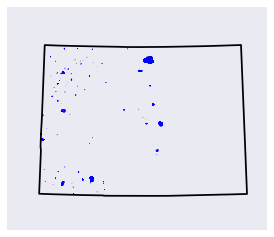

Year: 2013


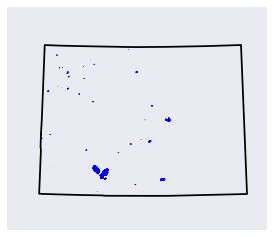

Year: 2014


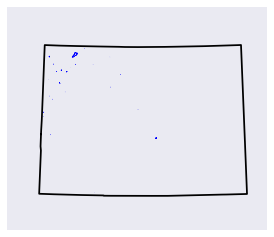

Year: 2015


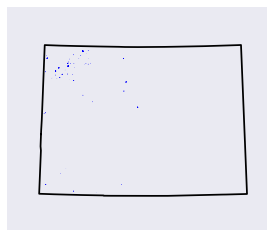

In [17]:
for year in years: 
    print 'Year: {}'.format(year)
    plot_st_fires_boundaries(str(year), 'Colorado', 'co', '08')

Year: 2012


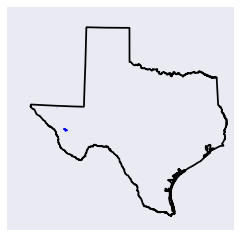

Year: 2013


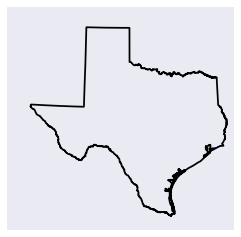

Year: 2014


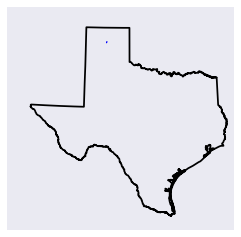

Year: 2015


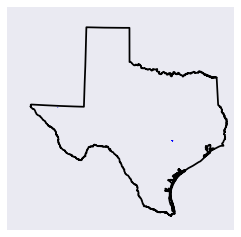

In [18]:
for year in years: 
    print 'Year: {}'.format(year)
    plot_st_fires_boundaries(str(year), 'Texas', 'tx', '48')

The above plots seem to suggeset that a little of both hypothesis are occuring. That is: 
    
1. I am not correctly merging potential forest-fires (i.e. their observations lat/long coordinates) into forest-fire perimeter boundaries.
2. The forest-fire periemter boundaries submitted by states are not complete.

In CO, we can see that there are plenty of forest-fire perimeter boundaries in 2014 and 2015, despite the low number of observations that I am labeling as fires. This suggests that (1) is occuring for those years in CO. If we look at Texas, though, we see that in 2013, the only forest-fire perimeter boundaries (denoted in blue) are given on one of the southeast edges. The [article](https://www.ncdc.noaa.gov/sotc/fire/201303) that I found for 2013, though, suggests that there were sizeable fires near Mother Neff State Park, which is in the center of the state. 

The next steps are to actually look at individual counties. For CO, I need to figure out why no observations are getting labeled as forest-fires. In this case, I'll plot all obs. around a given county that I know had a forest-fire in it. Then, I'll hopefully be able to figure out why obs. are not getting labeled as forest-fires. Are they not actually falling within the boundaries, or are the dates not lining up, or what? For TX, I need to plot the county where the fire near Mother Neff State Park occured, and see if there are observations there (I'll also double check that I didn't miss a fire-perimeter boundary there). 

In [19]:
def plot_counties_fires_boundaries(year, state_name, st_abbrev, st_fips, county_name, 
                                   months=None, plotting=True, markersize=4): 
    """Plot a county map in a given state, including any fire perimeter boundaries and potentially
    detected fires in those counties. 
    
    Args: 
        year: str
        state_name: str
            State name to grab for plotting. 
        st_abbrev: str
            Holds the states two-letter abbrevation
        st_fips: str
            Holds the state's fips number. 
        county_name: str or iterable of strings 
            County names to grab for plotting. 
        months: set (or other iterable) of strings (optional)
            Month names to grab for plotting
        plotting: bool
            Whether or not to format the data for plotting. 
    """
    
    county_name = county_name if isinstance(county_name, list) else [county_name]
    county_map = USMapBuilder('data/county_shapefiles_2014/cb_2014.shp', geo_level='County', 
                state_names=[state_name], county_names=county_name, figsize=(40, 20), border_padding=0.1)
    boundaries_filepath = grab_fire_perimeters(year, state_name, st_abbrev, st_fips)
    county_map.plot_boundary(boundaries_filepath)
    if plotting: 
        fires_data = read_n_parse(year, state_name, months=months, plotting=plotting)
        county_map.plot_points(fires_data, markersize)
    plt.show()

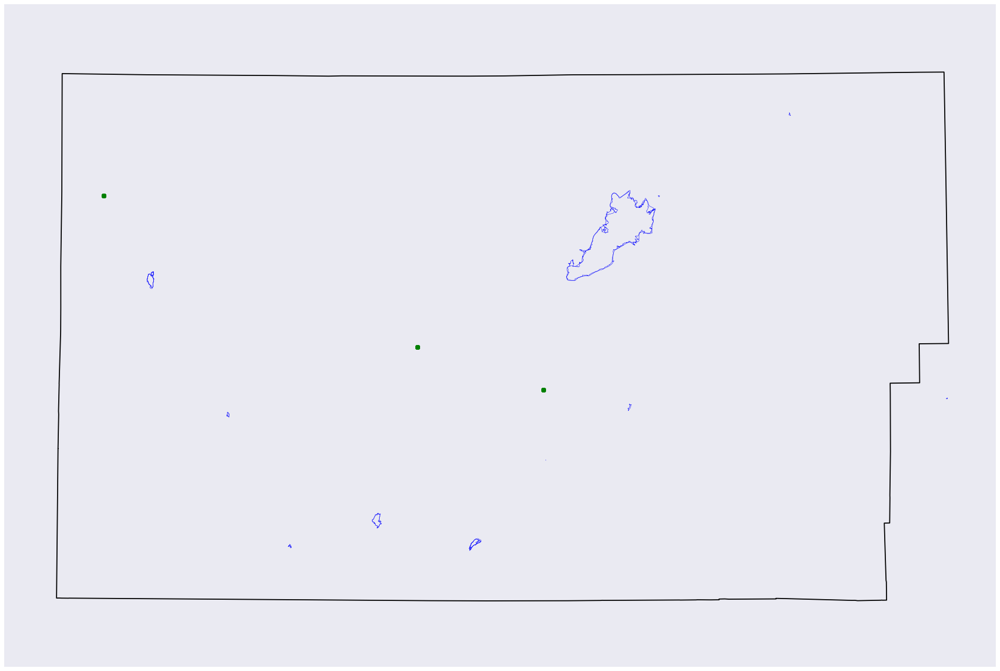

In [20]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Moffat', markersize=8)

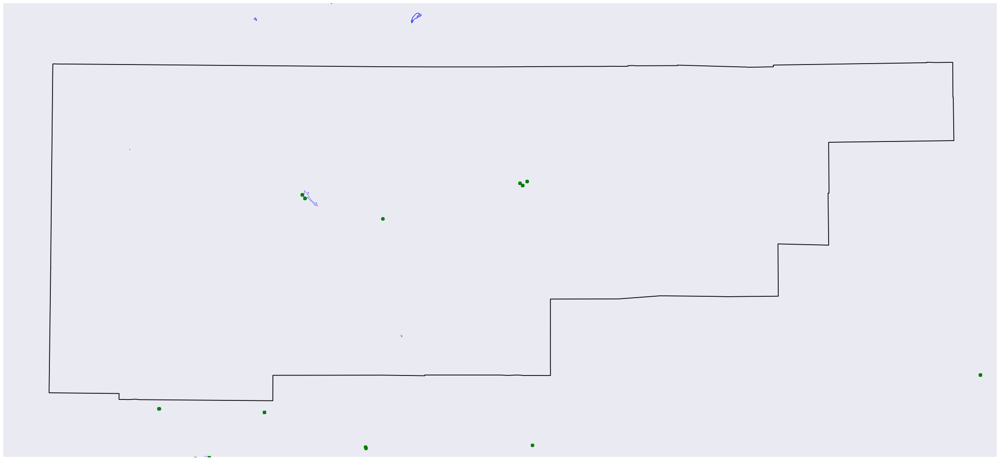

In [21]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Rio Blanco', markersize=8)

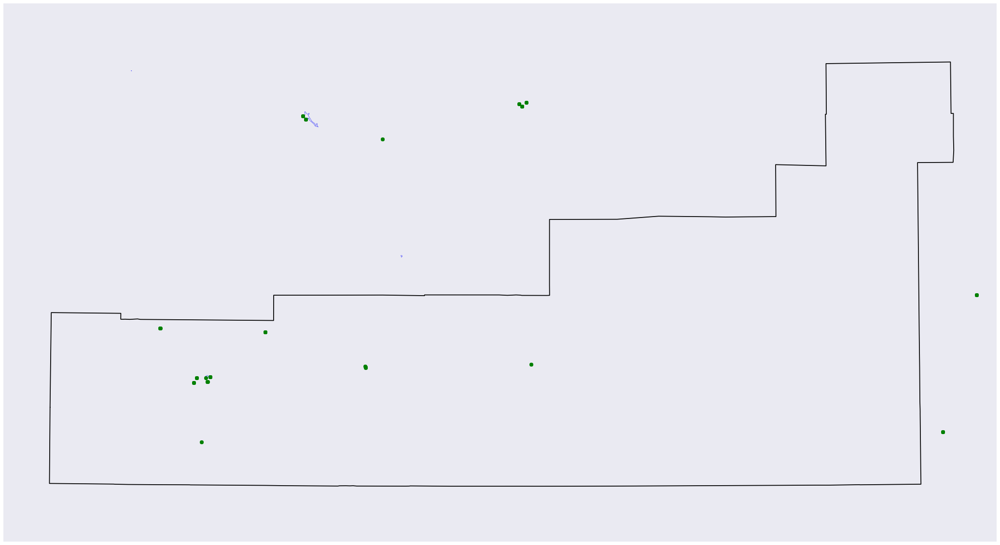

In [22]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Garfield', markersize=8)

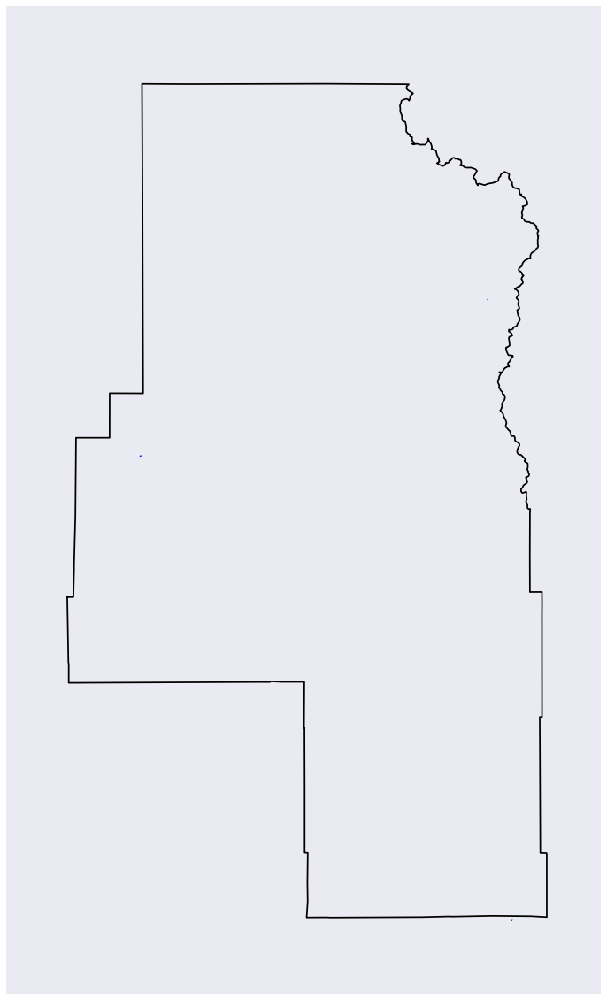

In [23]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Routt', markersize=8)

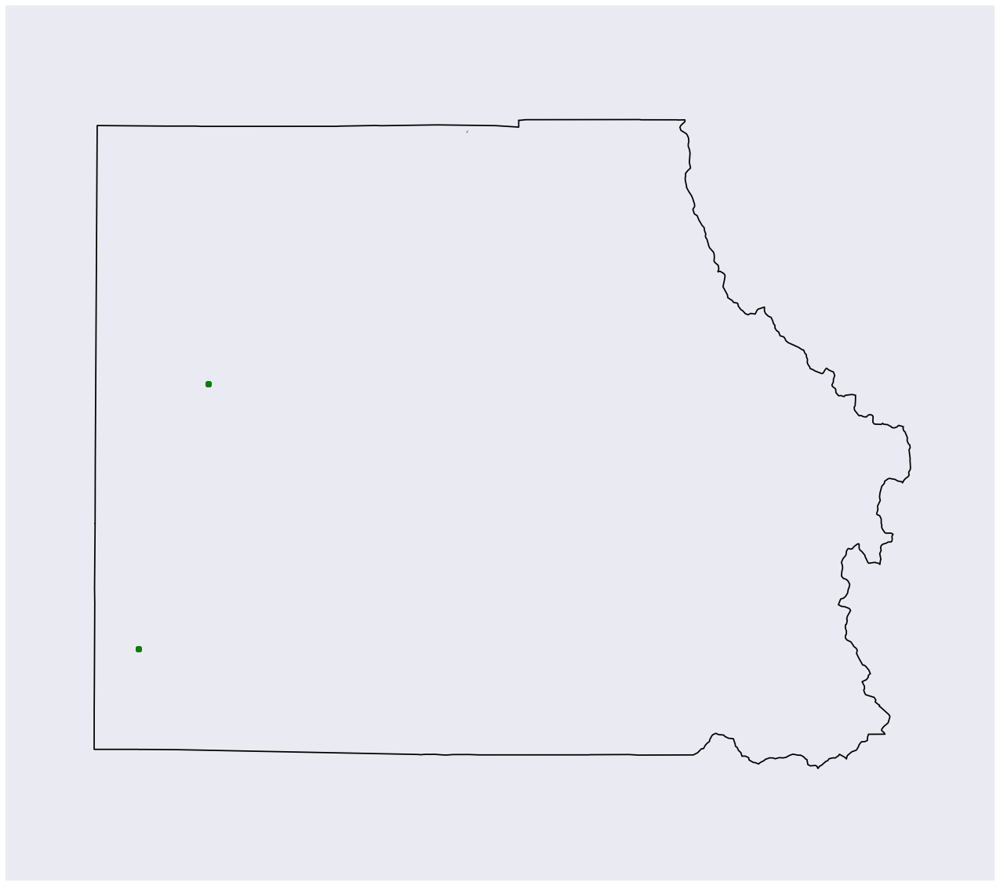

In [24]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Eagle', markersize=8)

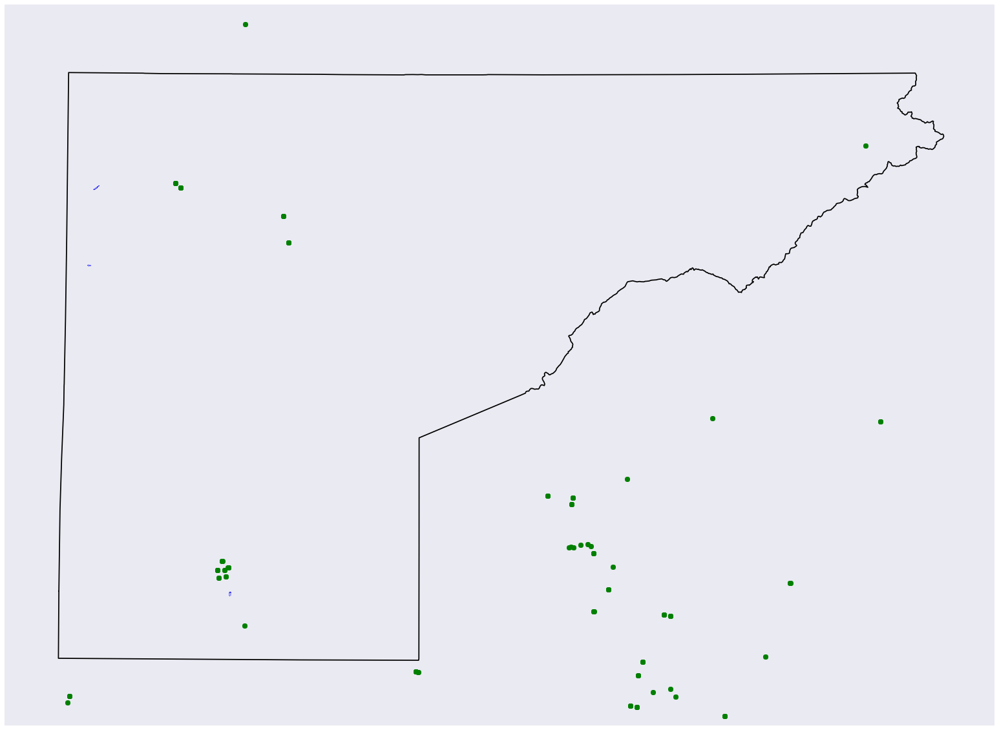

In [25]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Mesa', markersize=8)

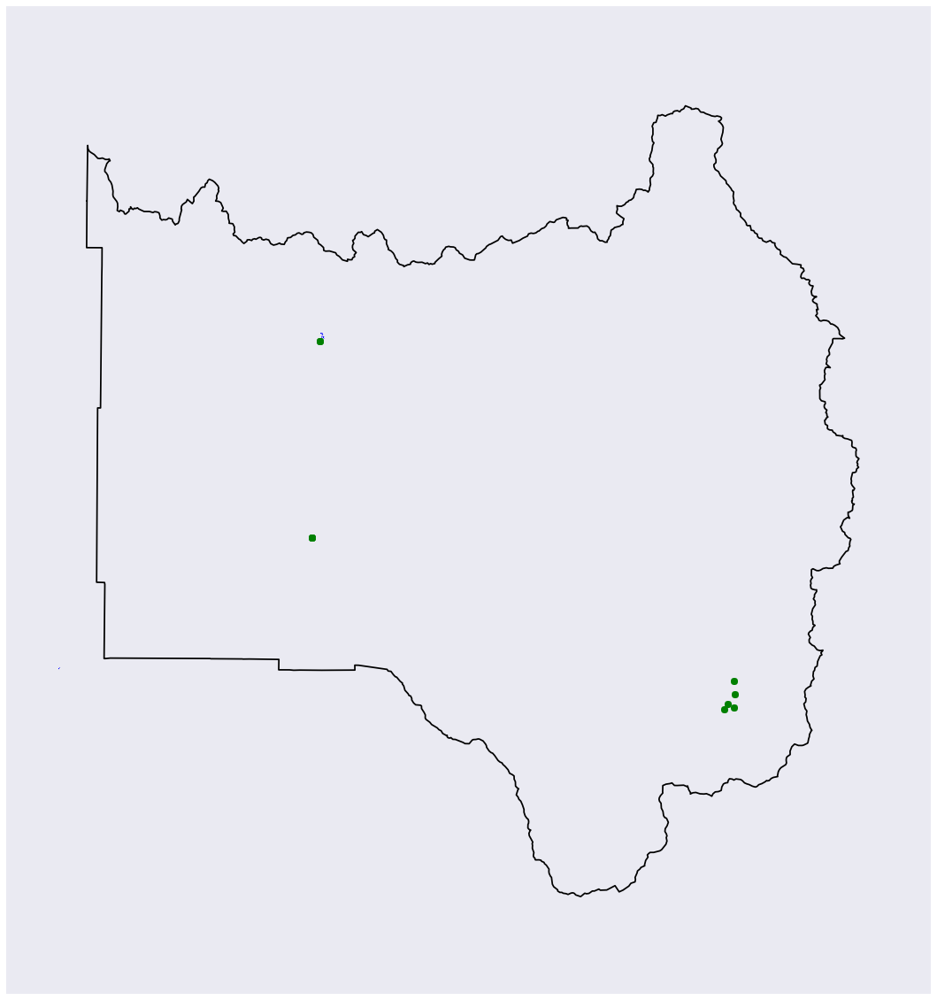

In [26]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Grand', markersize=8)

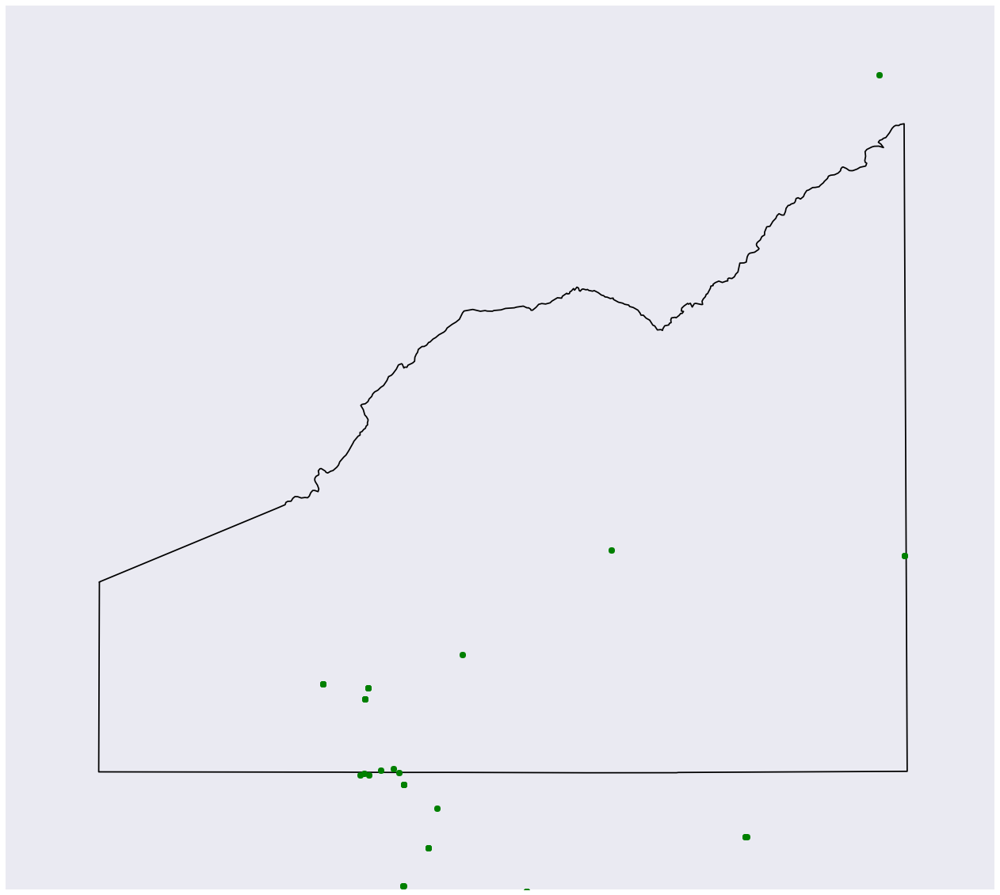

In [27]:
plot_counties_fires_boundaries(2014, 'Colorado', 'co', '08', 'Delta', markersize=8)

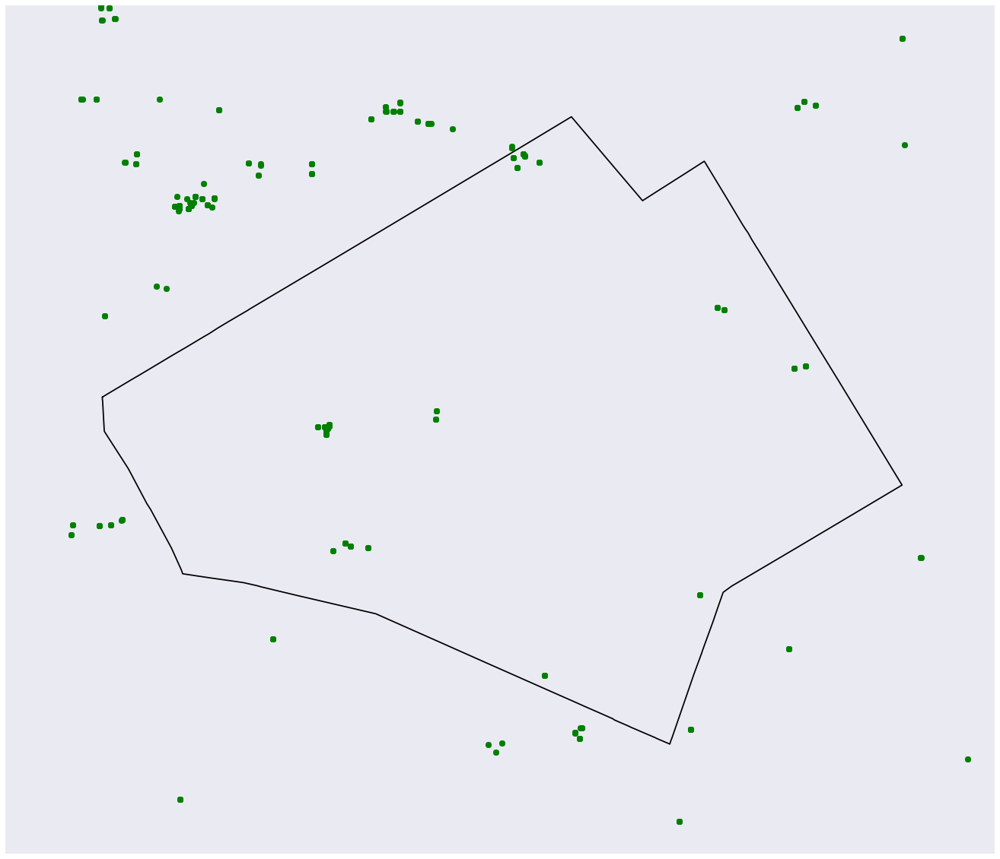

In [28]:
plot_counties_fires_boundaries(2013, 'Texas', 'tx', '48', 'Bell', markersize=8)

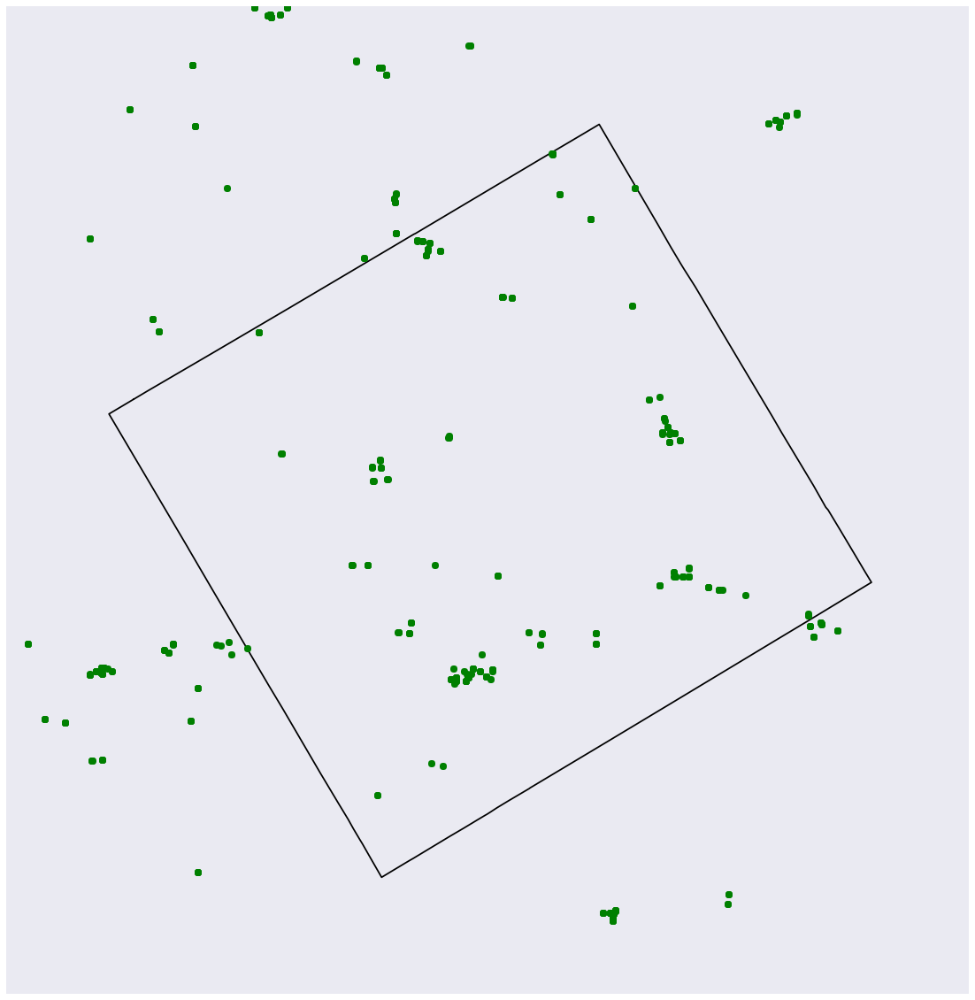

In [29]:
plot_counties_fires_boundaries(2013, 'Texas', 'tx', '48', 'Coryell', markersize=8)

After looking at individual counties in CO and TX, I think I have a good sense of what may be going on. Ultimately, I do not think that I am labeling fires/non-fires incorrectly through merging. But, I do think that some states are not submitting forest-fire perimeter boundaries as often or as acurrately as other states. 

In terms of labeling fires/non-fires correctly, it looks like I'm okay. In the above counties, I didn't see any cases where there were points within boundaries that were not labeled as forest-fires. Now, what's still odd is that there were no points that fell within some boundaries (regardless of how they were labeled). This is going to come down to the original data - it doesn't show any points within those boundaries. I'm going to guess this is either because the algorithms that analyzed the satellite imagery didn't pick up on fires there, or that the satellite imagery didn't pick up on those fires (either because of cloud color, having the lense pointed another direction, etc.). I still need to look at a broader sample of counties to try to confirm this, but that will come. 

In terms of states not submitting forest-fire perimeter boundaries, I think this is pretty clear when looking at the Texas counties. There are no forest-fire perimter boundaries in those counties in 2013, despite clear evidence that there were fires in those counties. 

Given, this, I see two possible ways to proceed with the analysis. The first is to perform supervised learning on all of the data, assuming that the number of forest-fire perimter boundaries that are missing (and thus the number of labeled non-fires that are forest-fires) is low. The second would be to perform semi-supervised learning, where we initially start off only working off of and building from the labeled forest-fires, since I can be confident that these are actual forest-fires. At this point in time, I think I'm going to proceed with both (after all, it's just throwing the same data into different models). Follow up/further analysis after using both of these techniques will be to identify states that are most accurately submitting fire-perimeter boundaries, and perform the same analyses using only these states. That'll come later. 

Finally, I haven't quite clarified/discussed the results of what I set out to look for. That is: 

1. Fires clump together, as we might expect.
2. Fires are not present in the same locations from year to year.

I discussed (1) above, and this seems pretty clear when we look at the plots of fires/non-fires. The presence of (2) is much less clear, and not obvious from all of the above plots. It seems like it could be true, and that the plots just don't get into a fine enough level of detail. However, I think it requires looking at individual counties in states across years to get a better sense of. Since I need to do this anyway to help confirm that my merging is not occuring incorrectly, I'm going to now do that for counties in states that I know have a lot of fires. I'll do this across all four years of the data, and for a number of different state/county combos. across my data set. 

Year: 2012
--------------------------------------------------


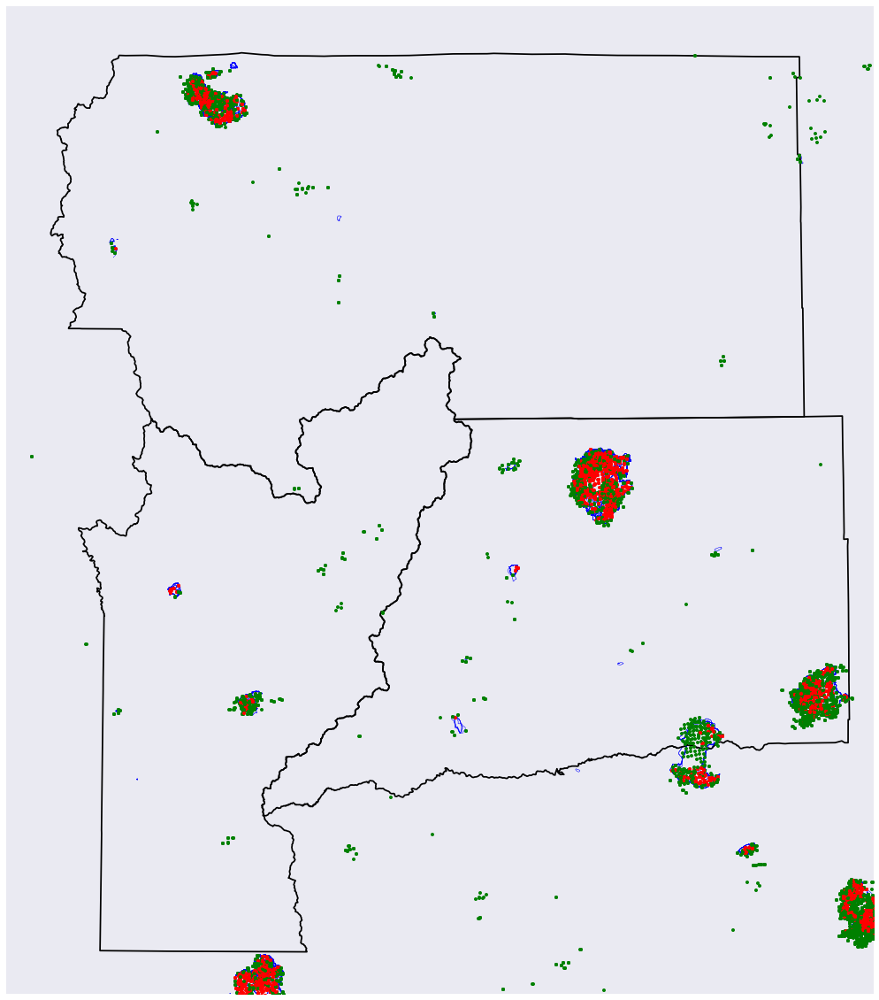

Year: 2013
--------------------------------------------------


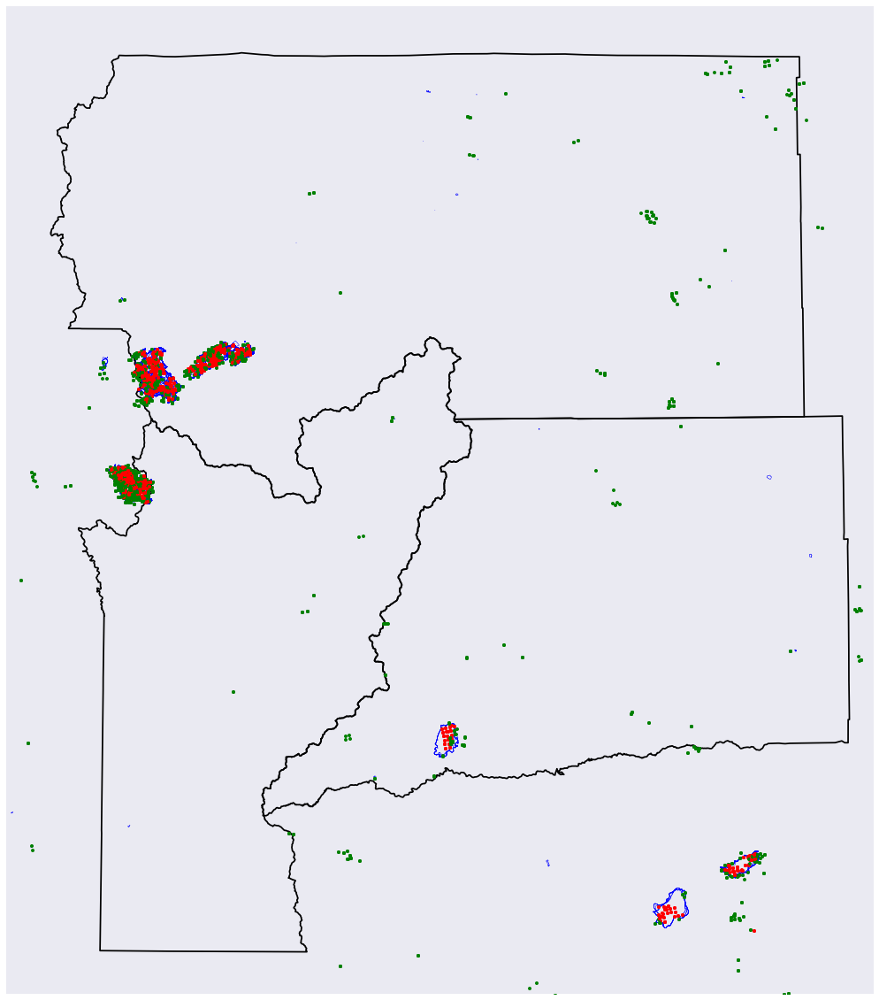

Year: 2014
--------------------------------------------------


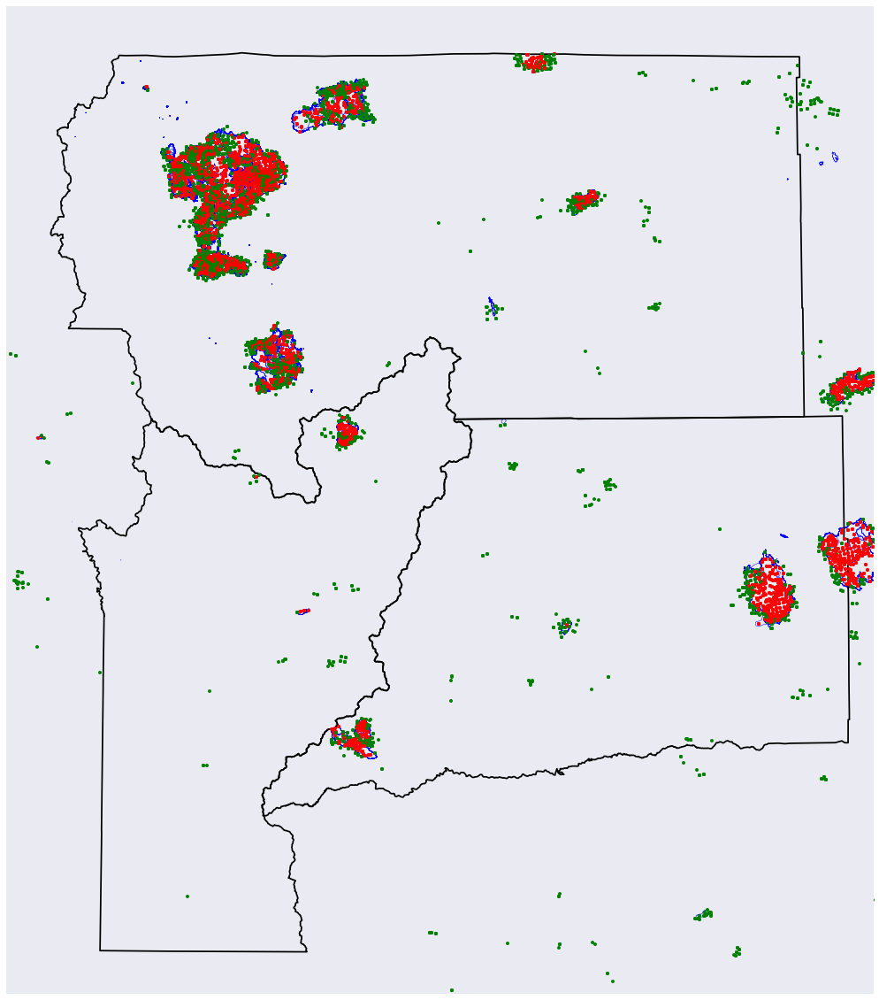

Year: 2015
--------------------------------------------------


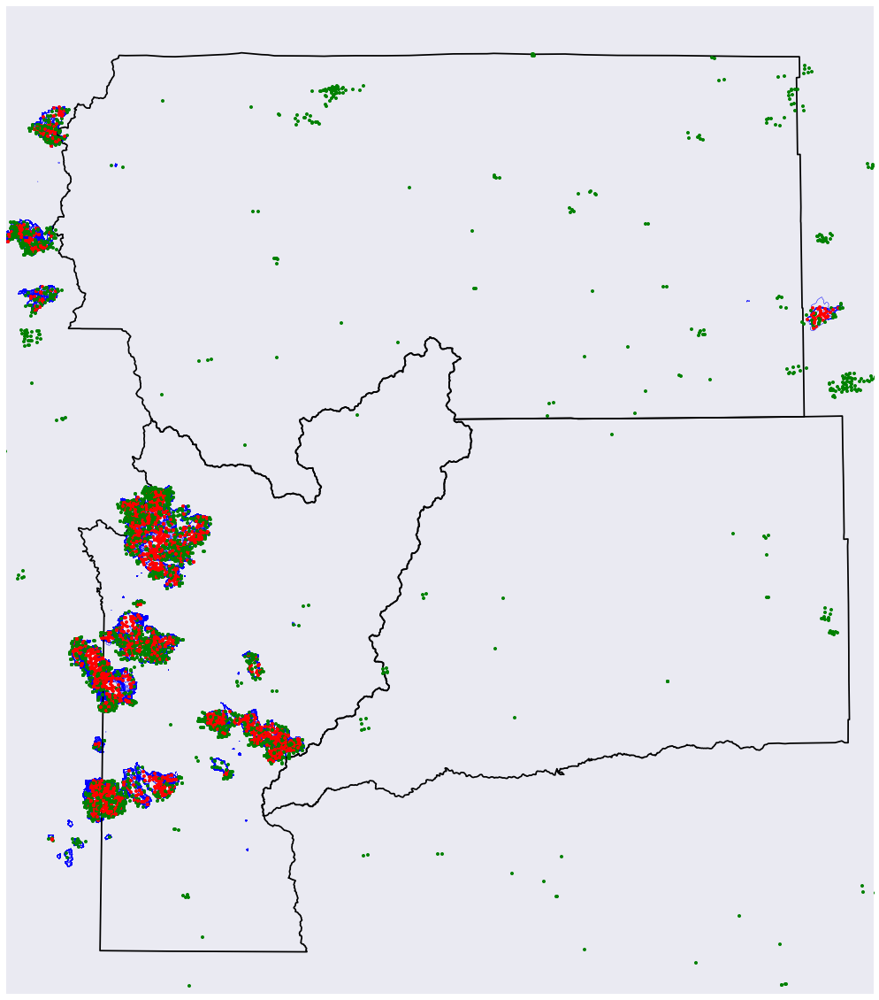

In [30]:
# Let's start off with some of the northern counties in CA that exhibited heavy numbers 
# of fires. 
for year in years: 
    print 'Year: {}'.format(year)
    print '-' * 50
    plot_counties_fires_boundaries(year, 'California', 'ca', '06', ['Siskiyou', 'Trinity', 'Shasta'])

Year: 2012
--------------------------------------------------


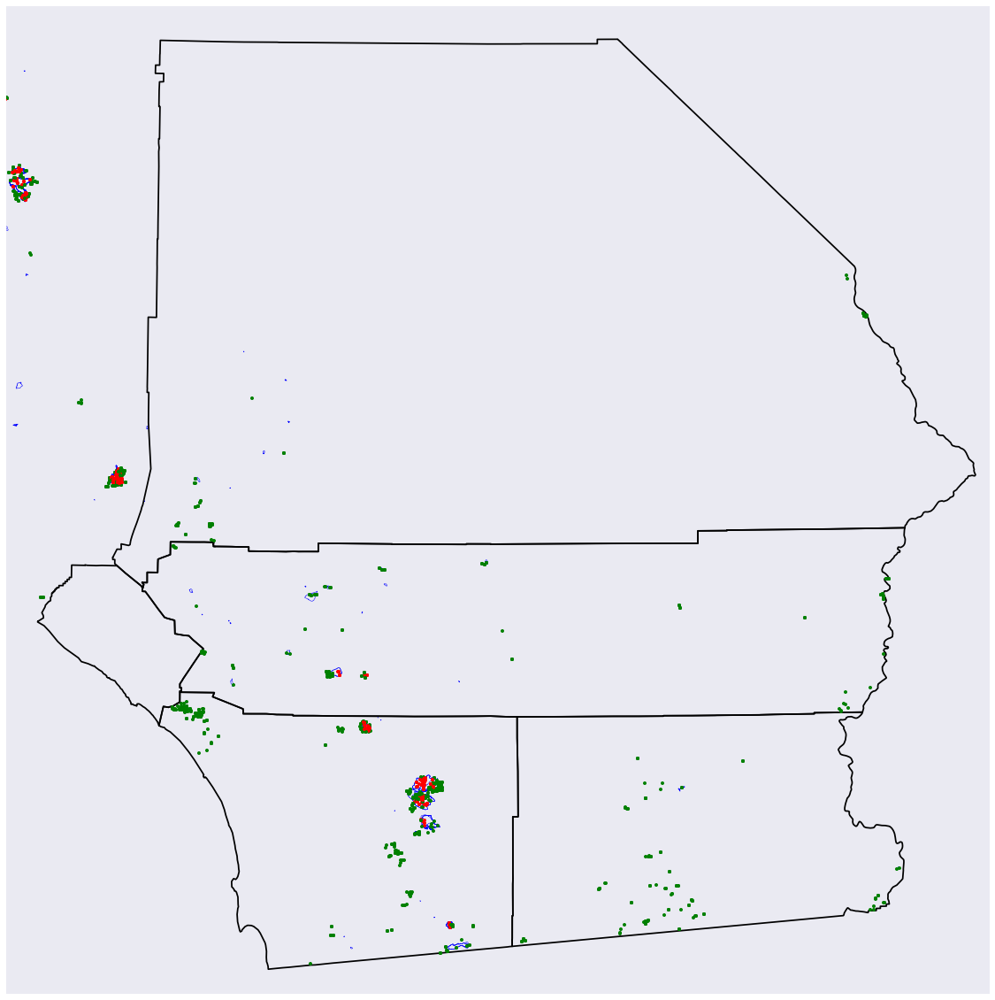

Year: 2013
--------------------------------------------------


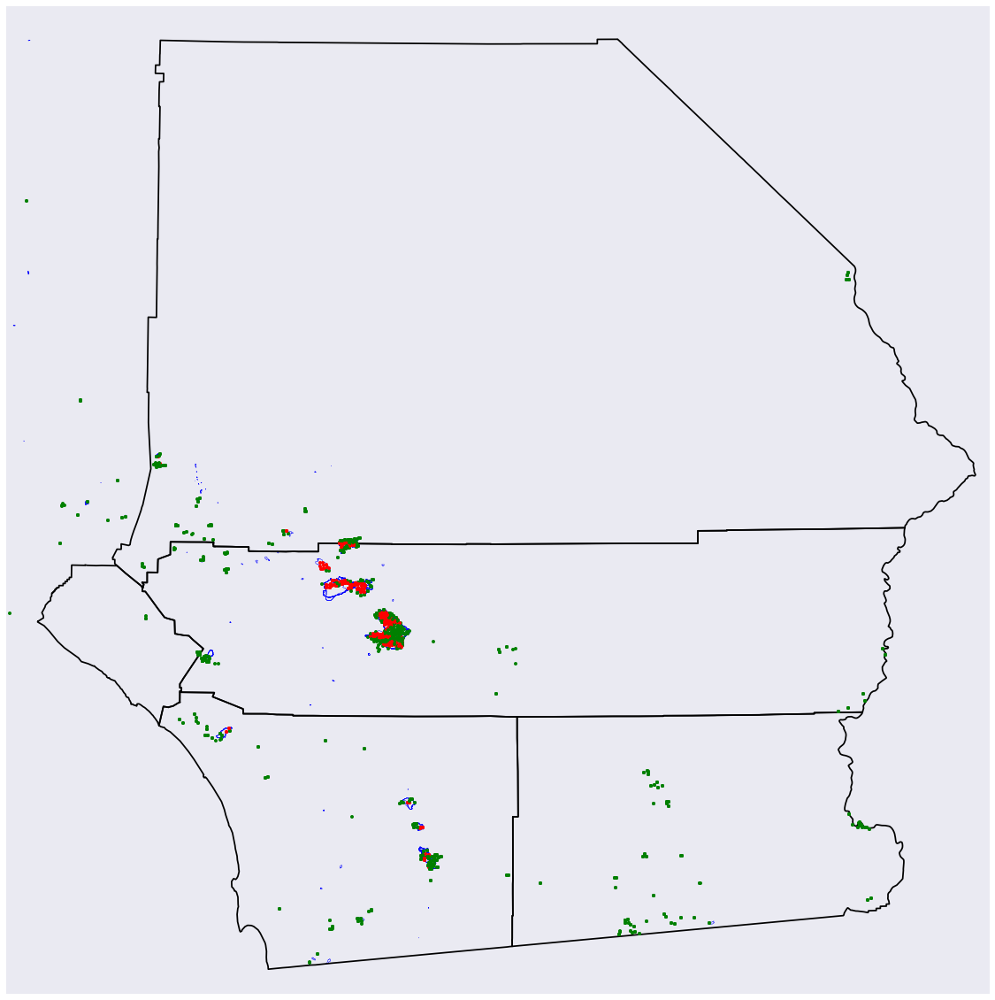

Year: 2014
--------------------------------------------------


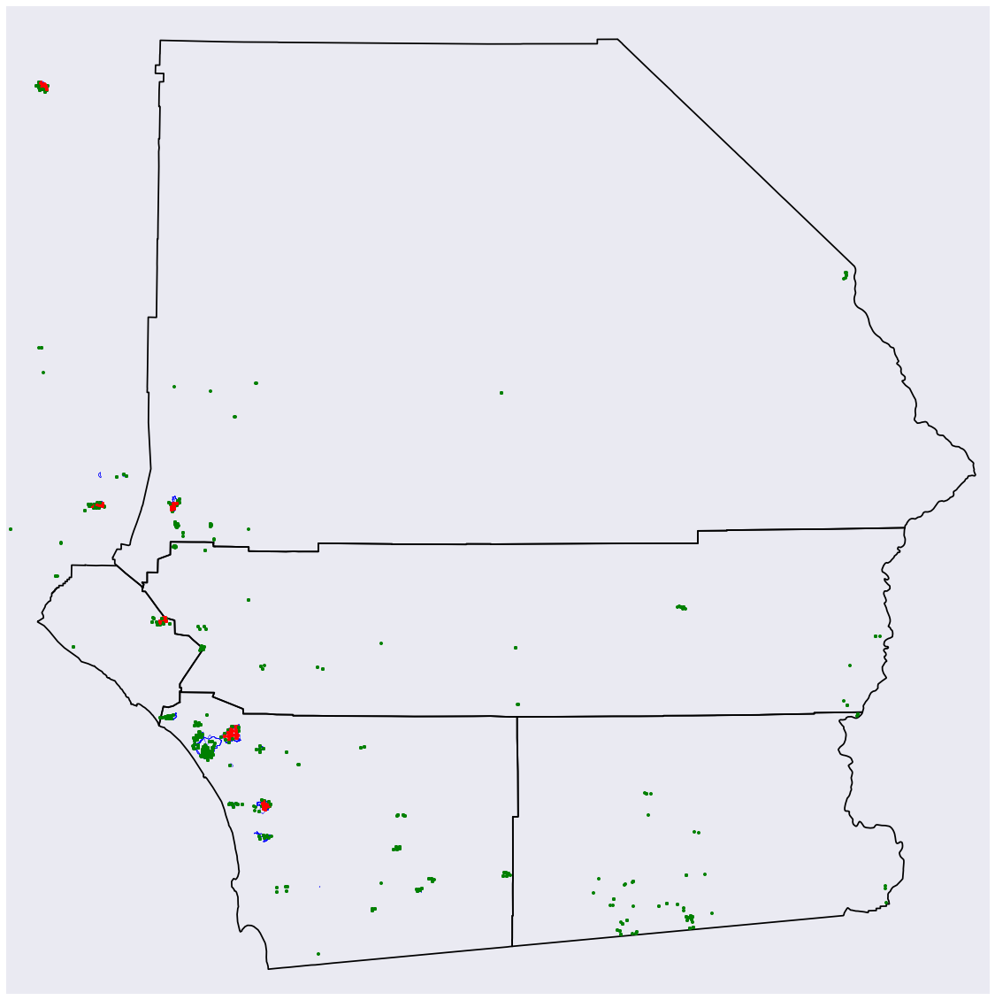

Year: 2015
--------------------------------------------------


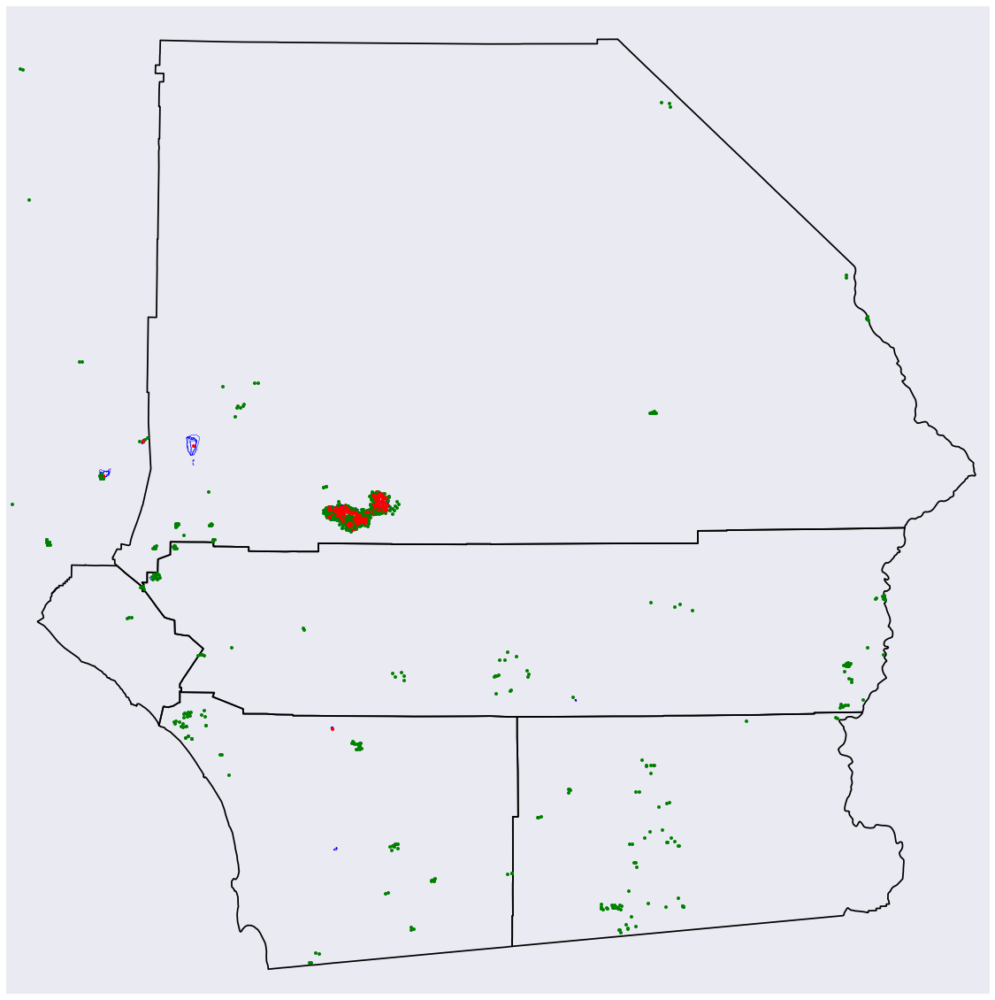

In [31]:
# Let's start off with some of the northern counties in CA that exhibited heavy numbers 
# of fires. 
for year in years: 
    print 'Year: {}'.format(year)
    print '-' * 50
    plot_counties_fires_boundaries(year, 'California', 'ca', '06', ['San Bernardino', 'Orange', 'Riverside', 'San Diego', 'Imperial'])

Year: 2012
--------------------------------------------------


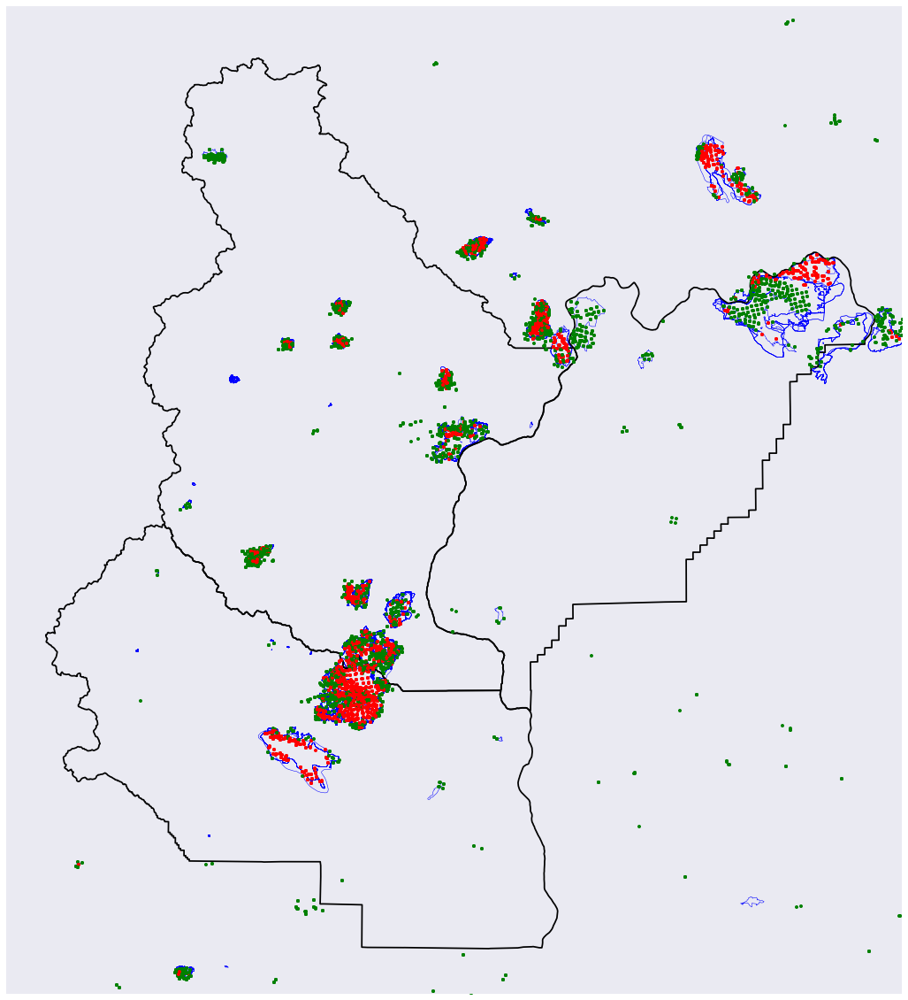

Year: 2013
--------------------------------------------------


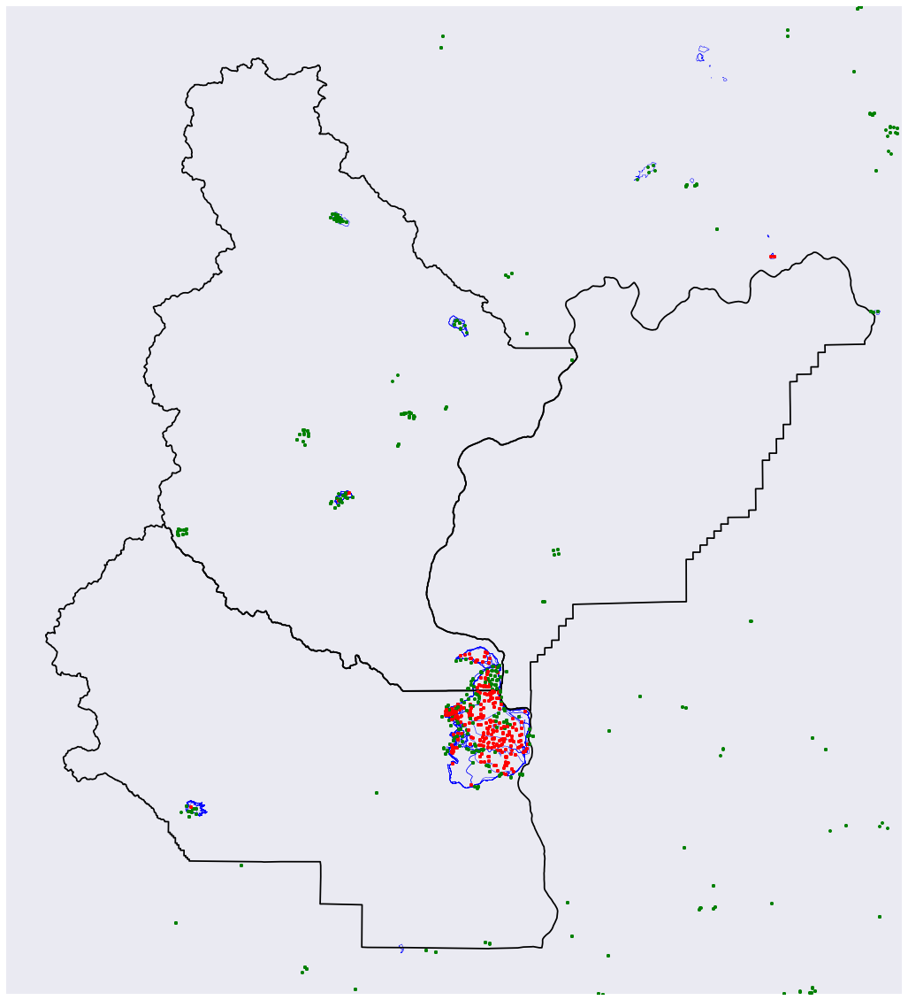

Year: 2014
--------------------------------------------------


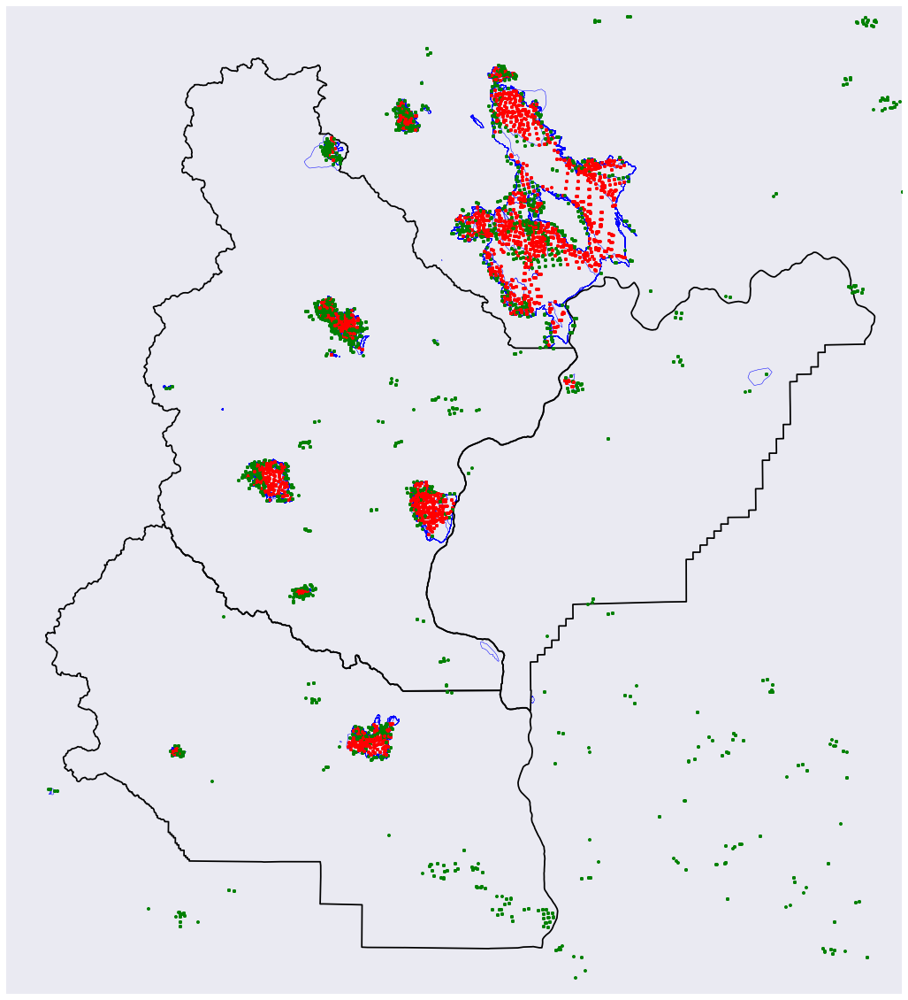

Year: 2015
--------------------------------------------------


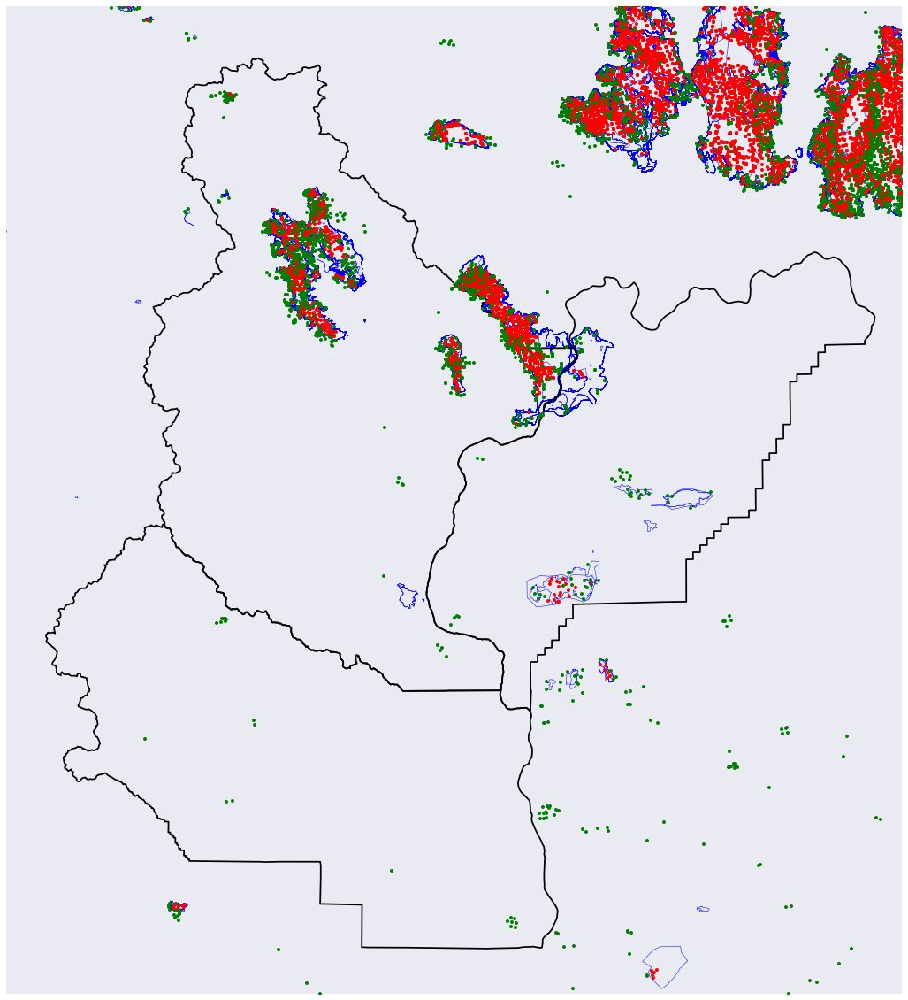

In [32]:
# Now we'll do the same for WA. 
for year in years: 
    print 'Year: {}'.format(year)
    print '-' * 50
    plot_counties_fires_boundaries(year, 'Washington', 'wa', '53', ['Chelan', 'Douglas', 'Kittitas'])

Year: 2012
--------------------------------------------------


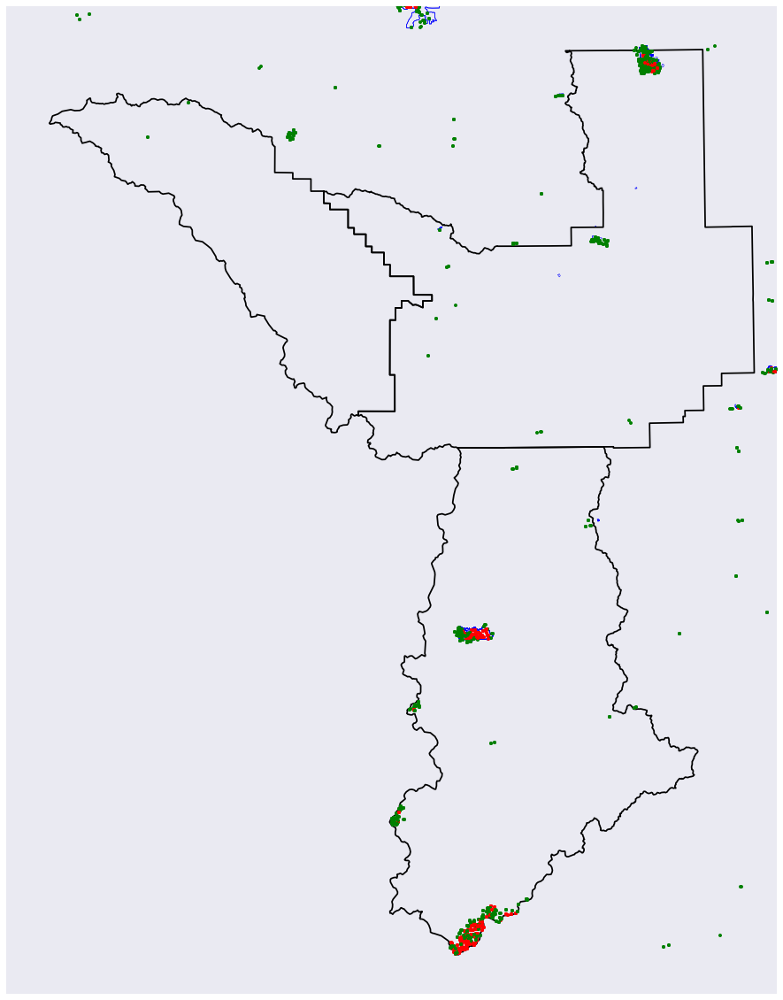

Year: 2013
--------------------------------------------------


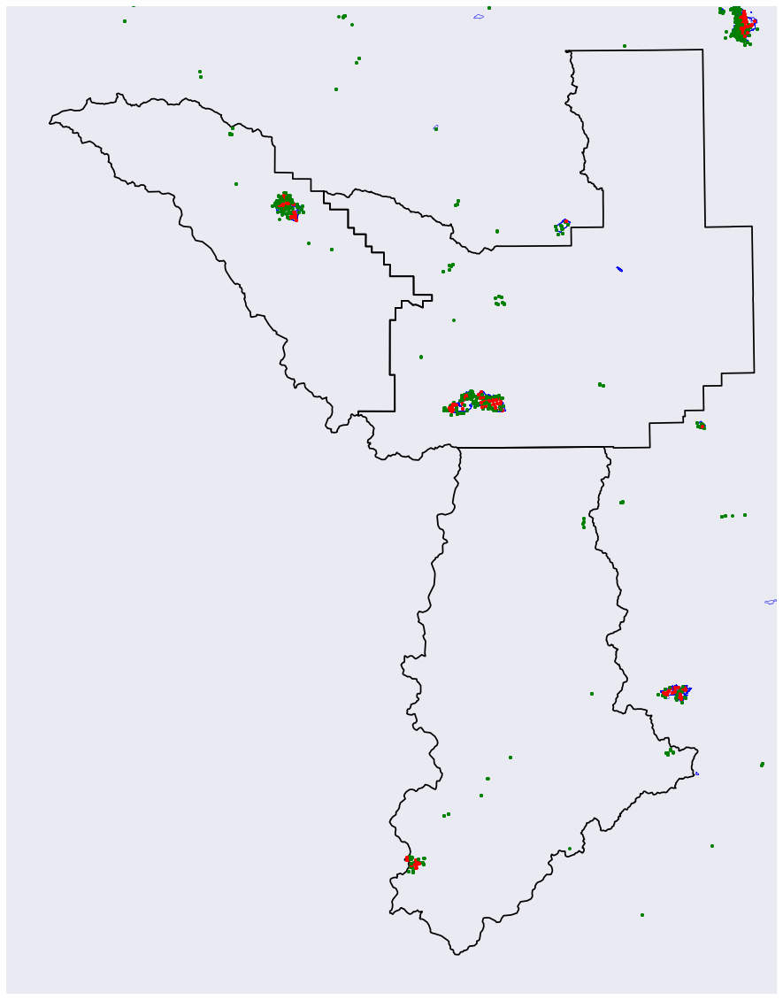

Year: 2014
--------------------------------------------------


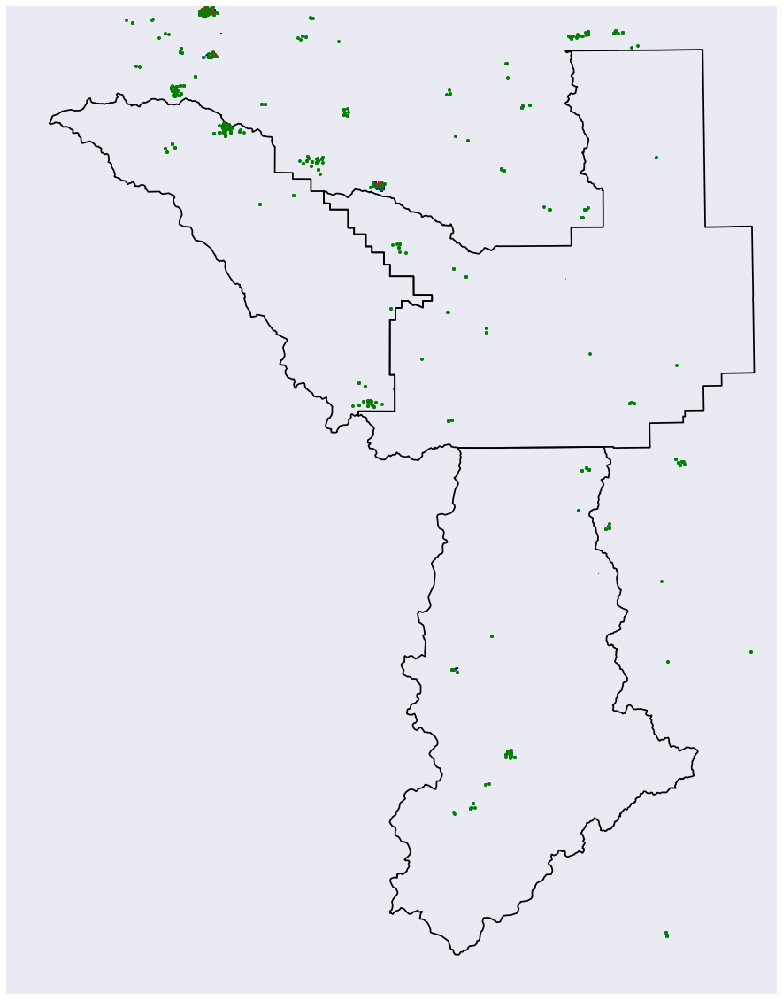

Year: 2015
--------------------------------------------------


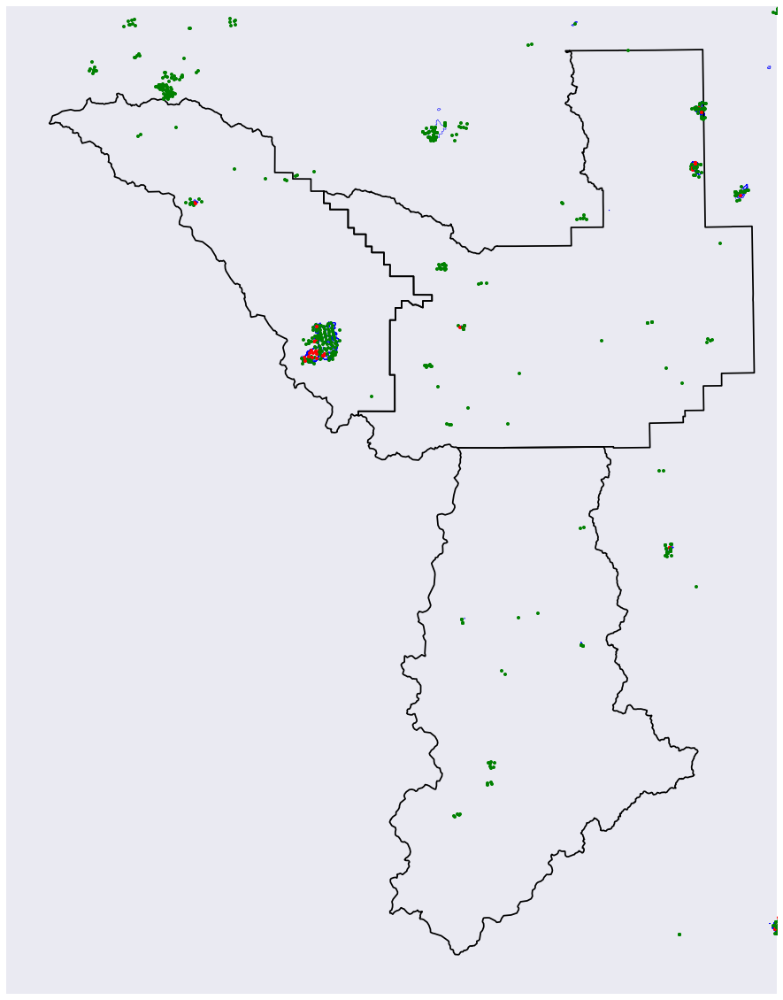

In [33]:
# Let's do the same for MT. 
for year in years: 
    print 'Year: {}'.format(year)
    print '-' * 50
    plot_counties_fires_boundaries(year, 'Montana', 'mt', '30', ['Mineral', 'Missoula', 'Ravalli'])

If we look at the plots above, we actually do see that fires don't appear in the same locations from year to year. While in the statewide maps that didn't appear to be the case, when we break it down and look at it from the county level, we see that it largely appears to be true. I think it's important to note, though, that the non-fires in these years/counties are clustering around where the fires are. It seems pretty unlikely that this would occur by chance; it seems more likely that either the fire-perimeter boundaries aren't submitted for some days (as we're already seeing in other states), or that the algorithm generating detected fires is not picking up on some fires (which could be possible). This might be fleshed out a little bit as we plot fire perimeter boundaries for these counties on certain days (note that this above we didn't do this (we plotted all fires in a given year), which is why we do see non-fires fall right in the middle of perimeter boundaries (e.g. we need to take the date into account as well)). These findings might be even more suggestive of missing information, pointing towards a semi-supervised approach. 

In [34]:
def plot_county_dt(st_name, st_abbrev, st_fips, county_name, fires_dt=None, perims_dt=None): 
    """Plot all obs., along with the fire-perimeter boundaries, for a given county and date. 
    
    Read in the data for the inputted year and parse it to the given state/county and date. 
    Read in the fire perimeter boundaries for the given state/county and date, and parse 
    those. Plot it all. 
    
    Args: 
        st_name: str
            State name to grab for plotting. 
        st_abbrev: str
            State abbrevation used for the bash script. 
        st_fips: str
            State fips used for the base script. 
        county_name: str
            County name to grab for plotting. 
        dt: str
            Date to grab for plotting. 
    """
    
    year = fires_dt.split('-')[0]
    perims_dt = fires_dt if not perims_dt else perims_dt
    county_names = [county_name] if not isinstance(county_name, list) else county_name
    fires_data = read_n_parse(year, state_names=st_name, county_names=county_name, dt=fires_dt, plotting=True)
    county_map = USMapBuilder('data/county_shapefiles_2014/cb_2014.shp', geo_level='County', 
                state_names=[st_name], county_names=county_names, figsize=(40, 20), border_padding=0.1)
    fire_boundaries = grab_fire_perimeters(perims_dt, st_name, st_abbrev, st_fips)
    try: 
        county_map.plot_boundary(fire_boundaries)
    except Exception as e:
        print e
    county_map.plot_points(fires_data, 4)
    plt.show()

If we look back at our state maps that are plotted by month, we can see that in August of 2015, the northwest counties of California had a pretty large number of fires. I'm going to focus on Trinity county, as it looks like that is where a number of the fires our. We'll start off looking at this county over a couple of days, and then move on to looking in some other state. I'll start off plotting the entire month of August. 

Date: 2015-08-01
--------------------------------------------------


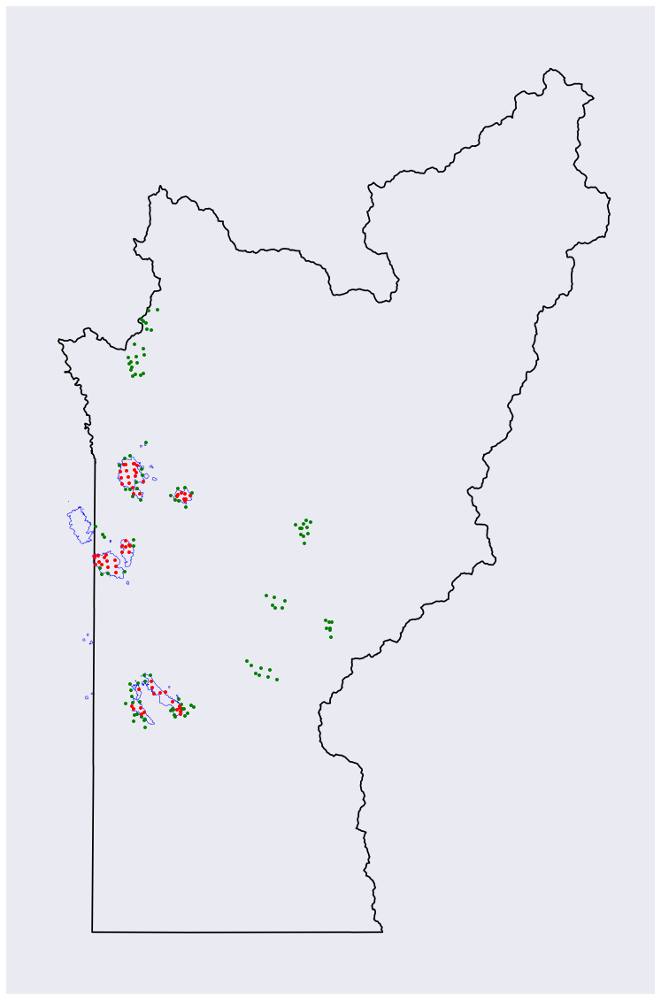

Date: 2015-08-02
--------------------------------------------------


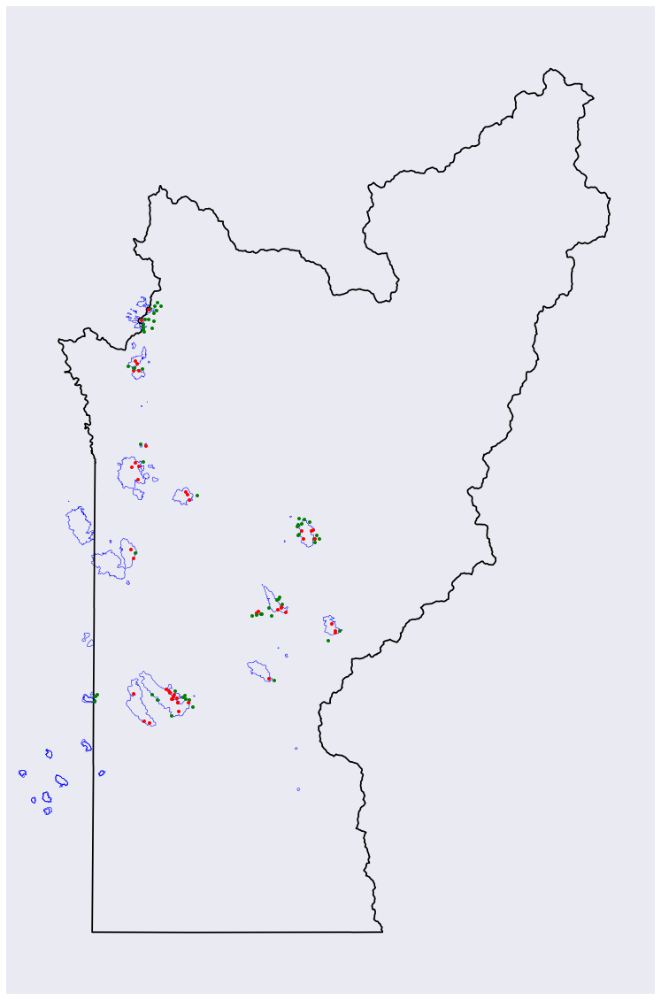

Date: 2015-08-03
--------------------------------------------------


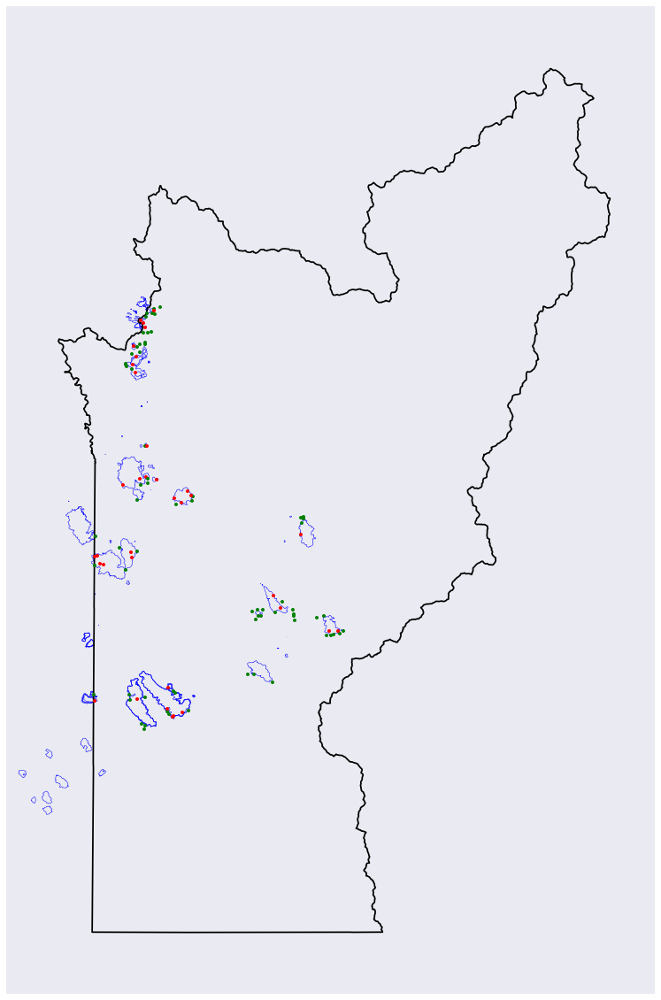

Date: 2015-08-04
--------------------------------------------------


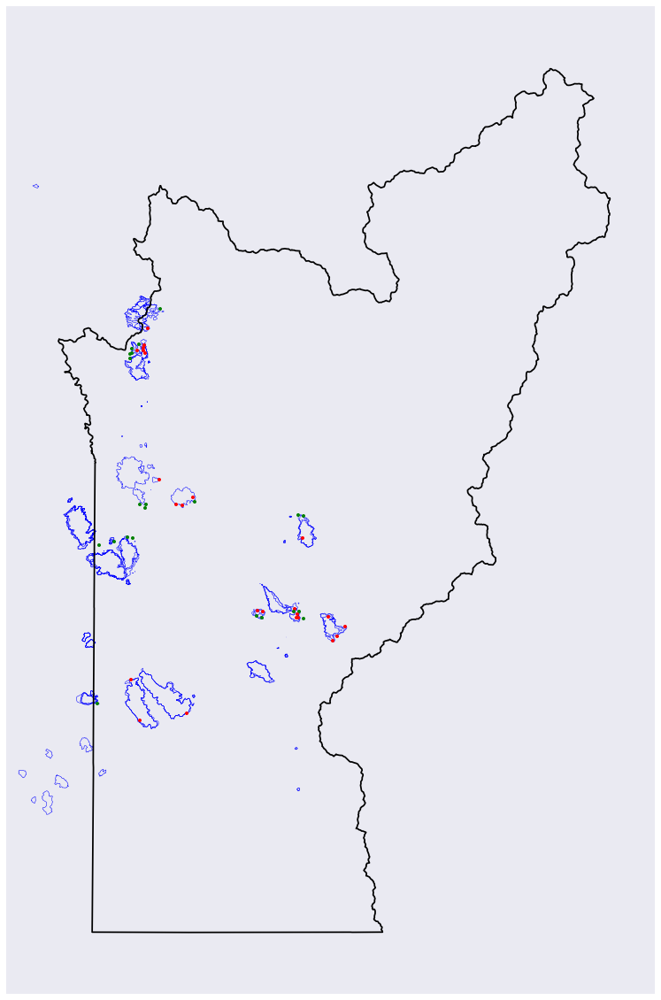

Date: 2015-08-05
--------------------------------------------------


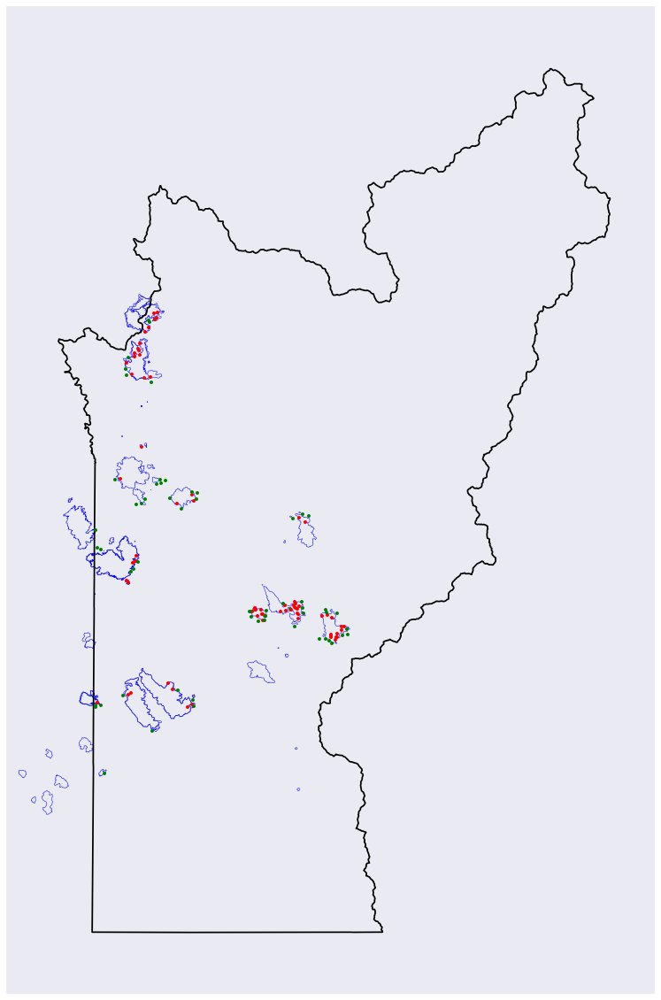

Date: 2015-08-06
--------------------------------------------------


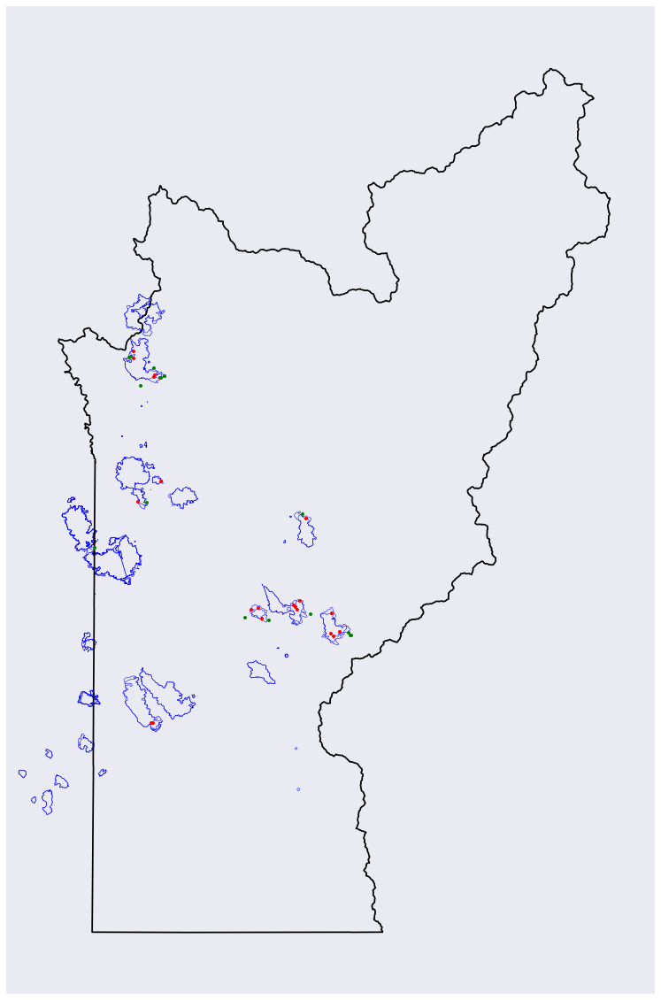

Date: 2015-08-07
--------------------------------------------------


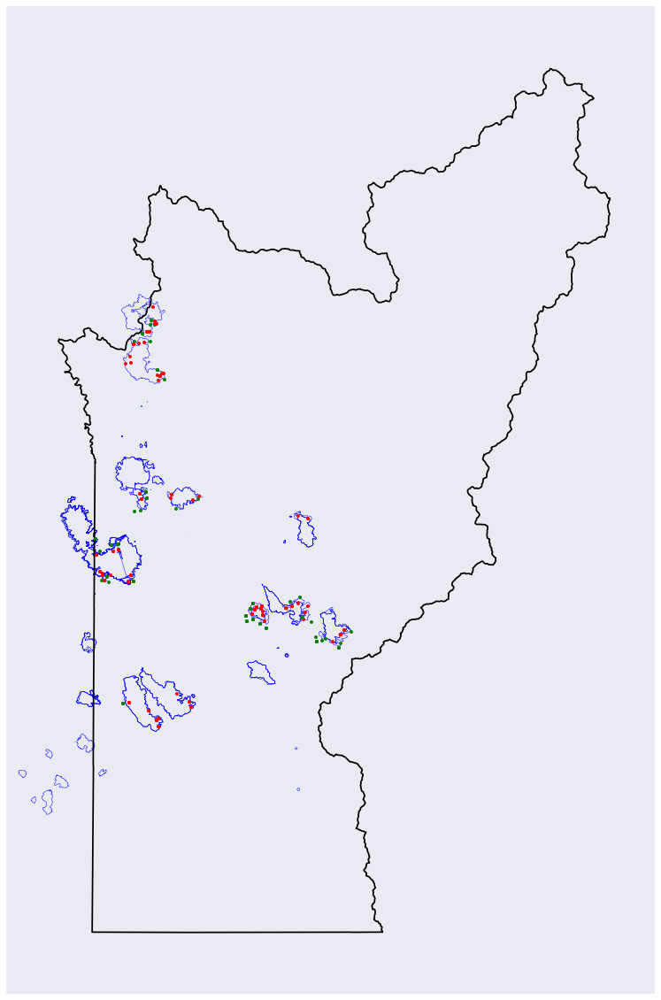

Date: 2015-08-08
--------------------------------------------------


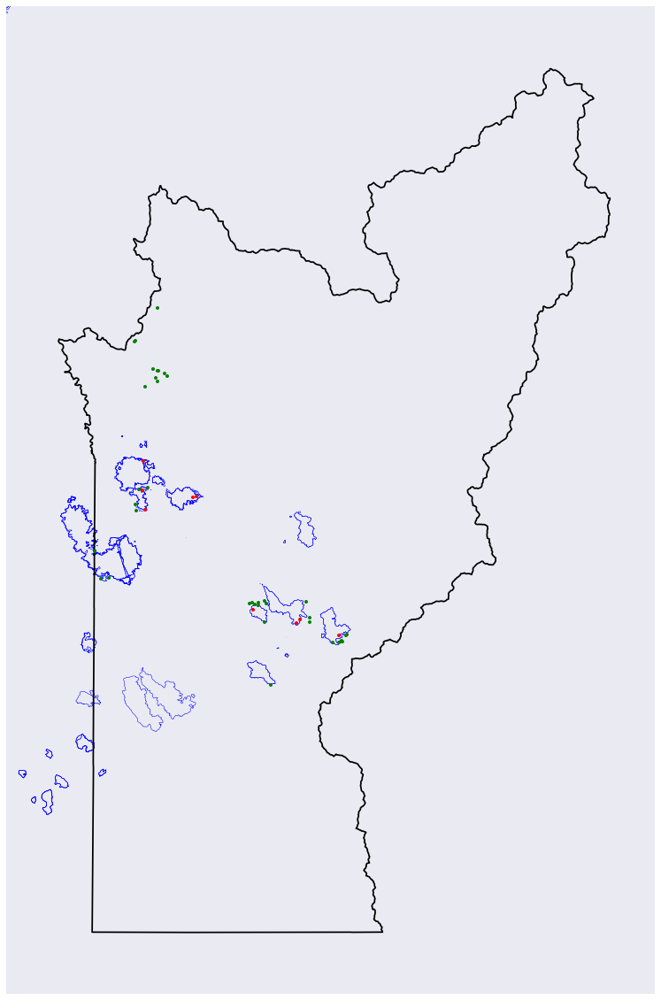

Date: 2015-08-09
--------------------------------------------------


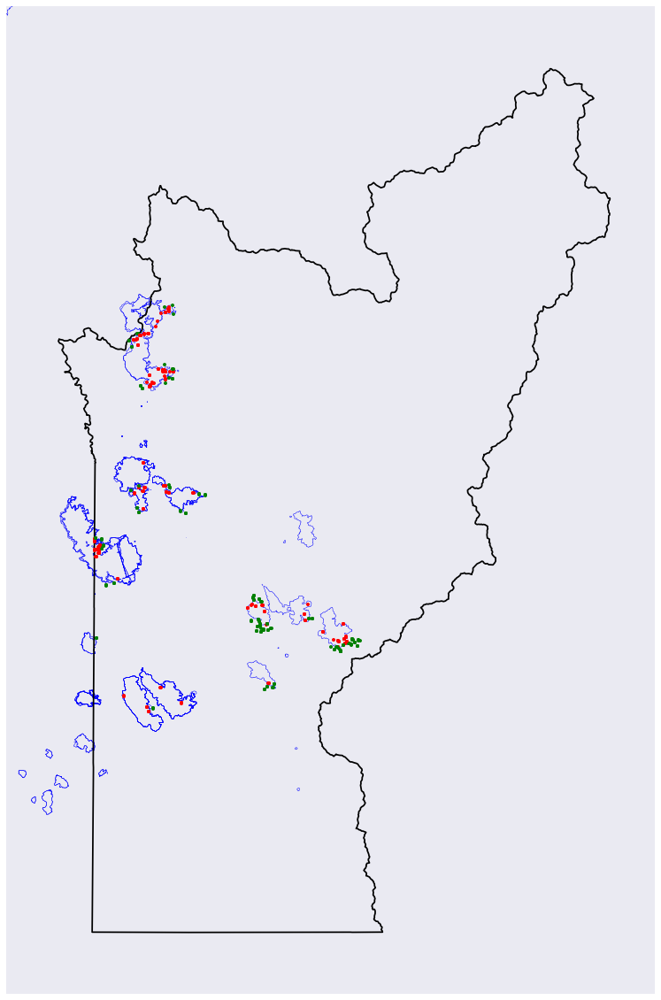

Date: 2015-08-10
--------------------------------------------------


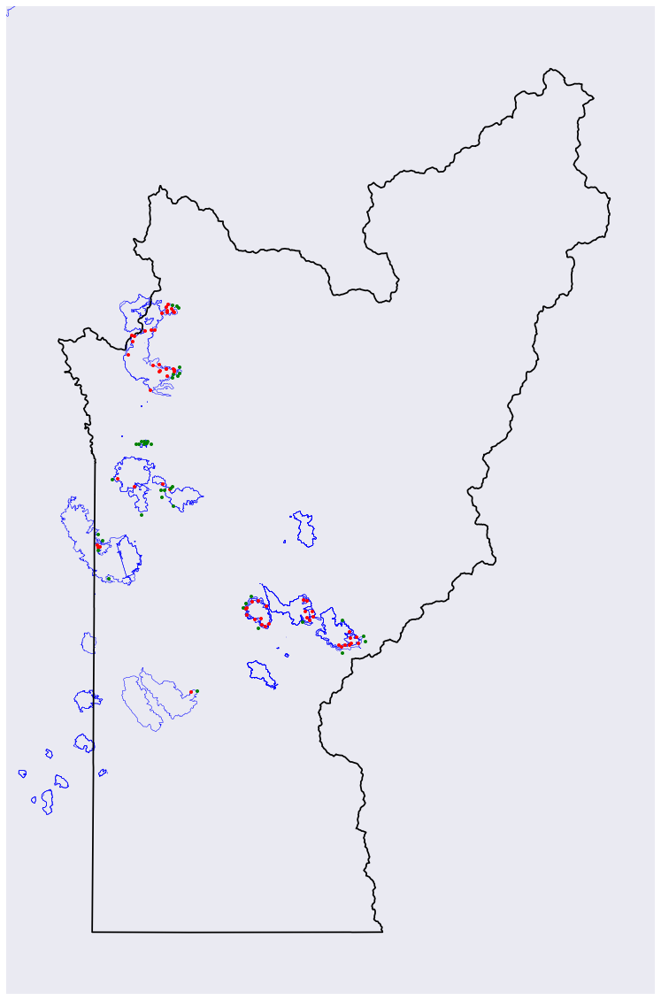

Date: 2015-08-11
--------------------------------------------------


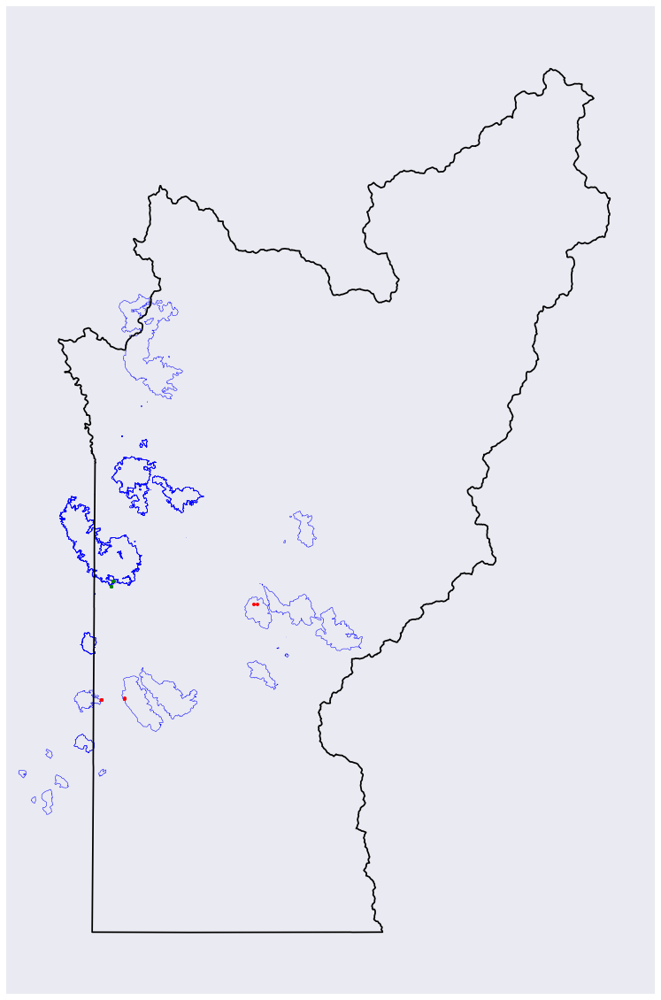

Date: 2015-08-12
--------------------------------------------------


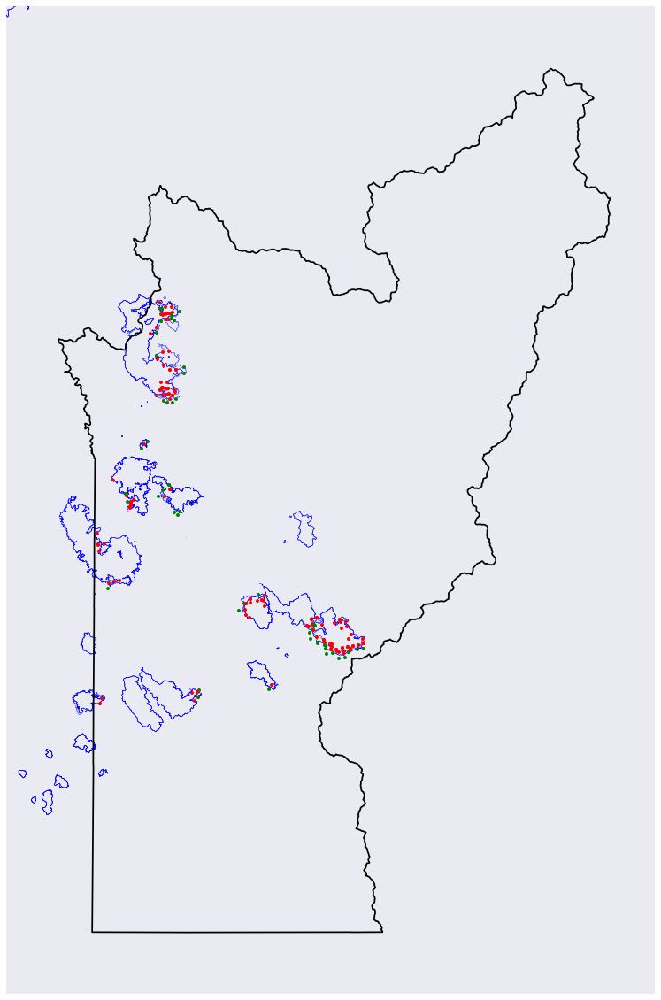

Date: 2015-08-13
--------------------------------------------------


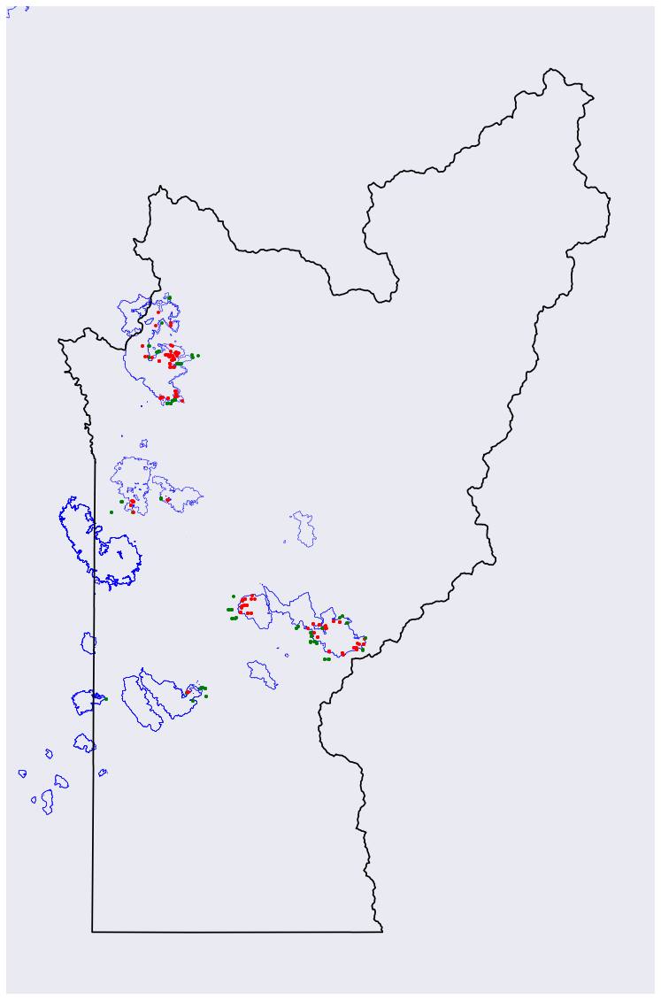

Date: 2015-08-14
--------------------------------------------------


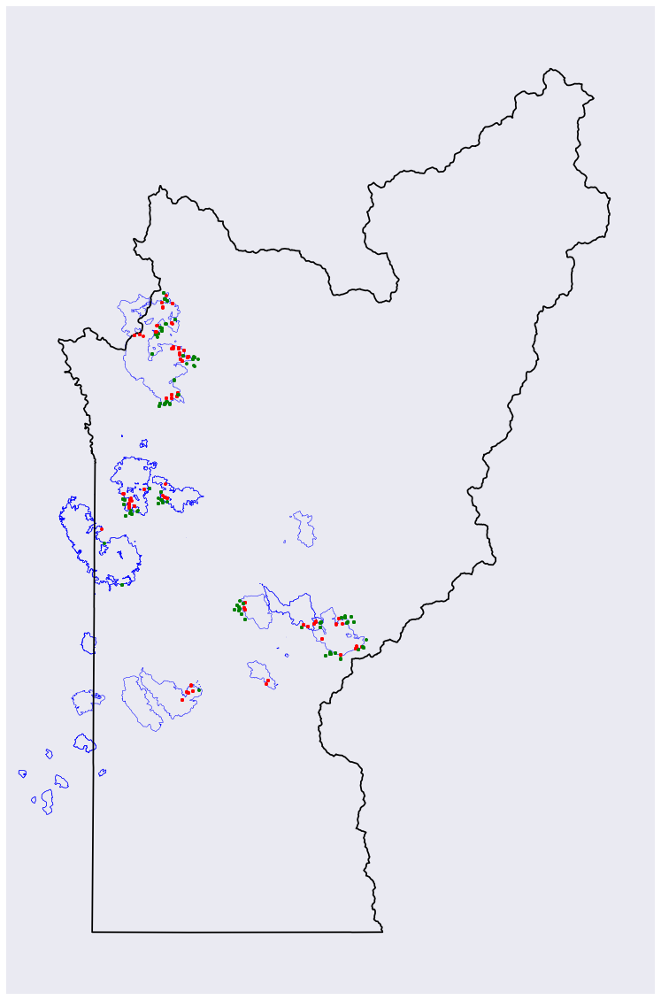

Date: 2015-08-15
--------------------------------------------------


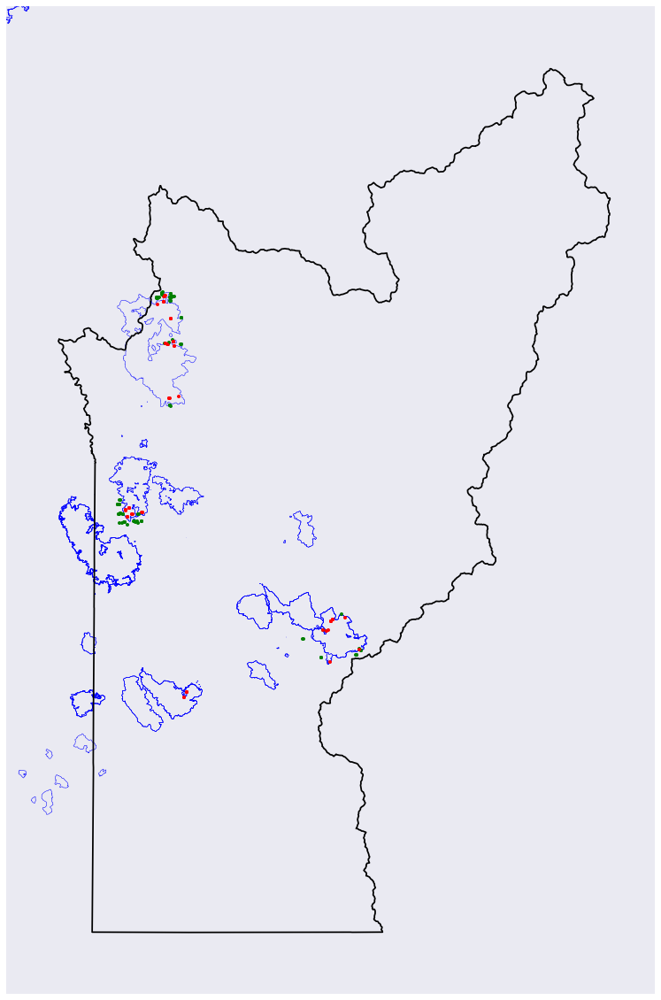

Date: 2015-08-16
--------------------------------------------------


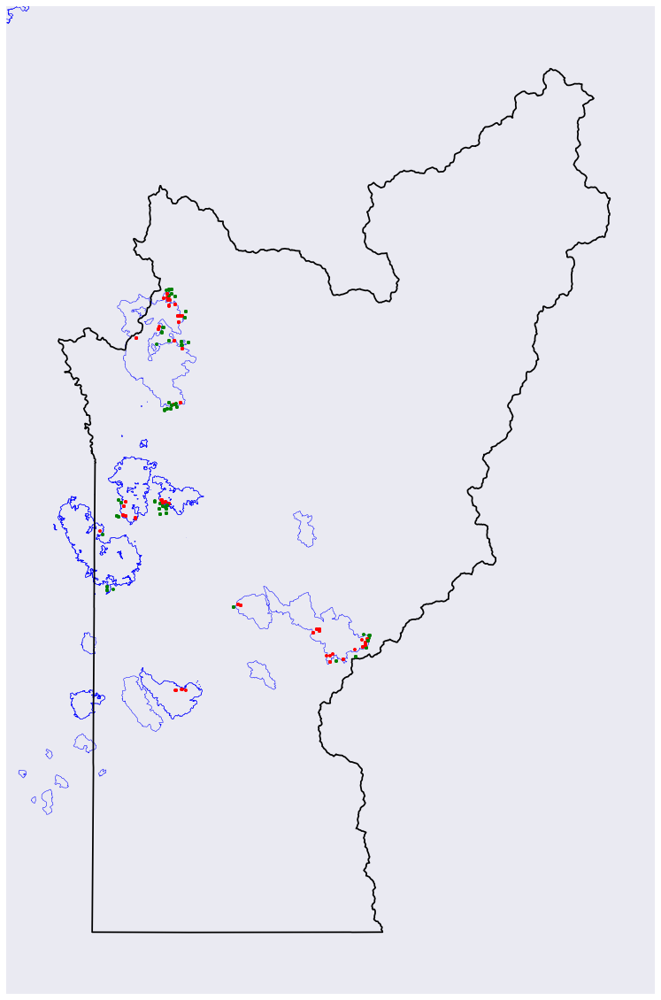

Date: 2015-08-17
--------------------------------------------------


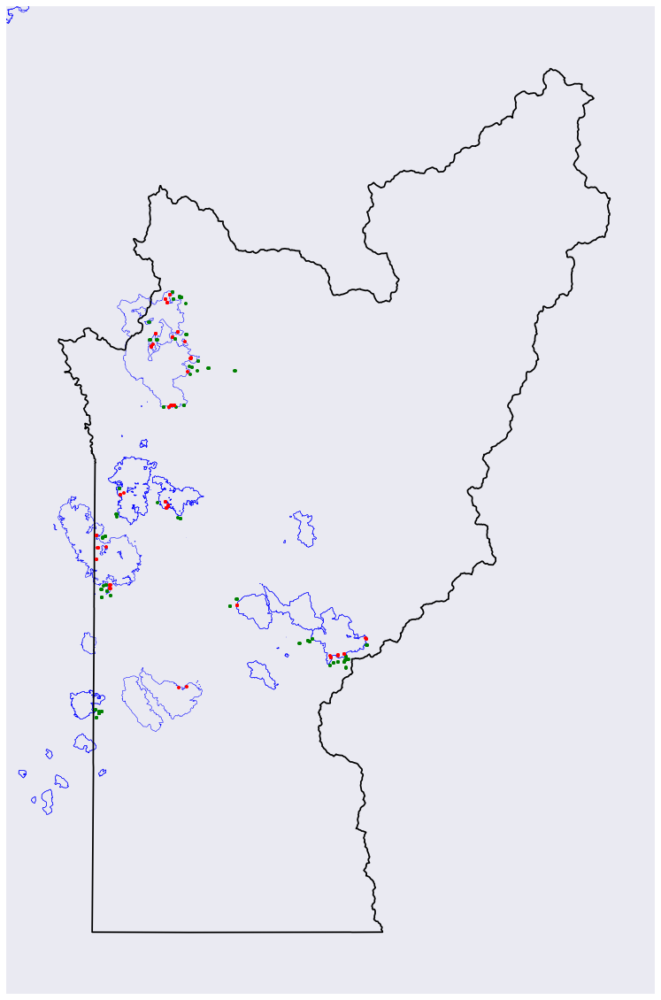

Date: 2015-08-18
--------------------------------------------------


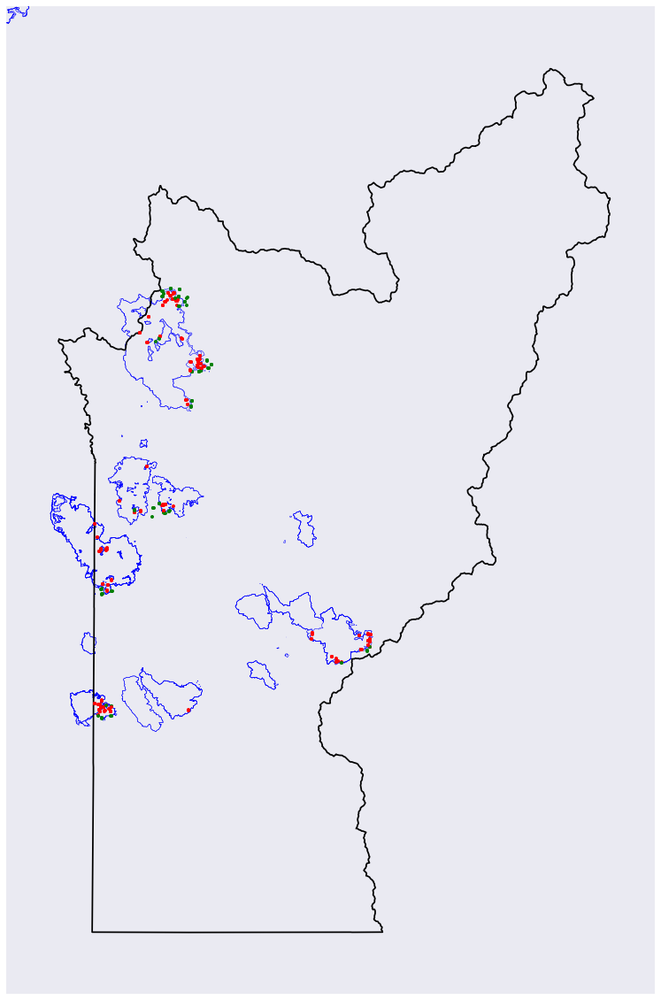

Date: 2015-08-19
--------------------------------------------------


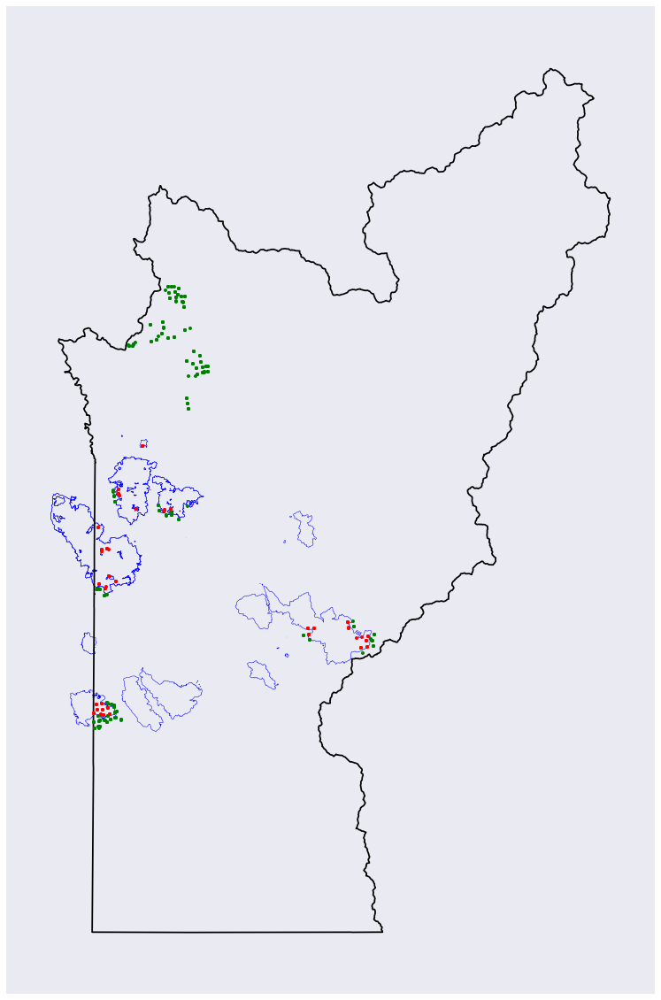

Date: 2015-08-20
--------------------------------------------------


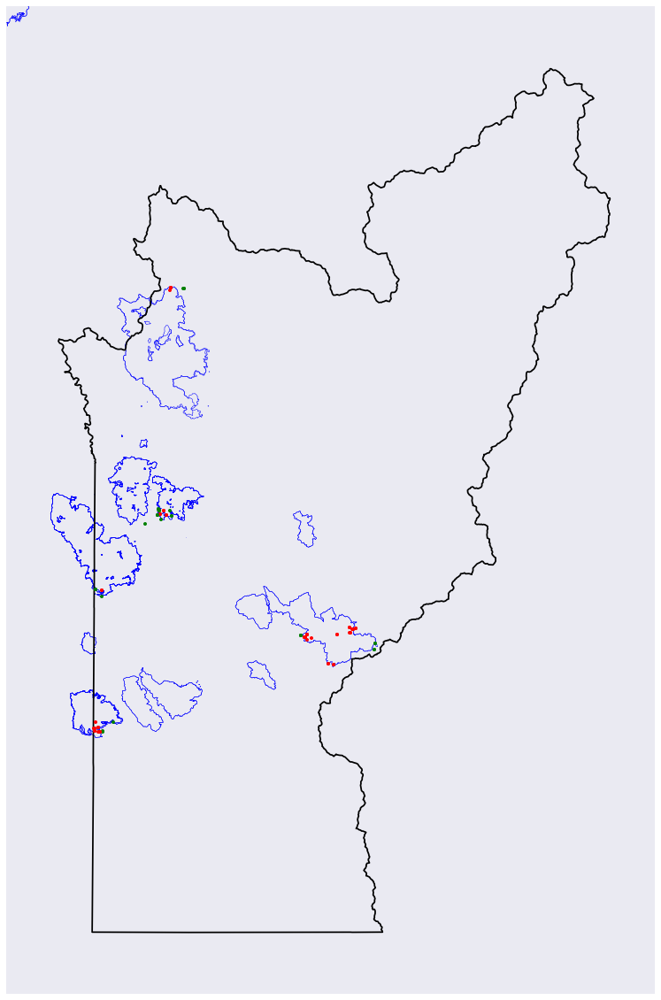

Date: 2015-08-21
--------------------------------------------------


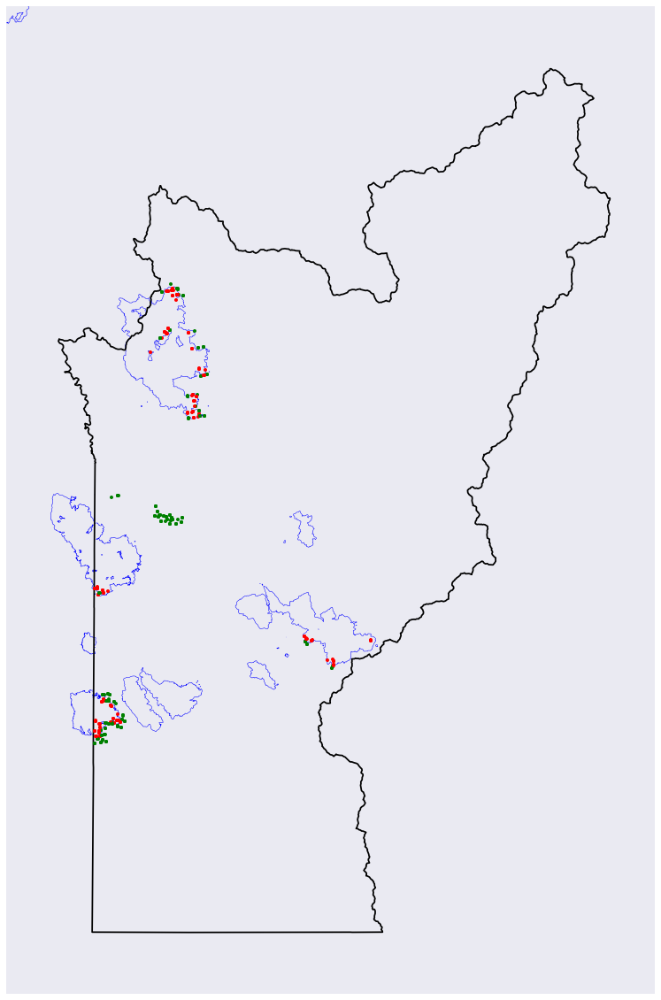

Date: 2015-08-22
--------------------------------------------------


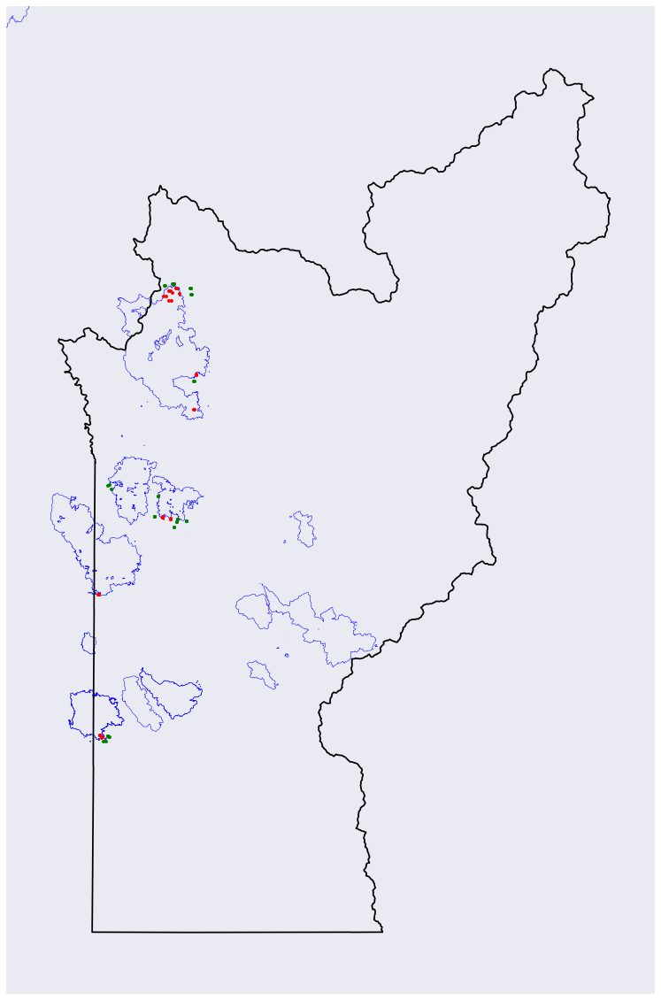

Date: 2015-08-23
--------------------------------------------------


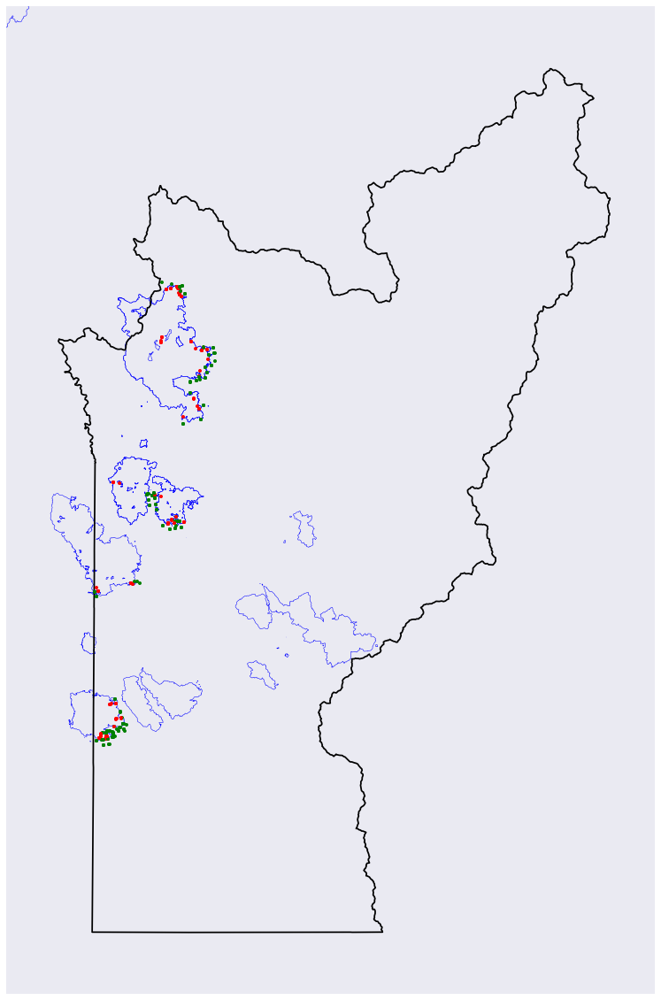

Date: 2015-08-24
--------------------------------------------------


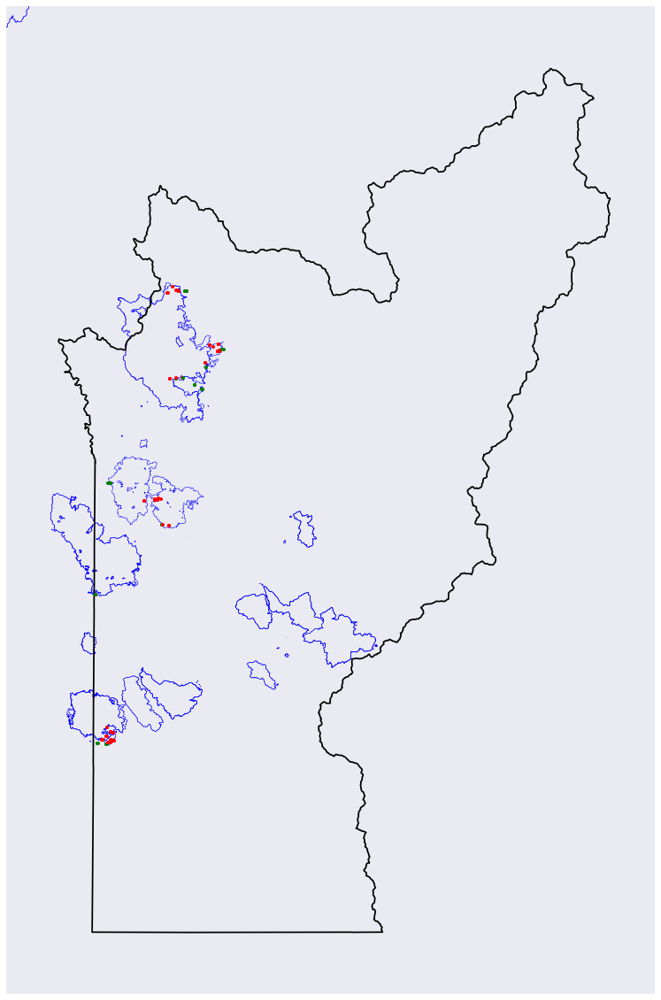

Date: 2015-08-25
--------------------------------------------------


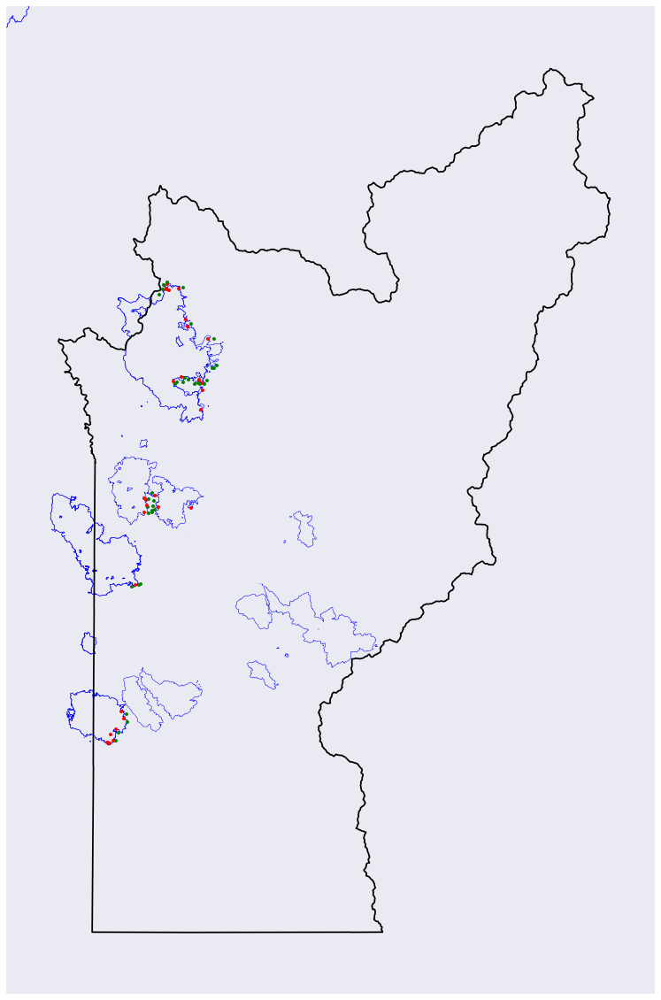

Date: 2015-08-26
--------------------------------------------------


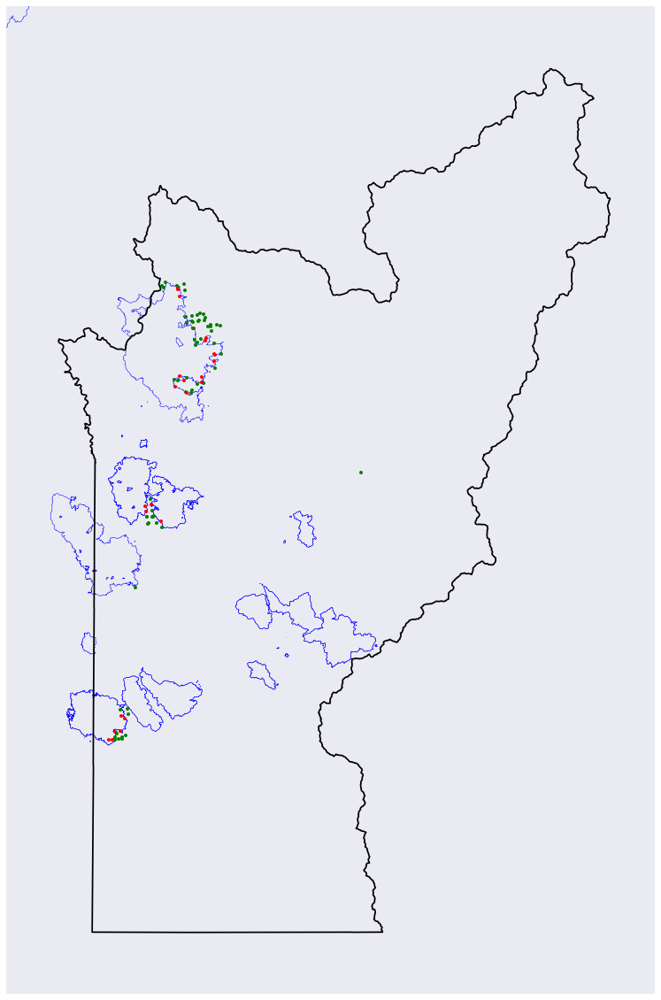

Date: 2015-08-27
--------------------------------------------------


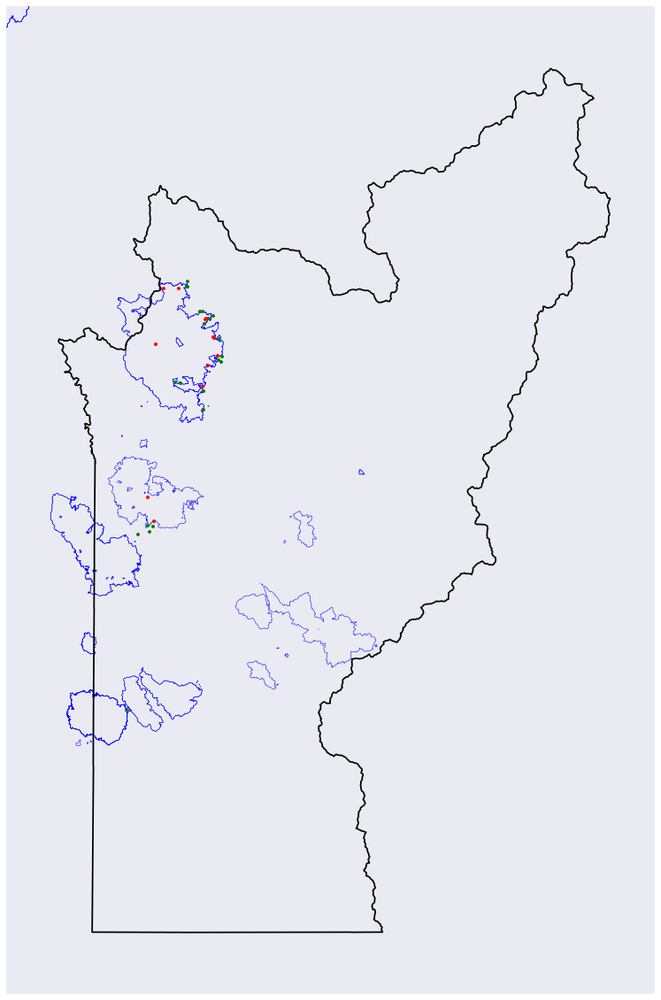

Date: 2015-08-28
--------------------------------------------------


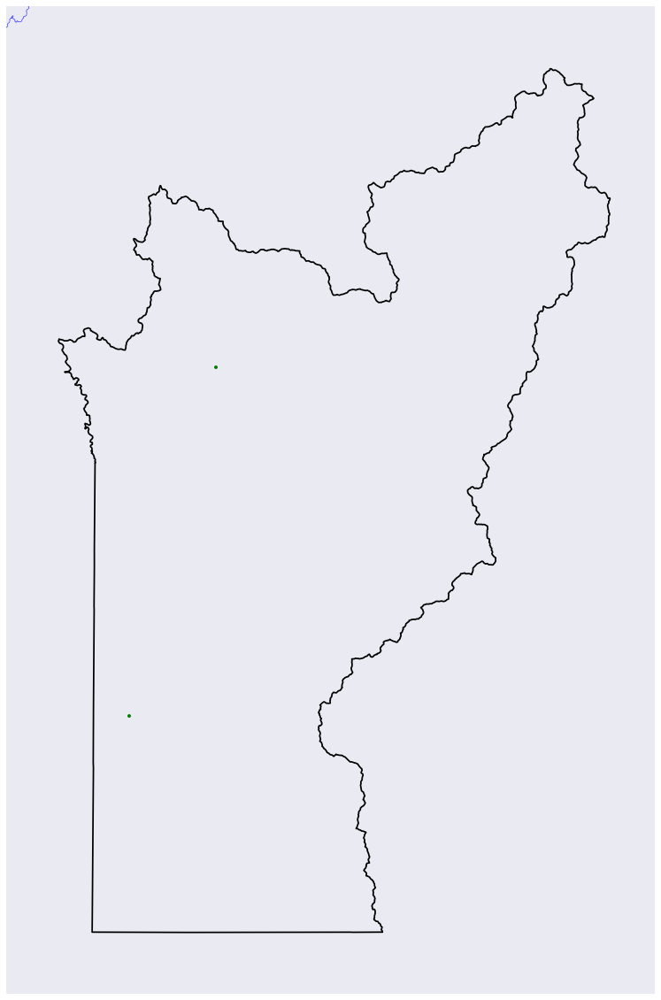

Date: 2015-08-29
--------------------------------------------------


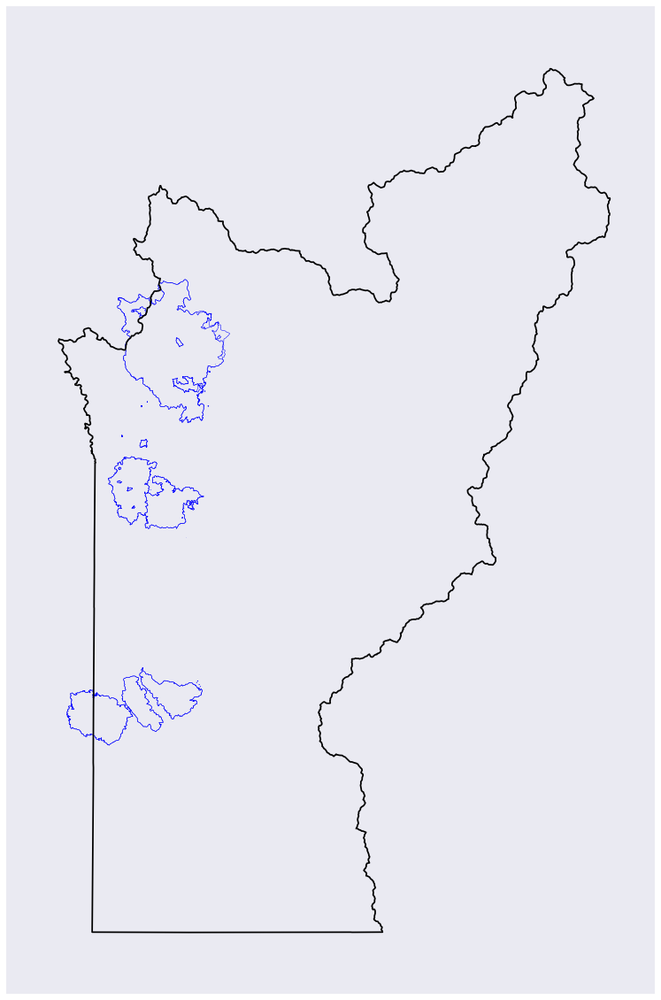

Date: 2015-08-30
--------------------------------------------------


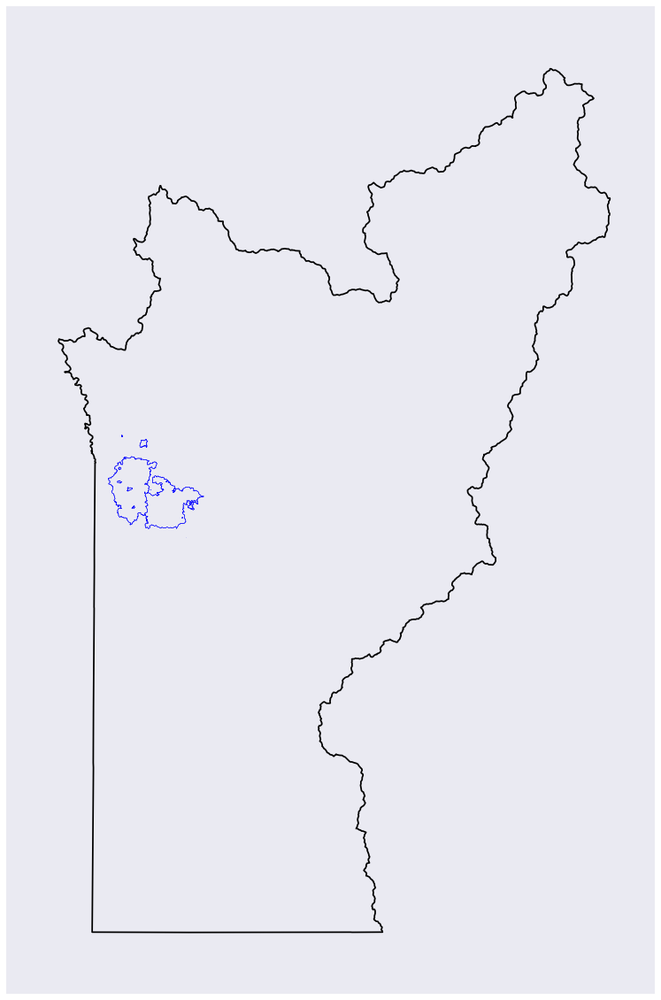

Date: 2015-08-31
--------------------------------------------------


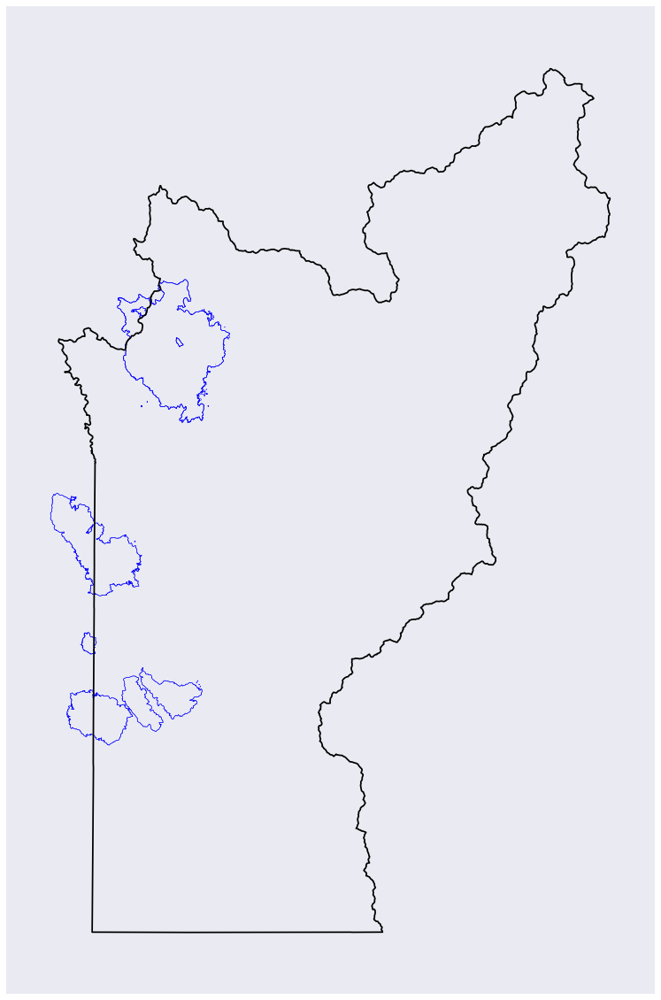

In [35]:
for dt in xrange(1, 32): 
    dt = '2015-08-0' + str(dt) if dt < 10 else '2015-08-' + str(dt)
    print 'Date: {}'.format(dt)
    print '-' * 50
    plot_county_dt('California', 'ca', '06', 'Trinity', dt)

If we look at Montana, we can see that in it's northwest region it also shows a resonable number of fires in August of 2015. 

Date: 2015-08-01
--------------------------------------------------


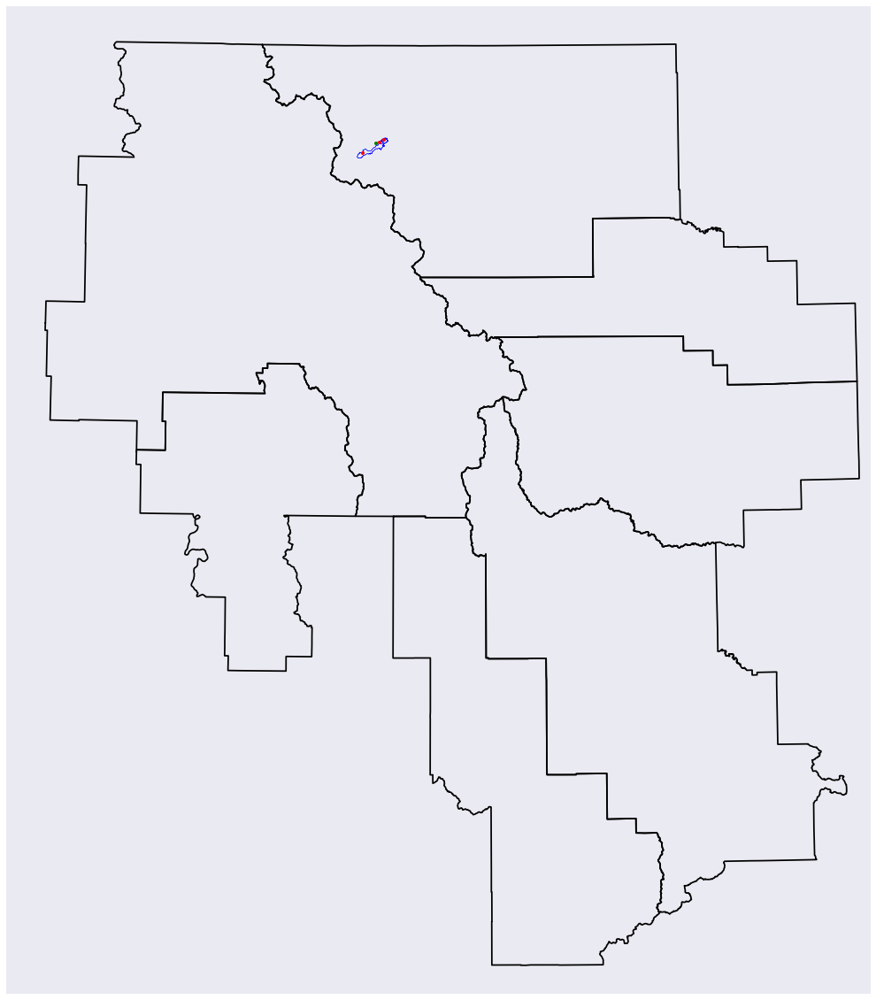

Date: 2015-08-02
--------------------------------------------------


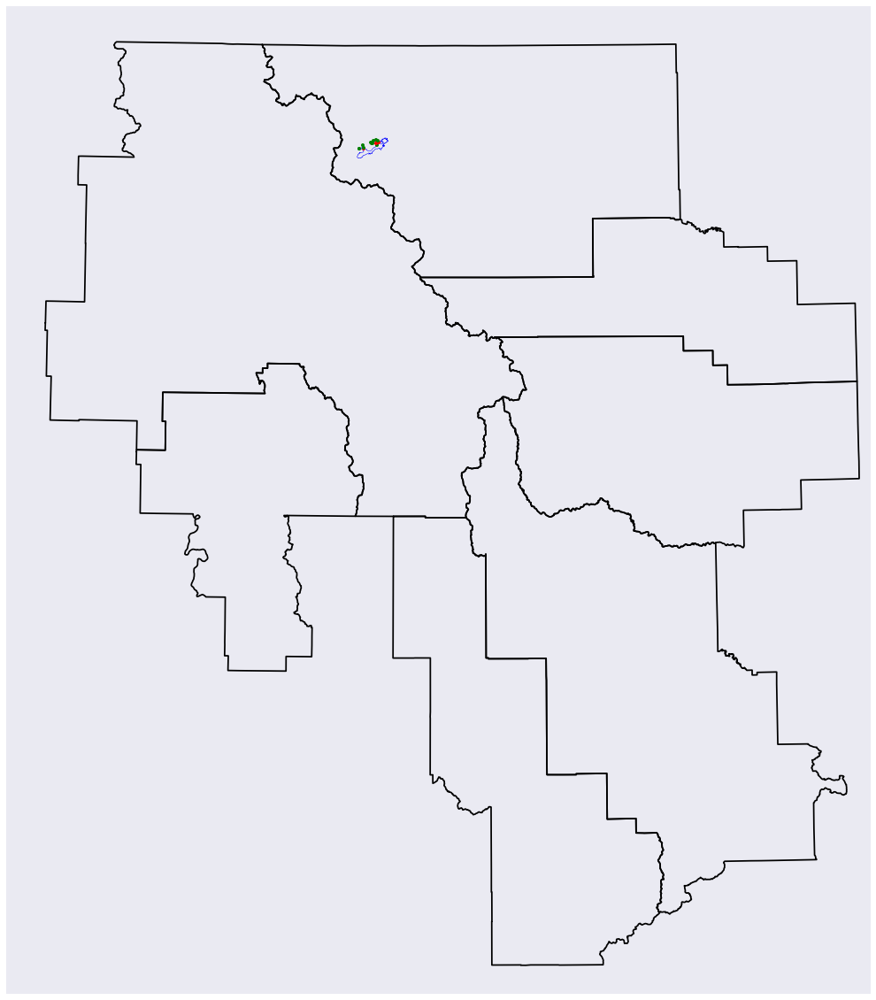

Date: 2015-08-03
--------------------------------------------------


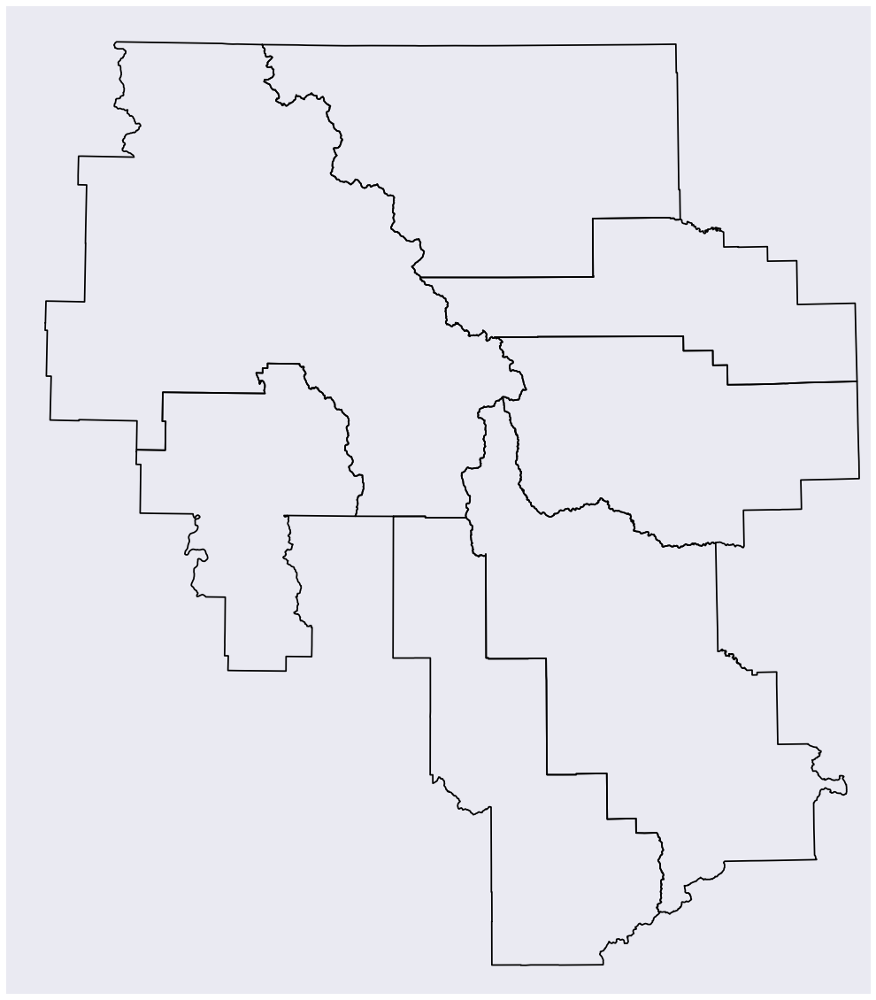

Date: 2015-08-04
--------------------------------------------------


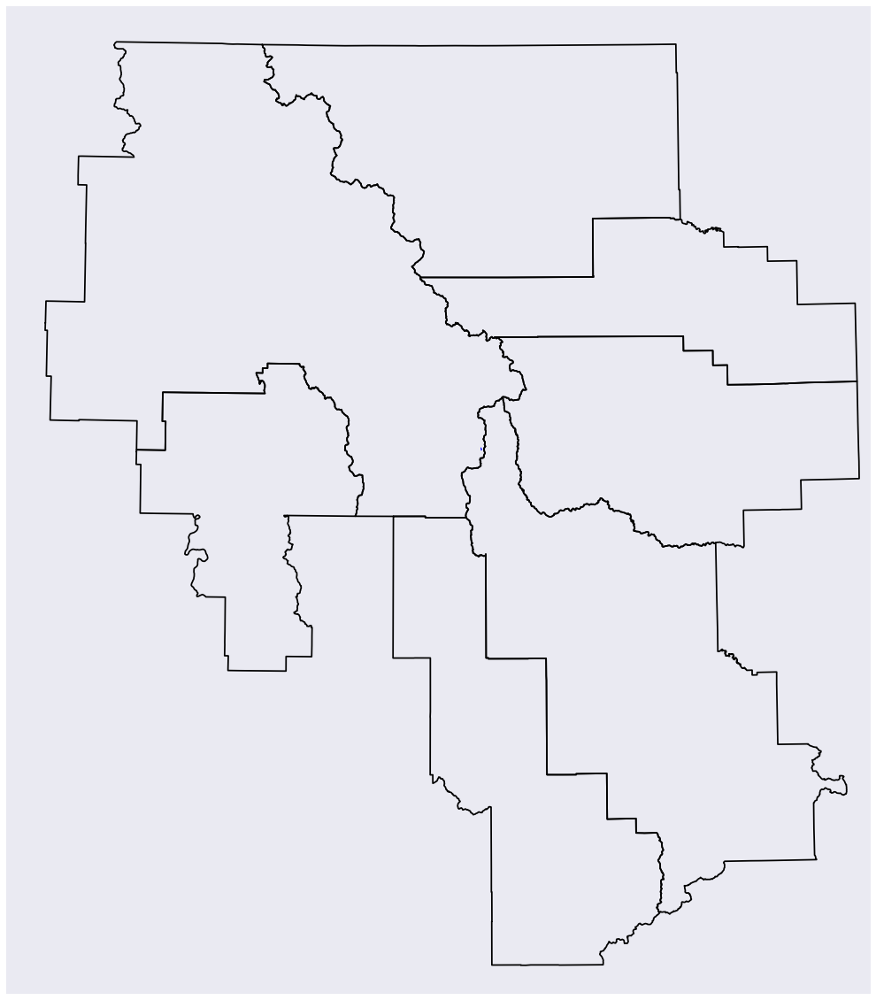

Date: 2015-08-05
--------------------------------------------------
list index out of range


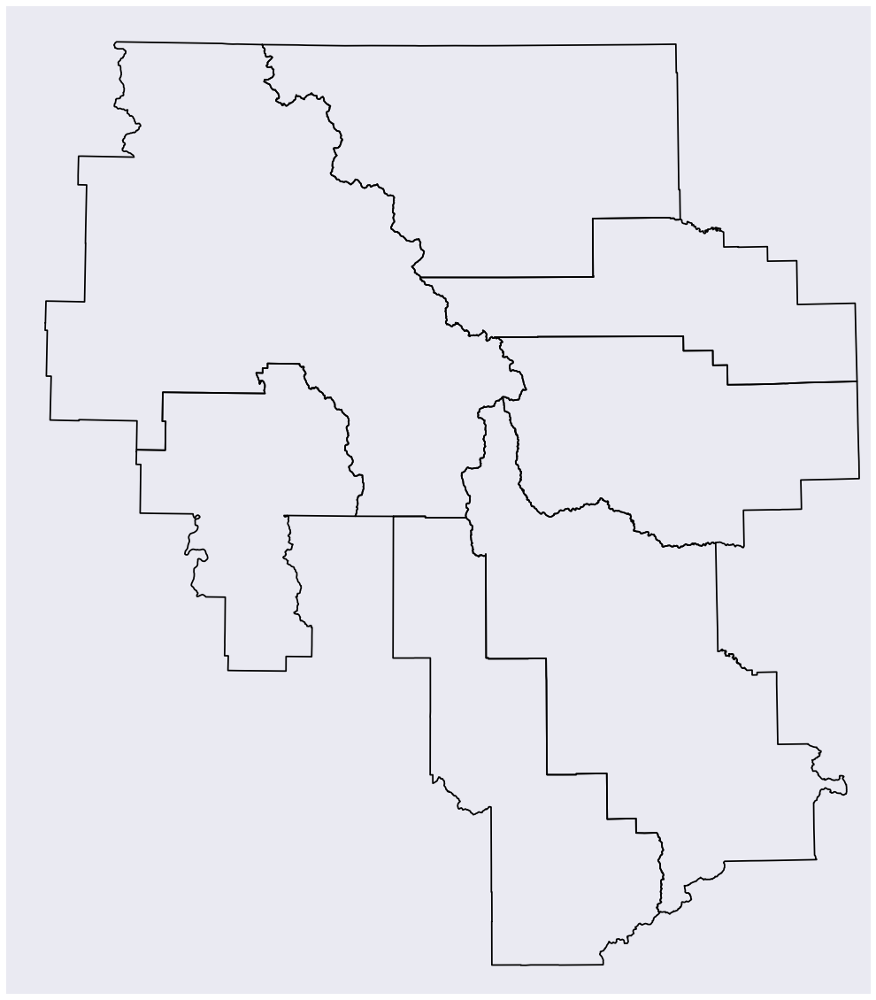

Date: 2015-08-06
--------------------------------------------------
list index out of range


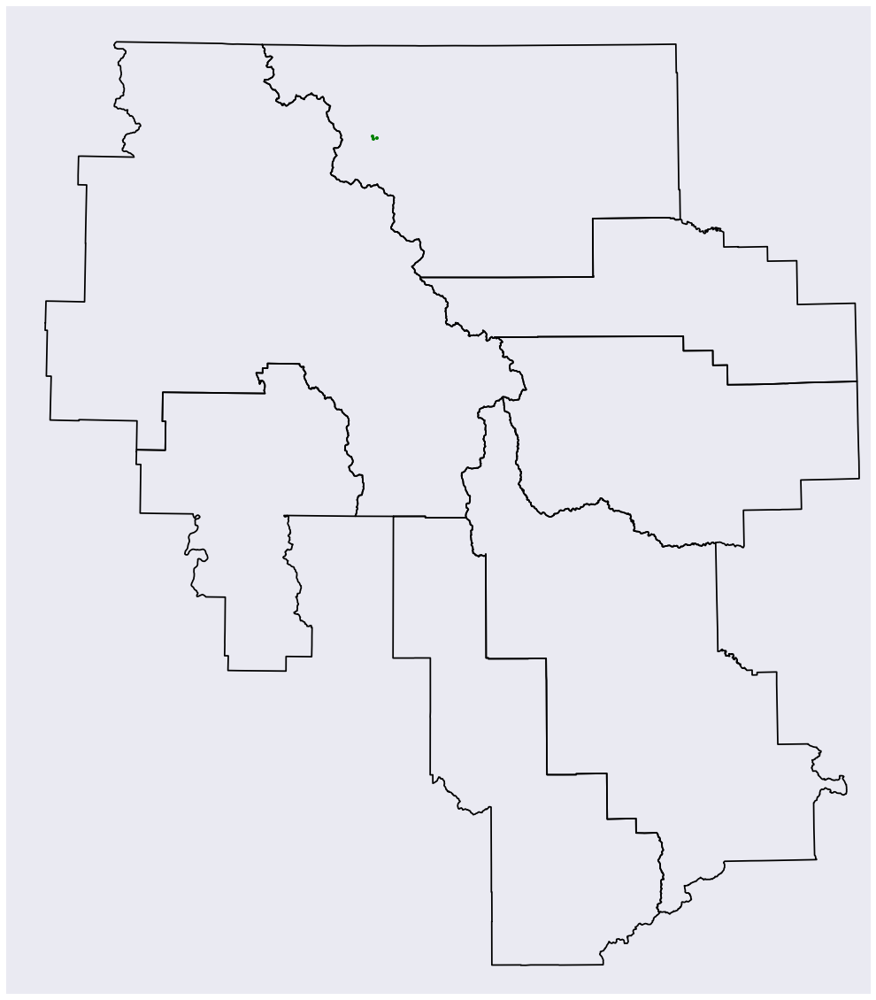

Date: 2015-08-07
--------------------------------------------------
list index out of range


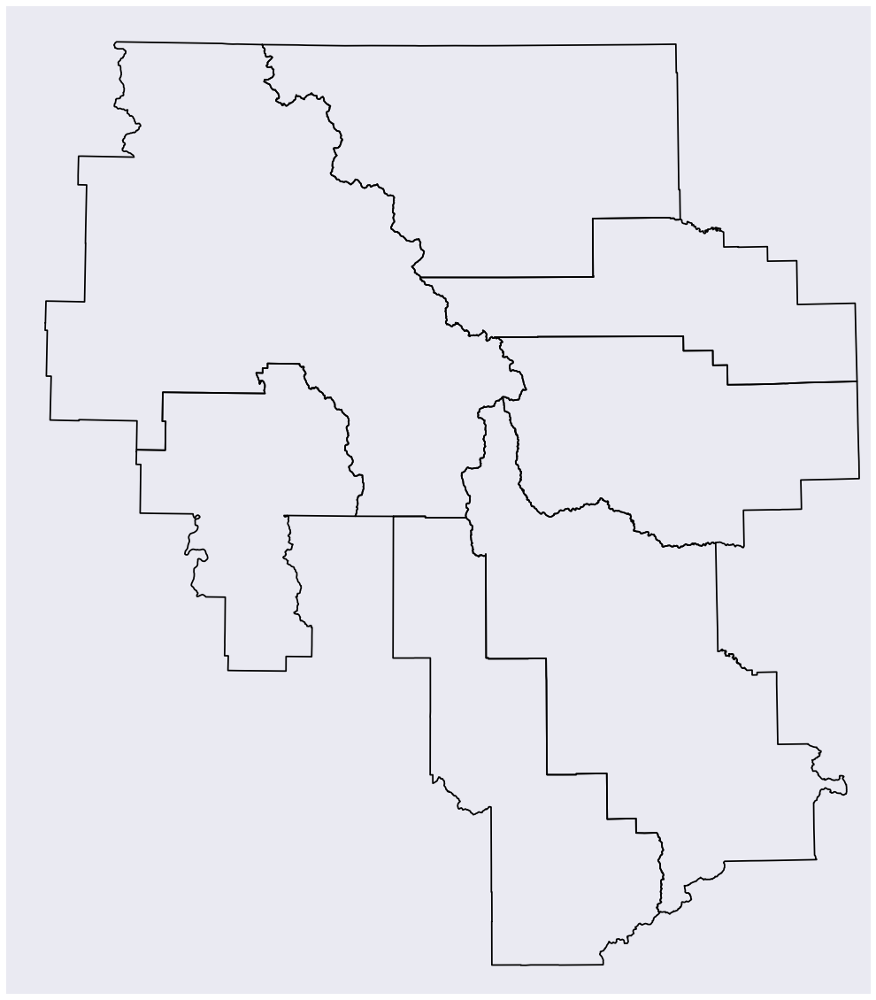

Date: 2015-08-08
--------------------------------------------------
list index out of range


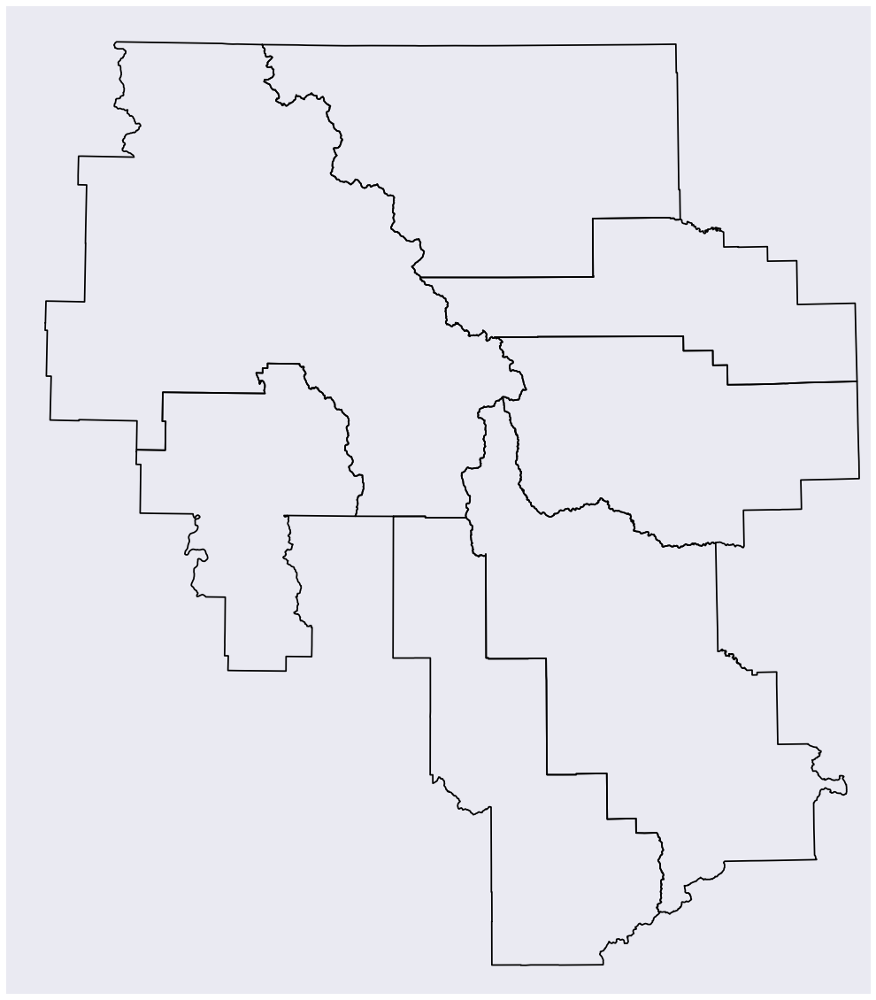

Date: 2015-08-09
--------------------------------------------------
list index out of range


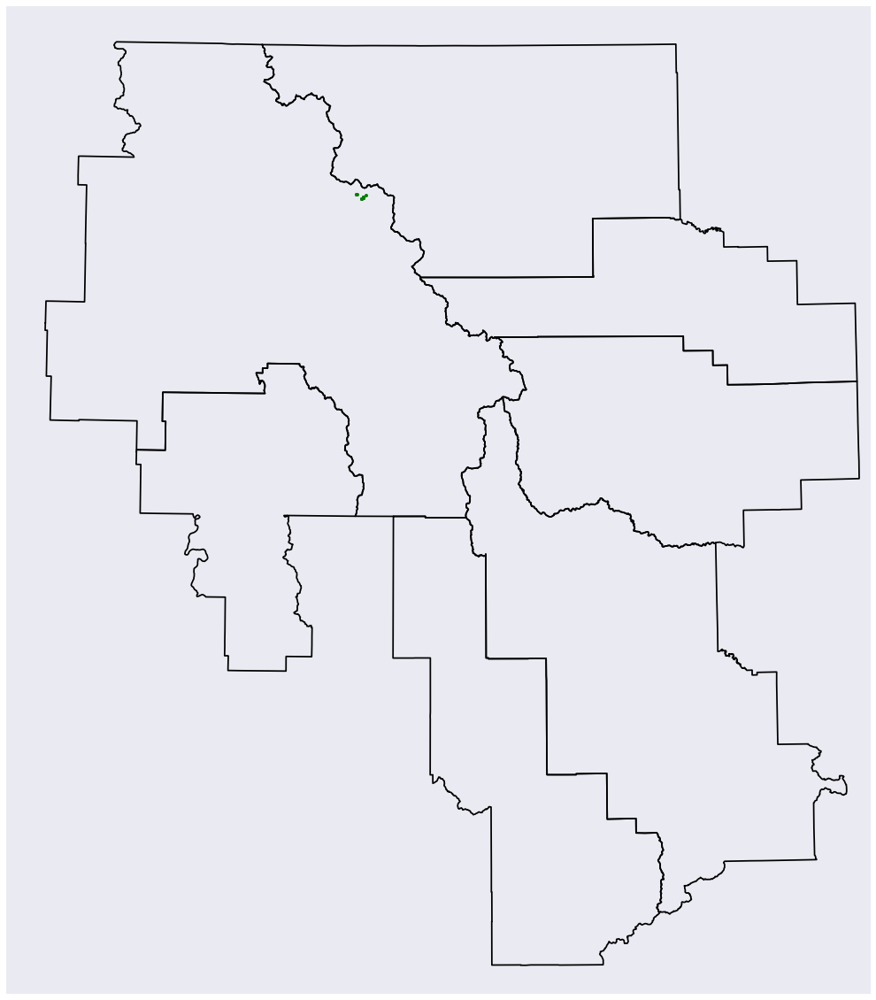

Date: 2015-08-10
--------------------------------------------------
list index out of range


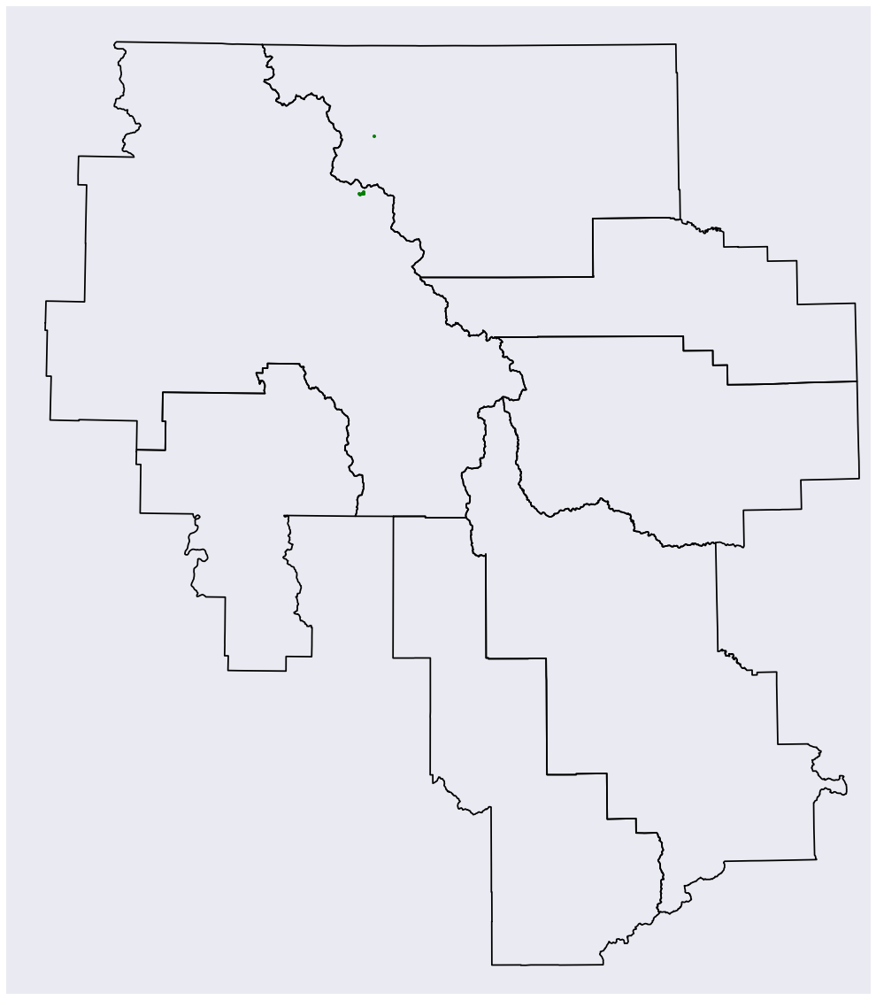

Date: 2015-08-11
--------------------------------------------------


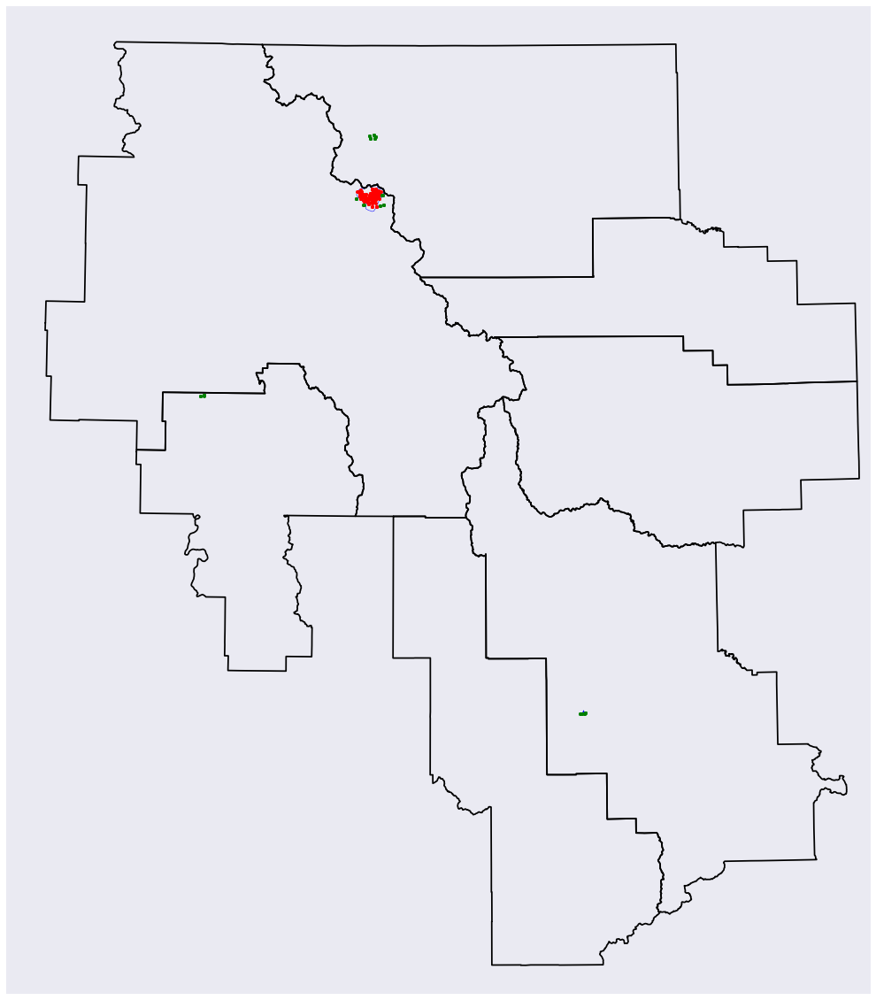

Date: 2015-08-12
--------------------------------------------------


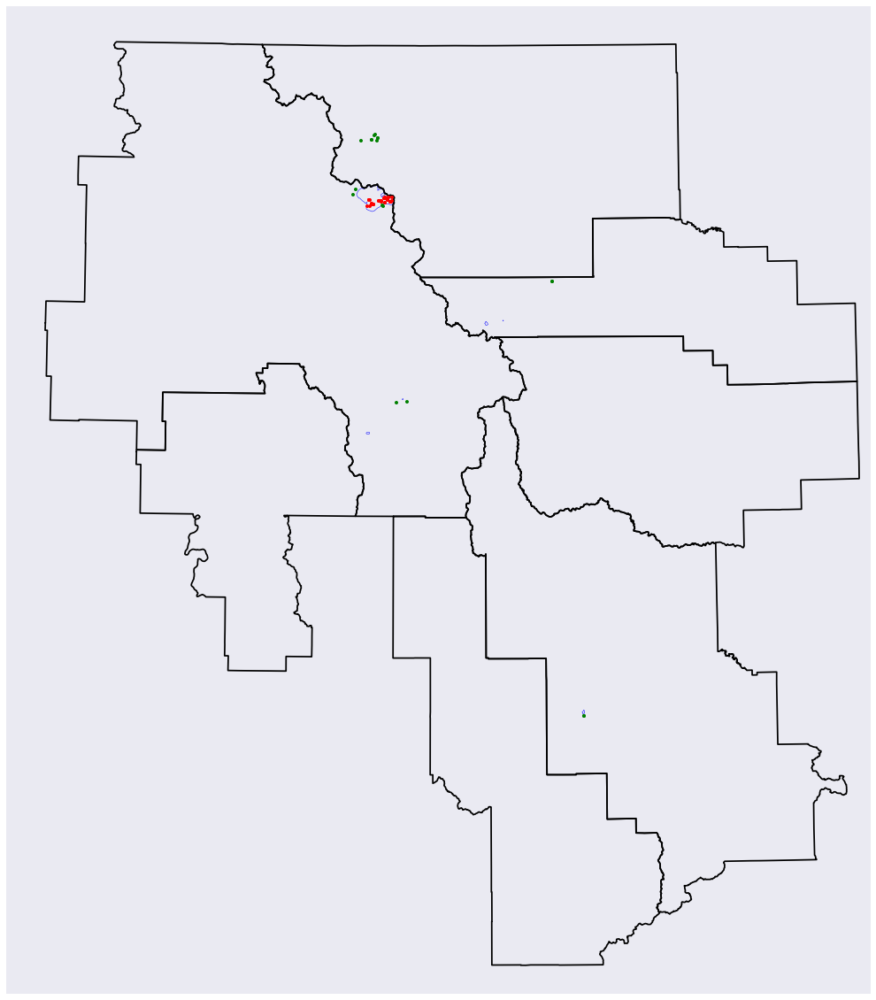

Date: 2015-08-13
--------------------------------------------------


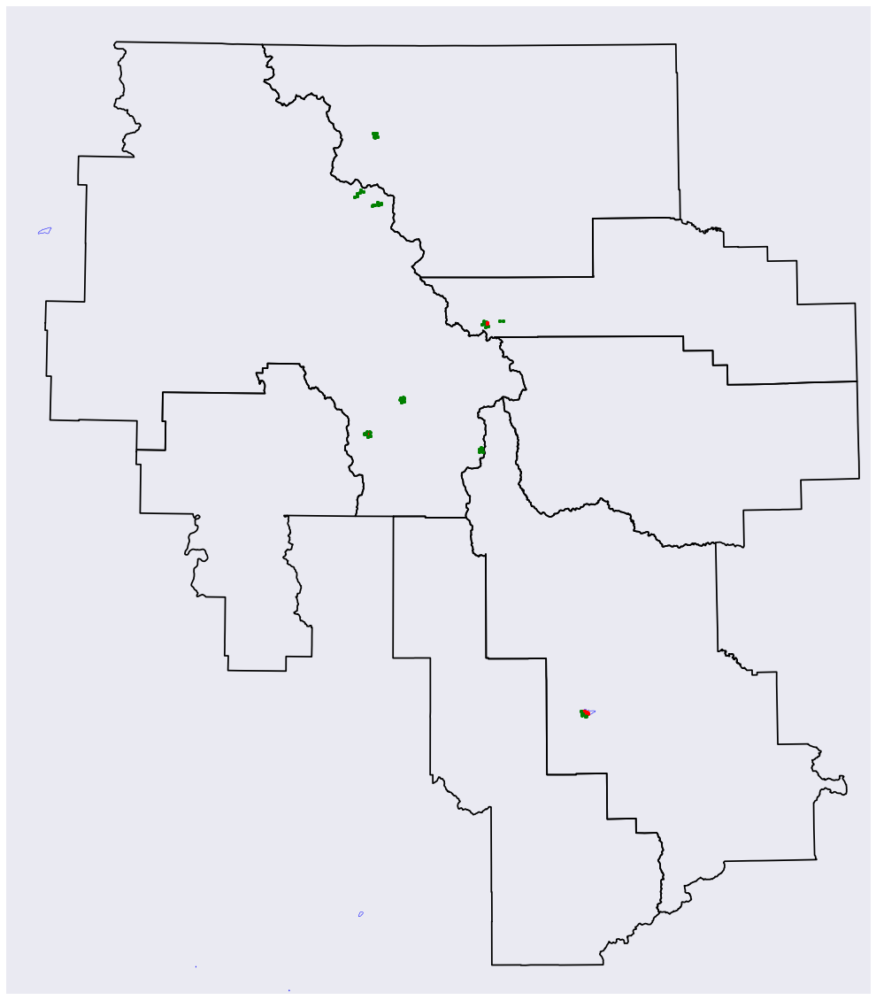

Date: 2015-08-14
--------------------------------------------------


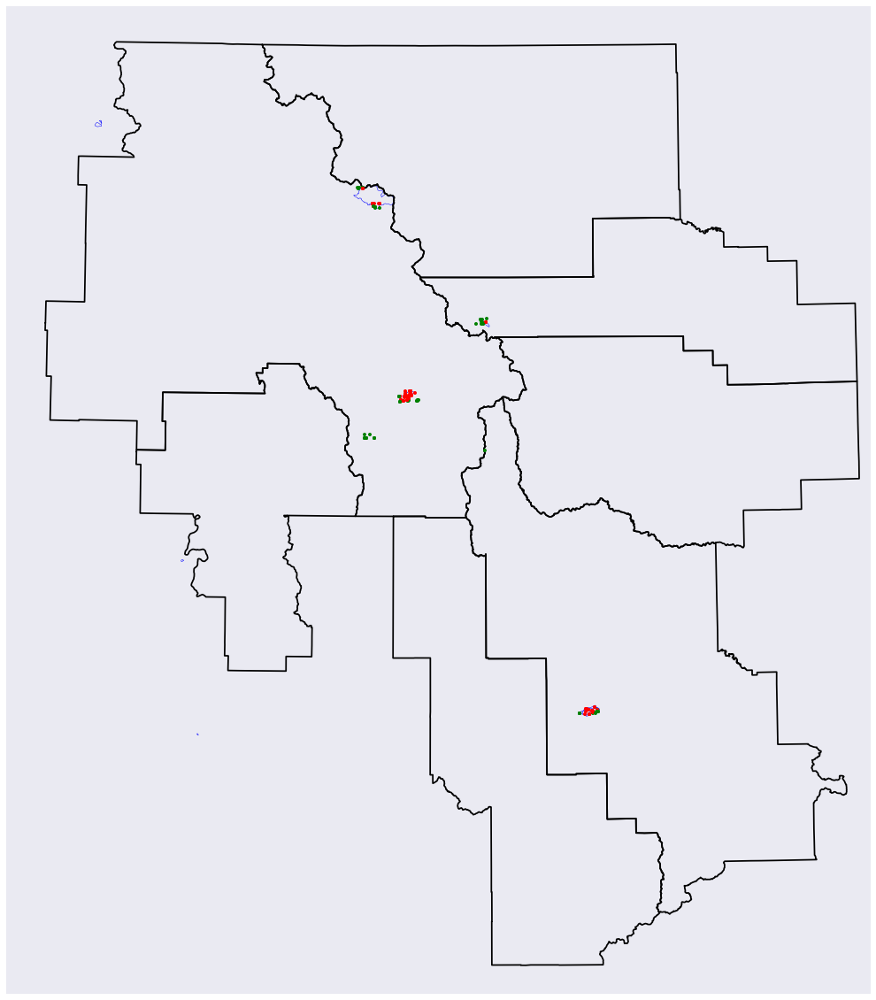

Date: 2015-08-15
--------------------------------------------------


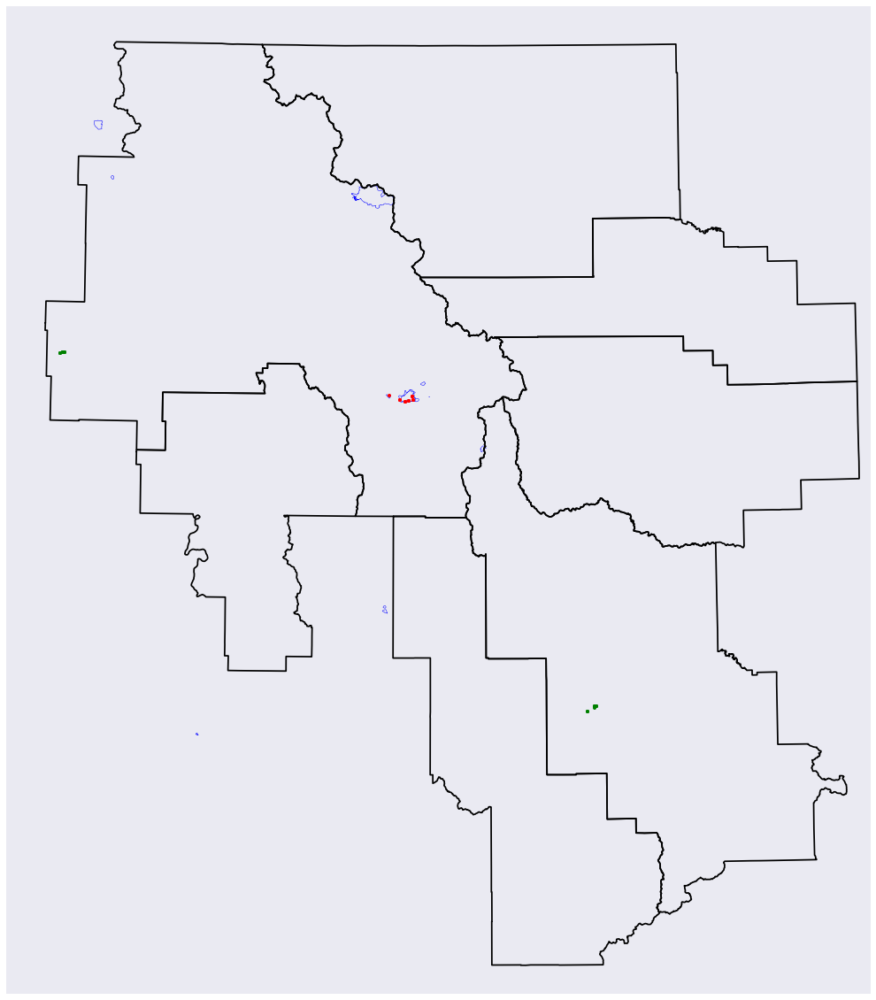

Date: 2015-08-16
--------------------------------------------------


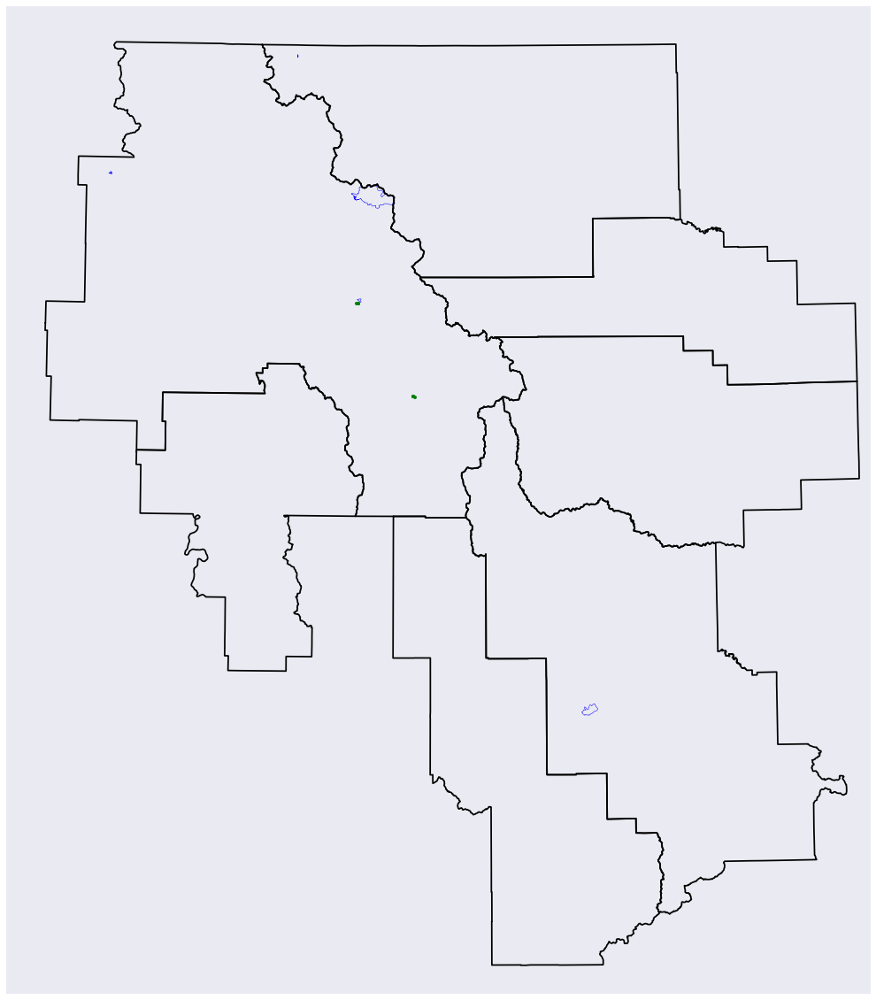

Date: 2015-08-17
--------------------------------------------------


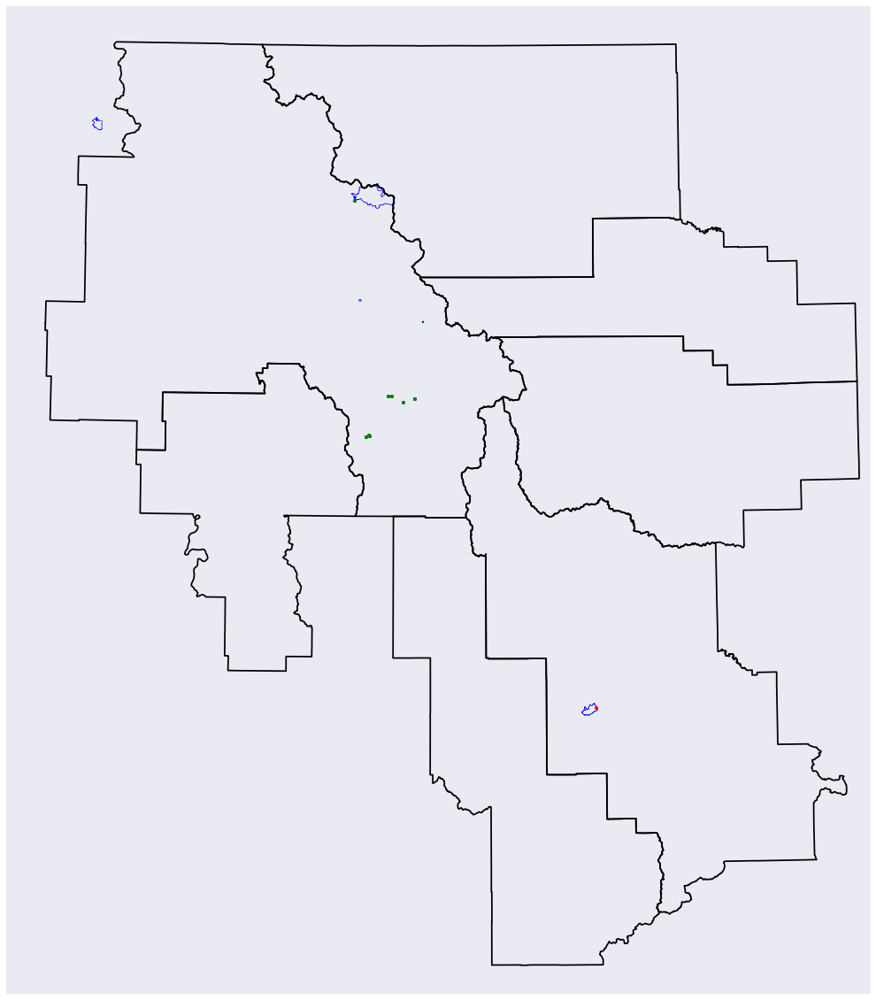

Date: 2015-08-18
--------------------------------------------------


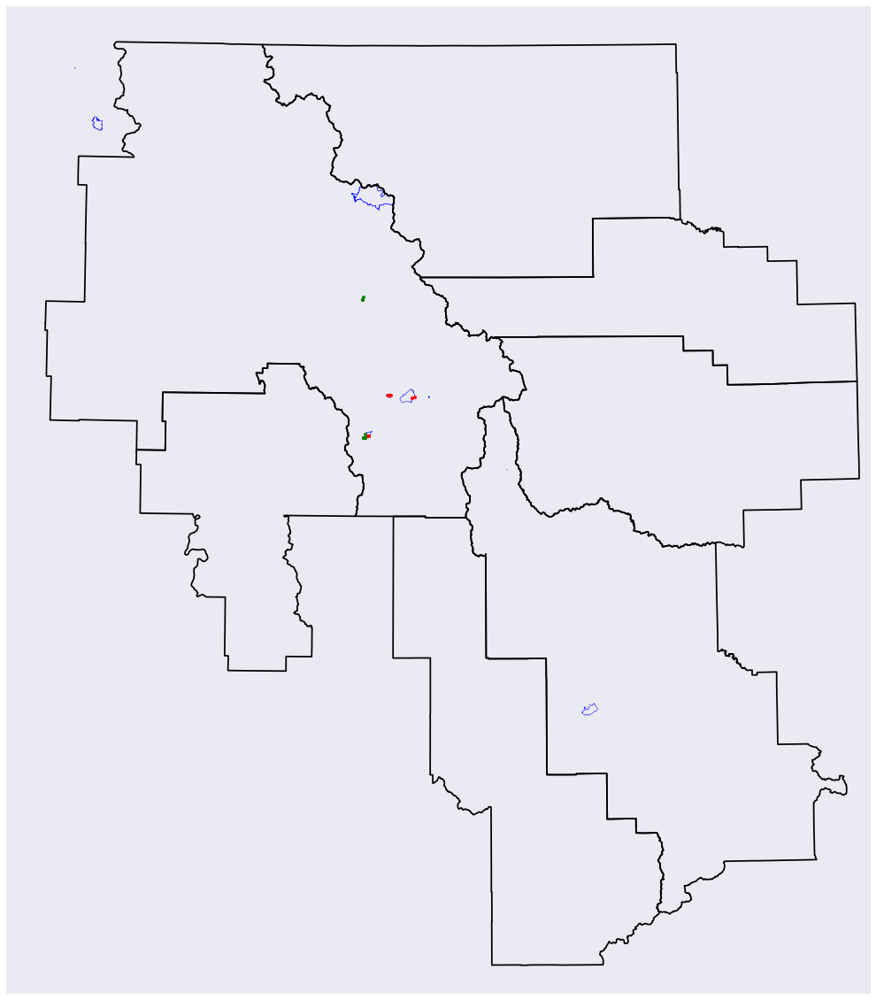

Date: 2015-08-19
--------------------------------------------------


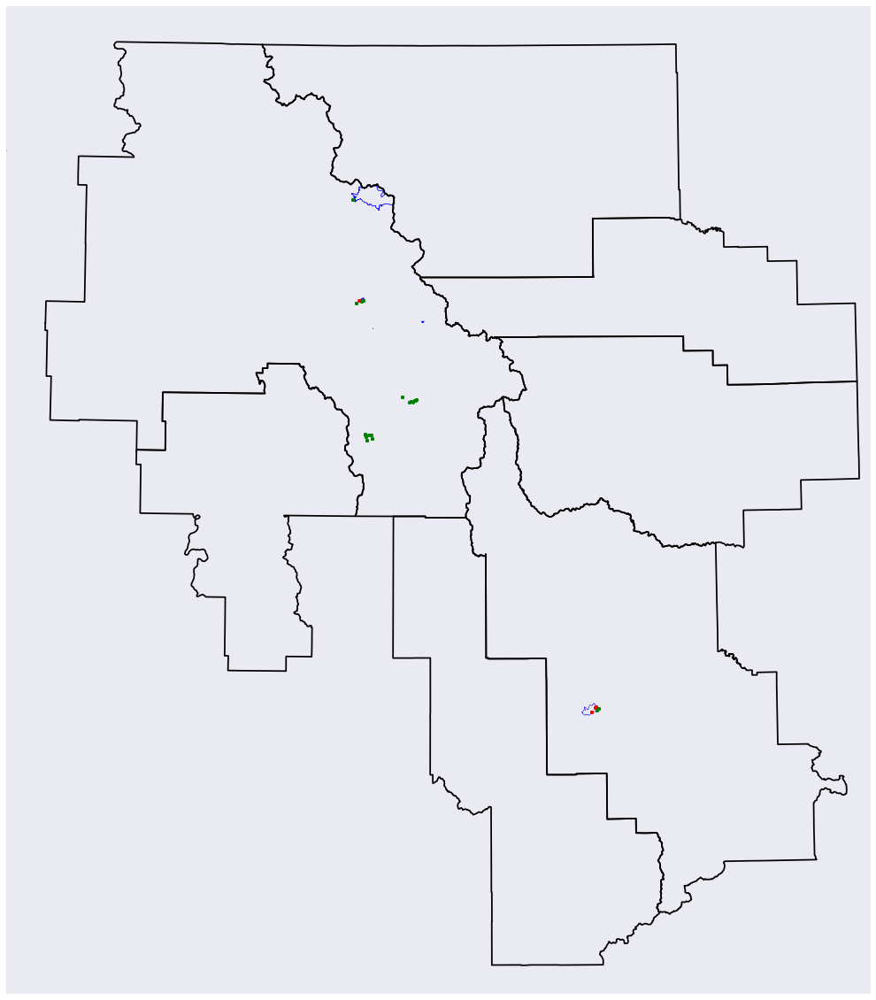

Date: 2015-08-20
--------------------------------------------------


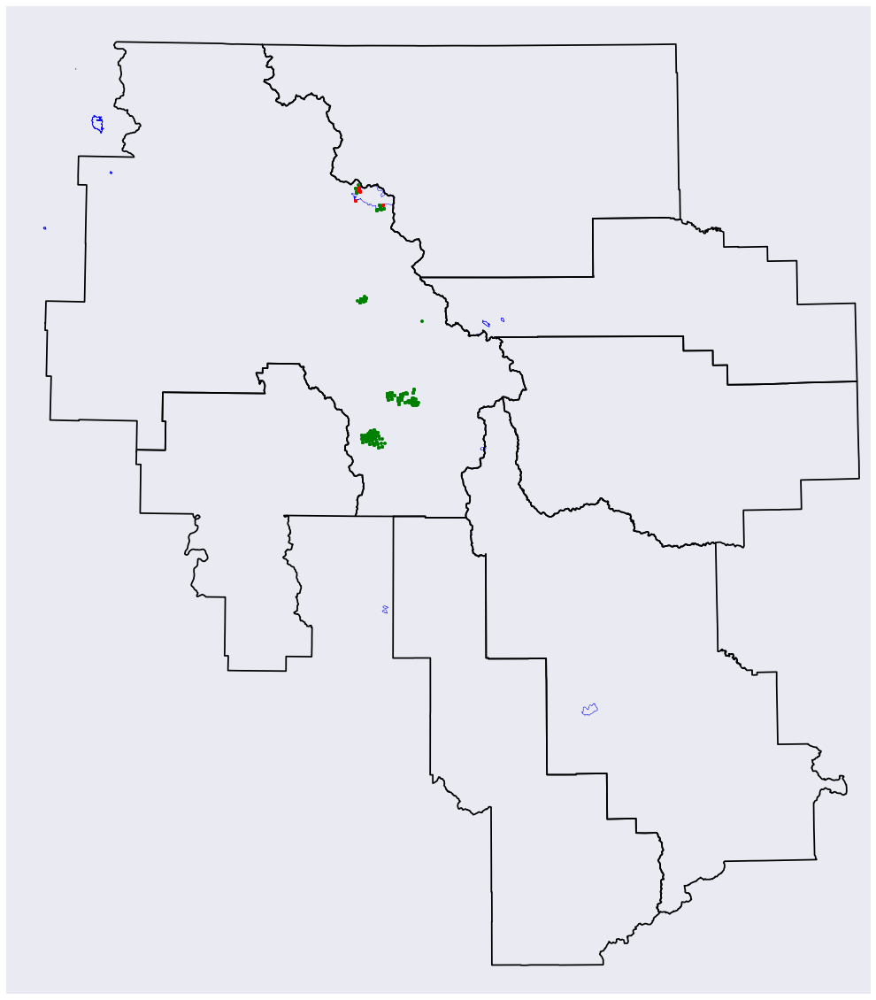

Date: 2015-08-21
--------------------------------------------------


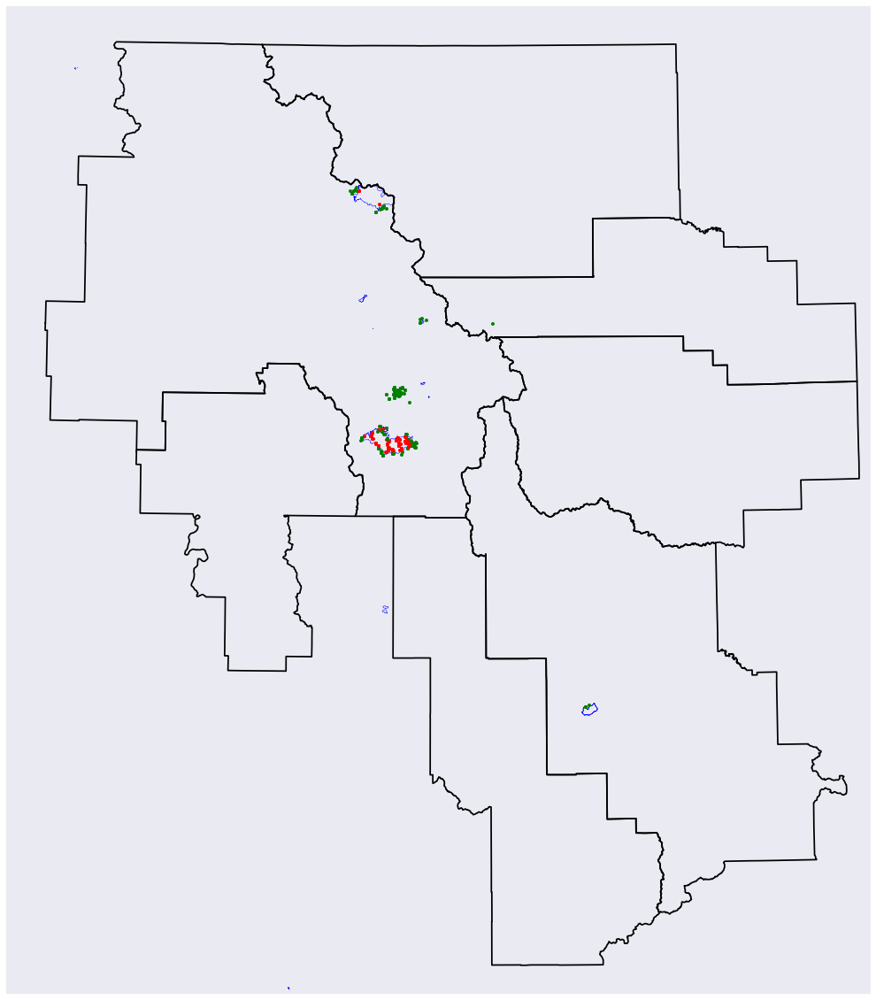

Date: 2015-08-22
--------------------------------------------------


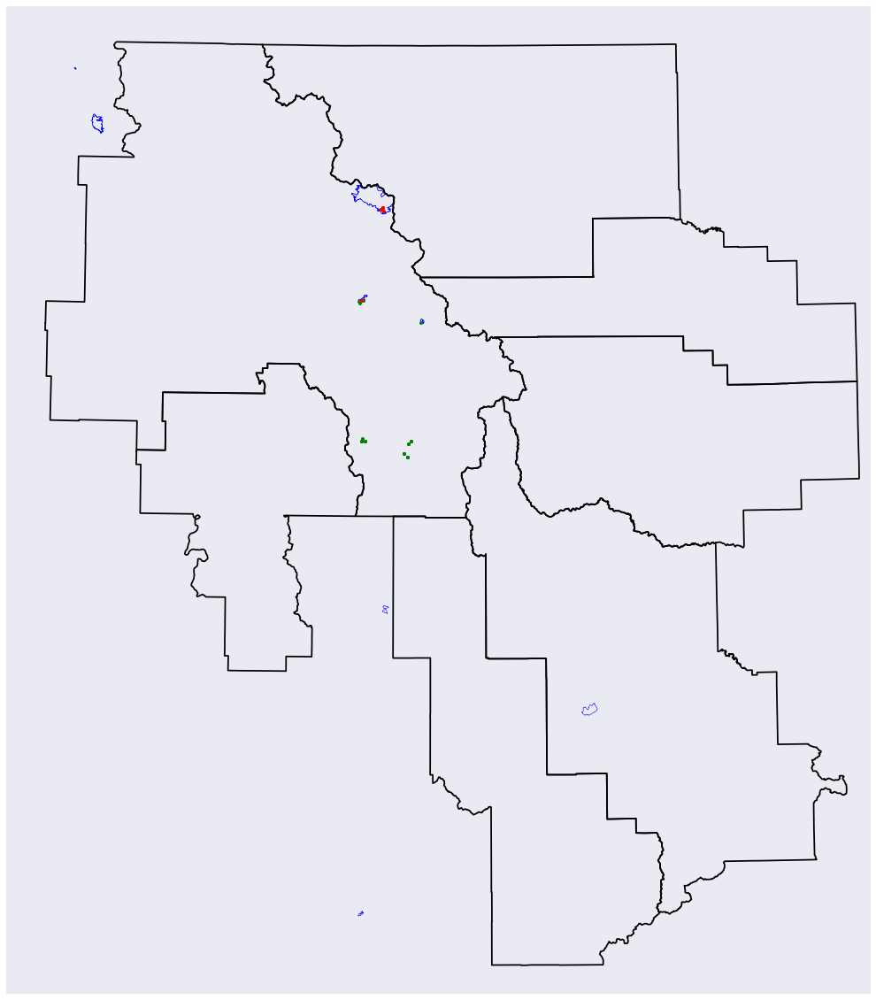

Date: 2015-08-23
--------------------------------------------------


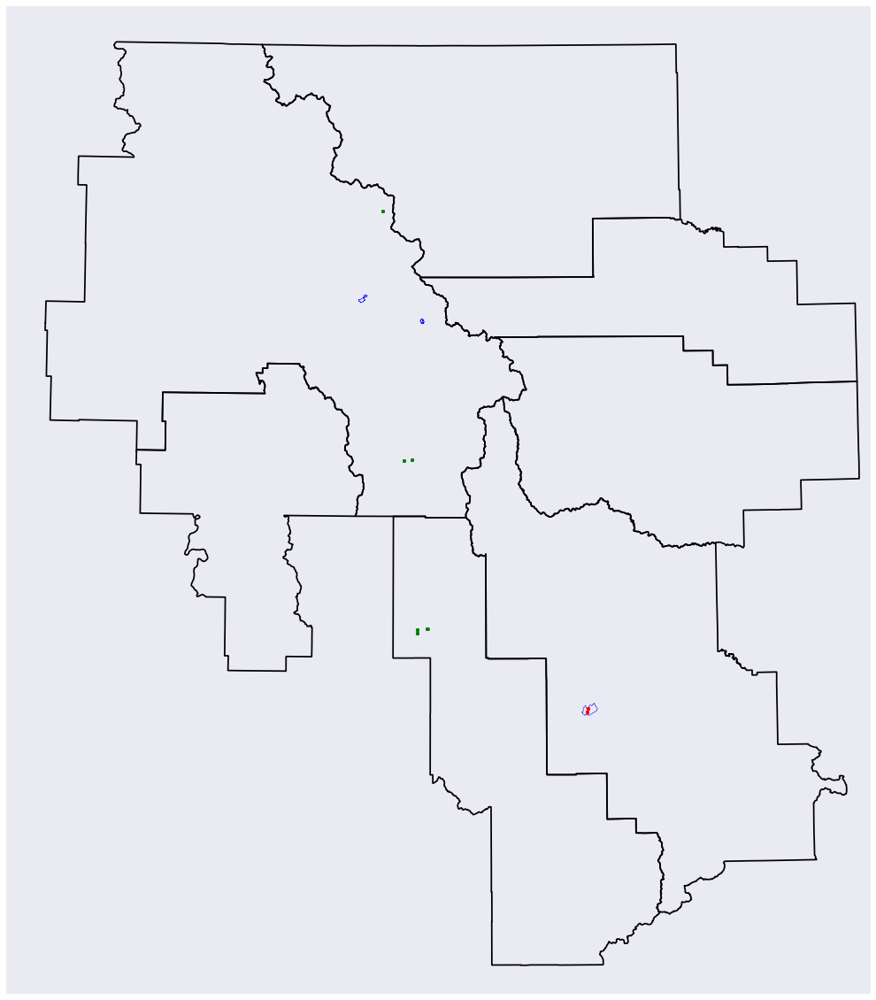

Date: 2015-08-24
--------------------------------------------------


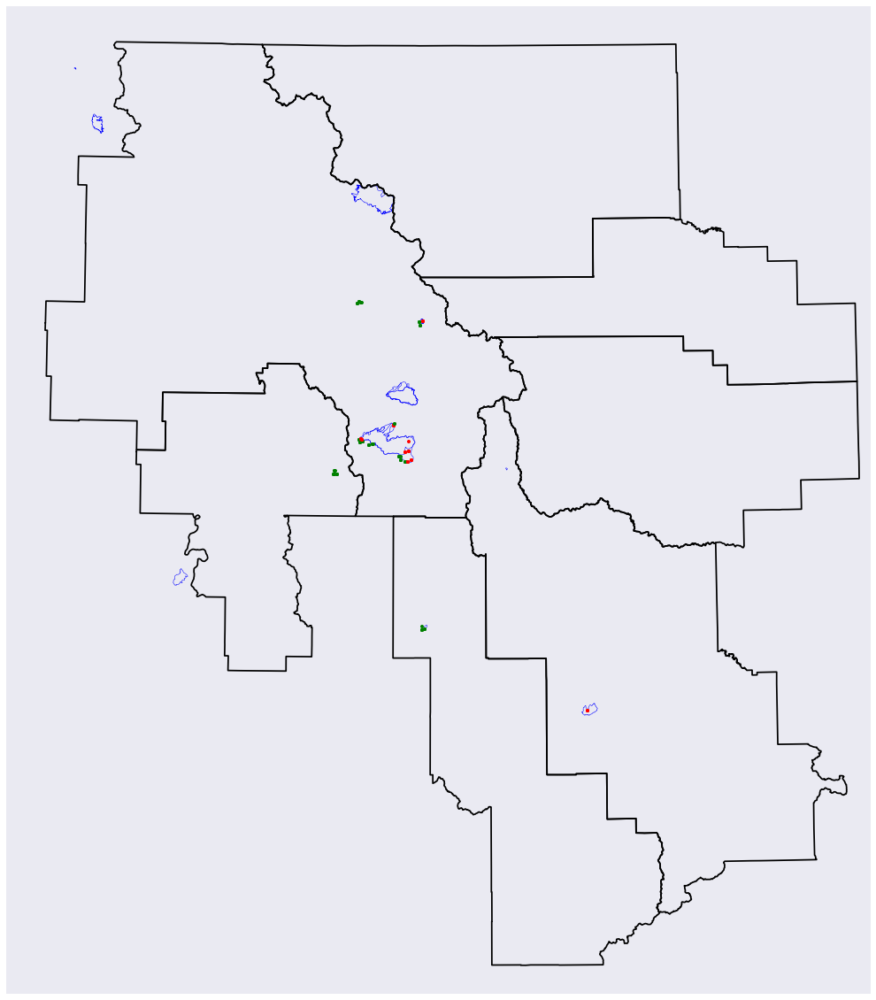

Date: 2015-08-25
--------------------------------------------------


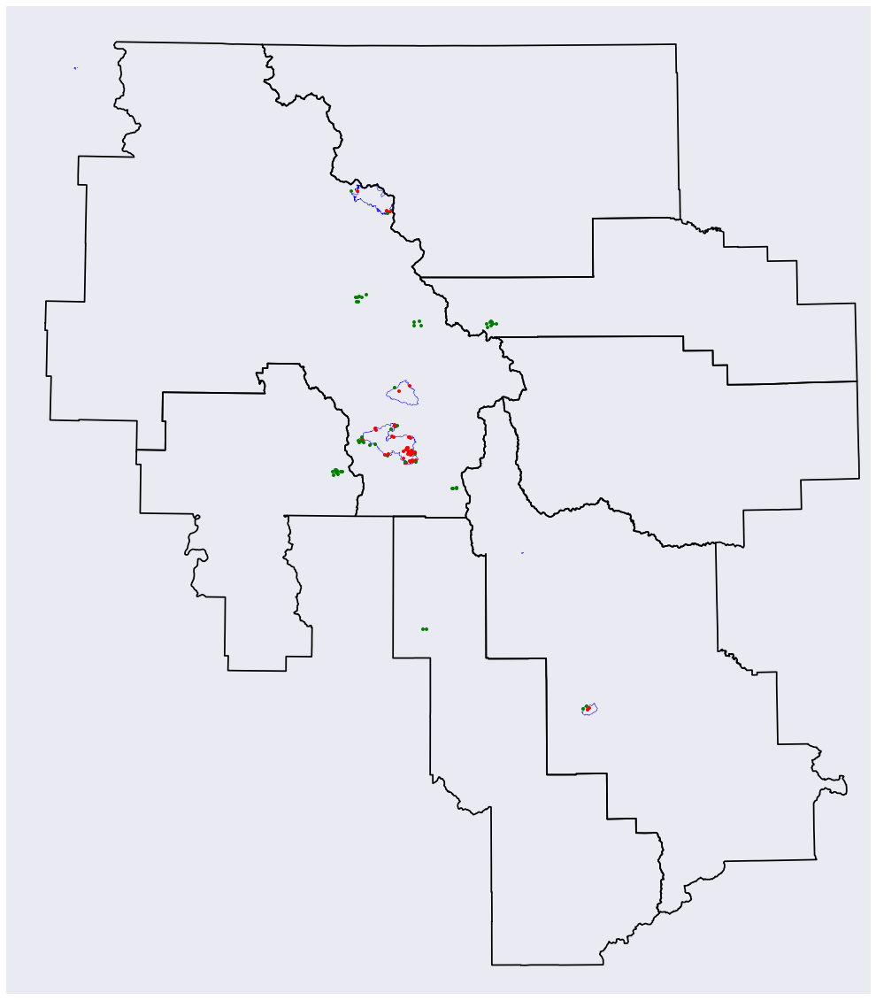

Date: 2015-08-26
--------------------------------------------------


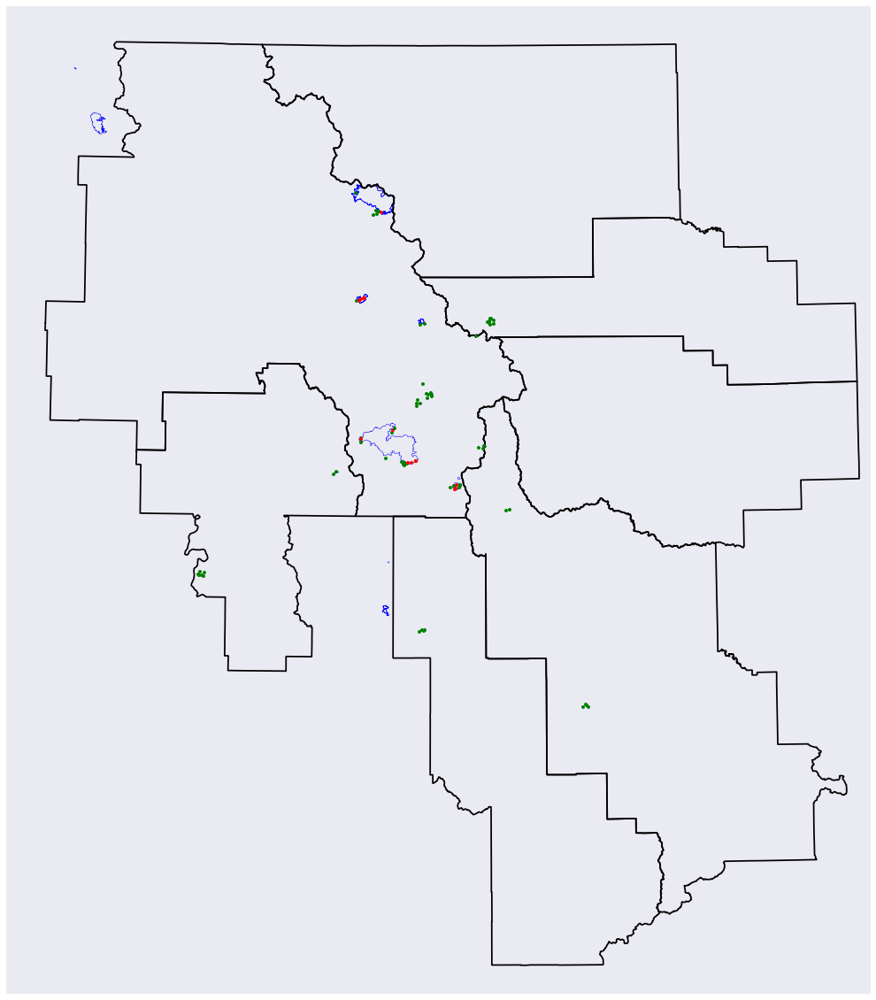

Date: 2015-08-27
--------------------------------------------------


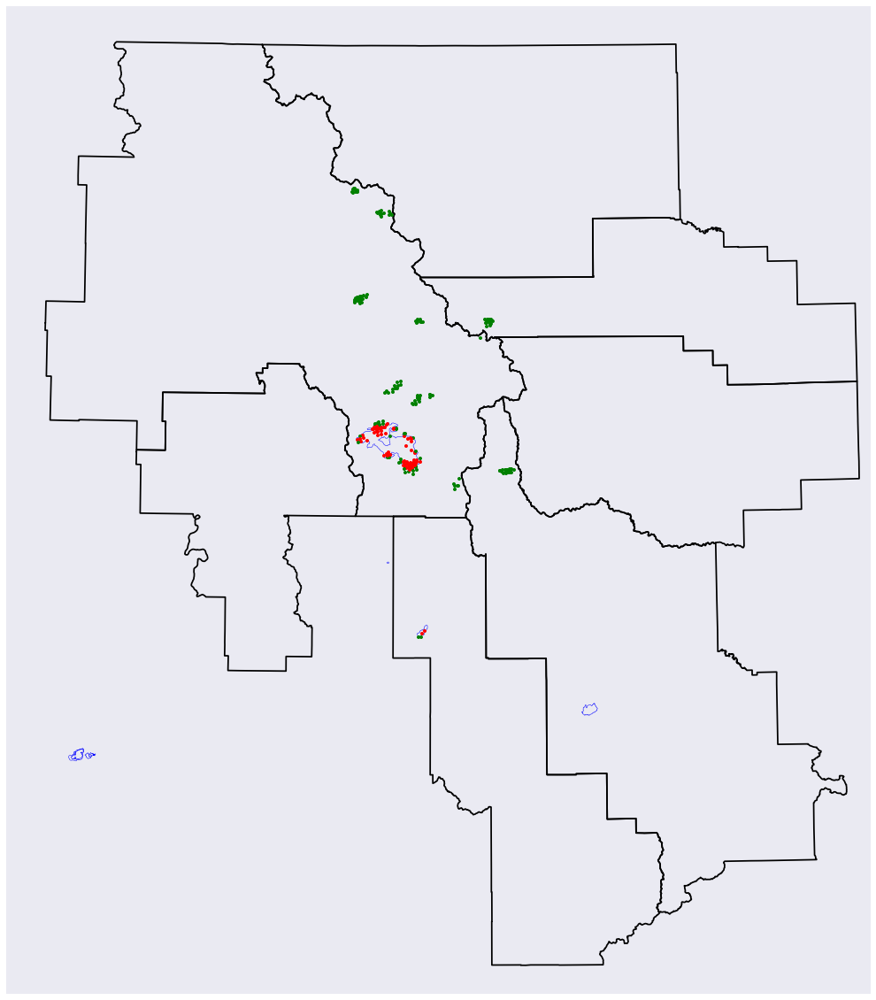

Date: 2015-08-28
--------------------------------------------------


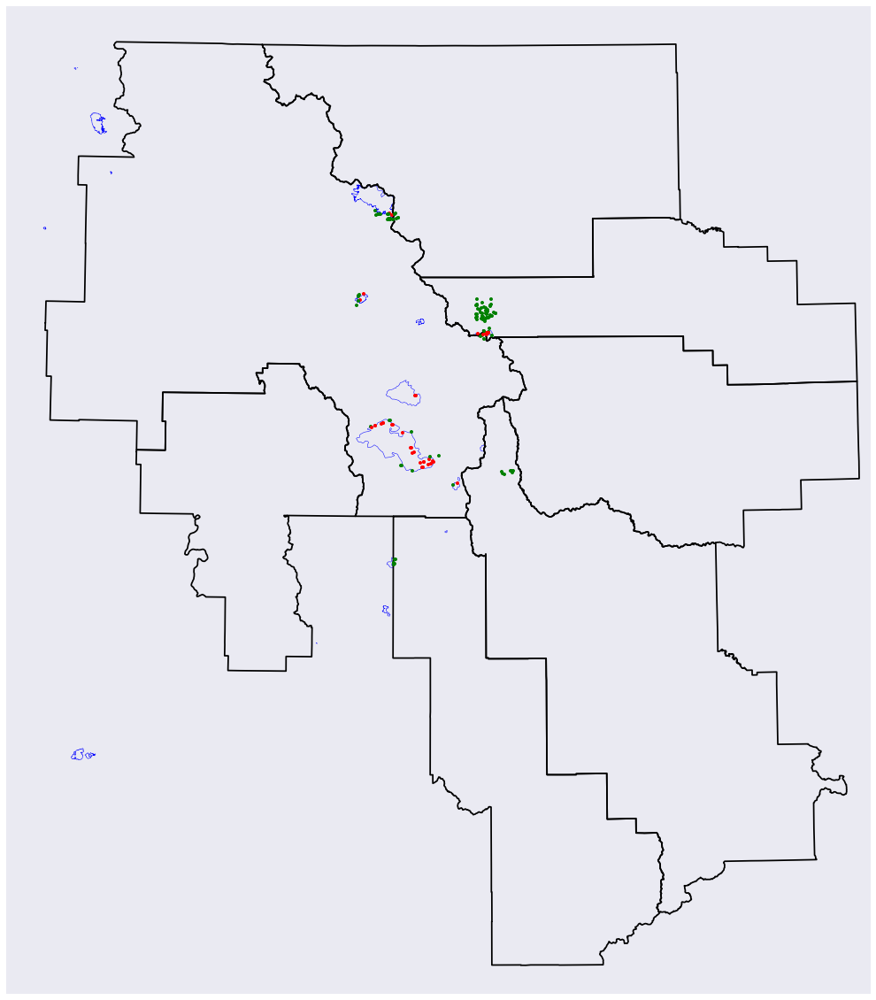

Date: 2015-08-29
--------------------------------------------------


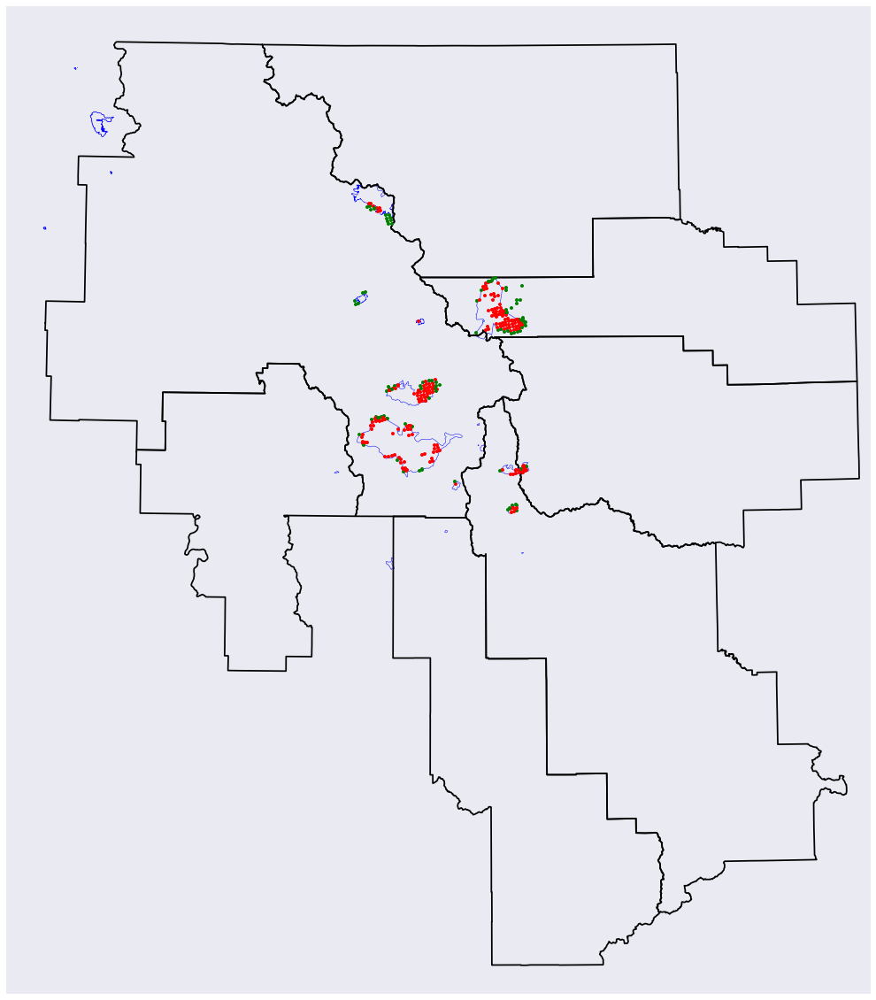

Date: 2015-08-30
--------------------------------------------------


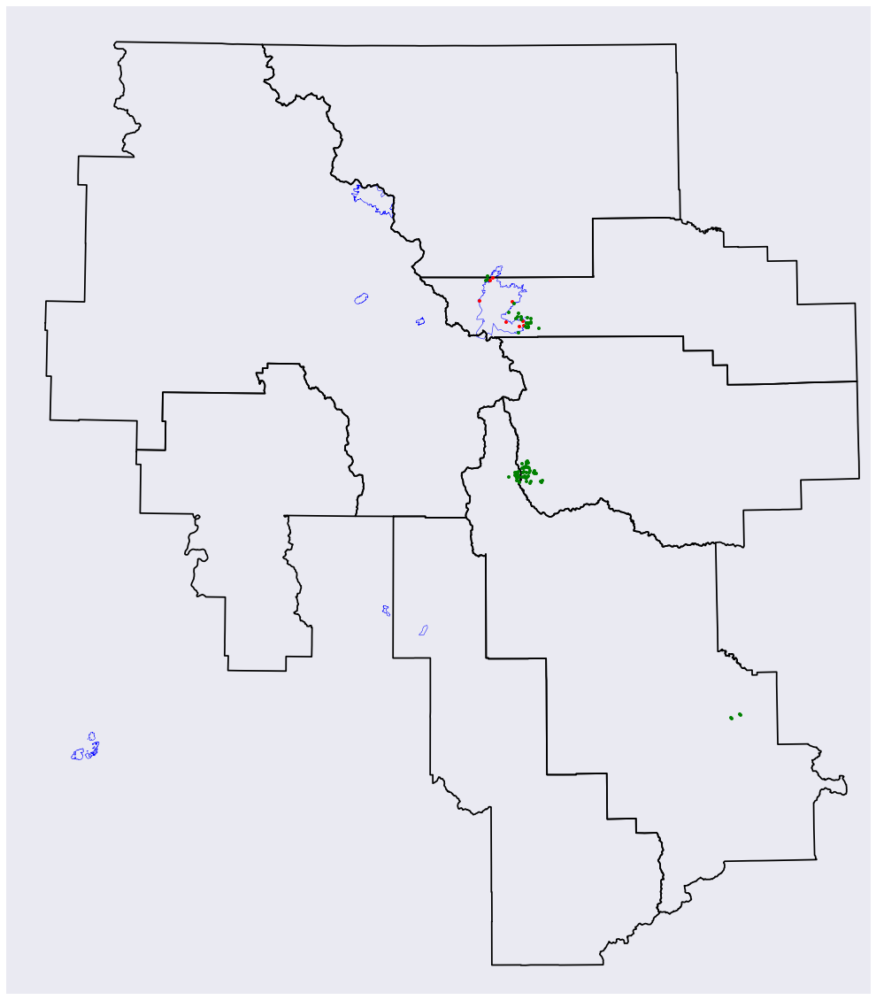

Date: 2015-08-31
--------------------------------------------------


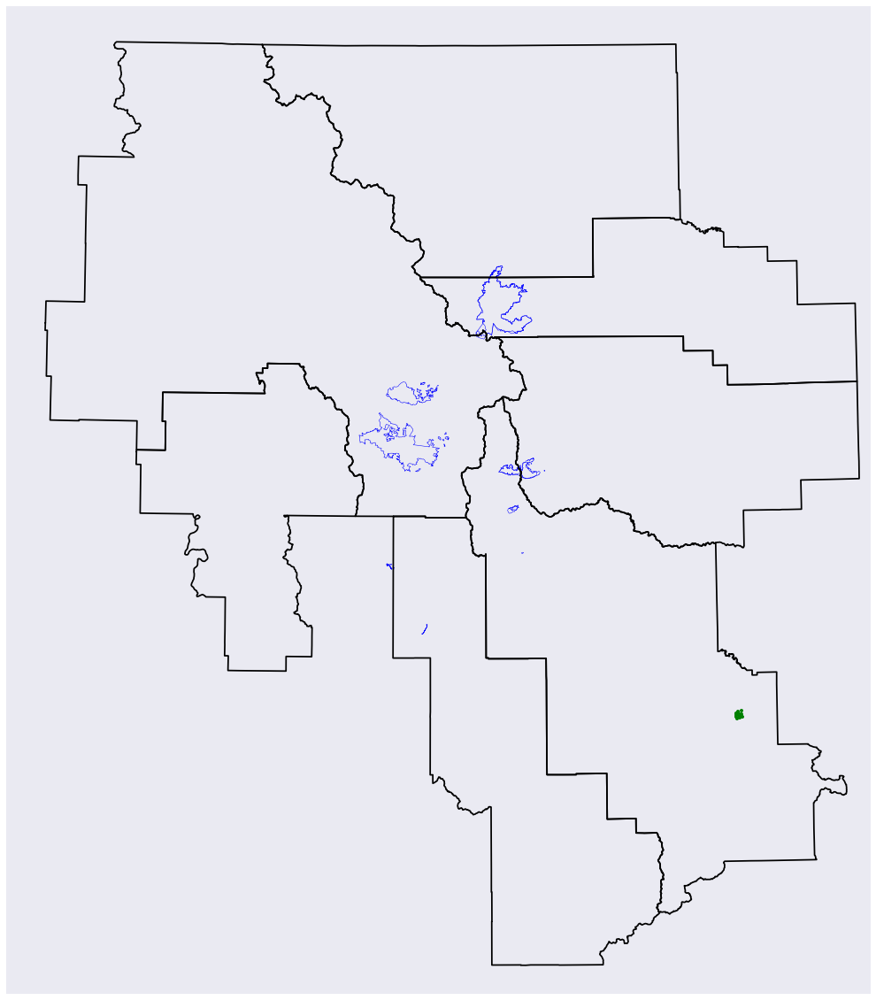

In [36]:
for dt in xrange(1, 32): 
    dt = '2015-08-0' + str(dt) if dt < 10 else '2015-08-' + str(dt)
    print 'Date: {}'.format(dt)
    print '-' * 50
    plot_county_dt('Montana', 'mt', '30', ['Glacier', 'Flathead', 'Pondera', 'Teton', 'Lewis and Clark', 'Lake', 'Powell'], dt)

Finally, in the middle of Washington, we can see a good amount of fires in September. 

Date: 2012-09-01
--------------------------------------------------


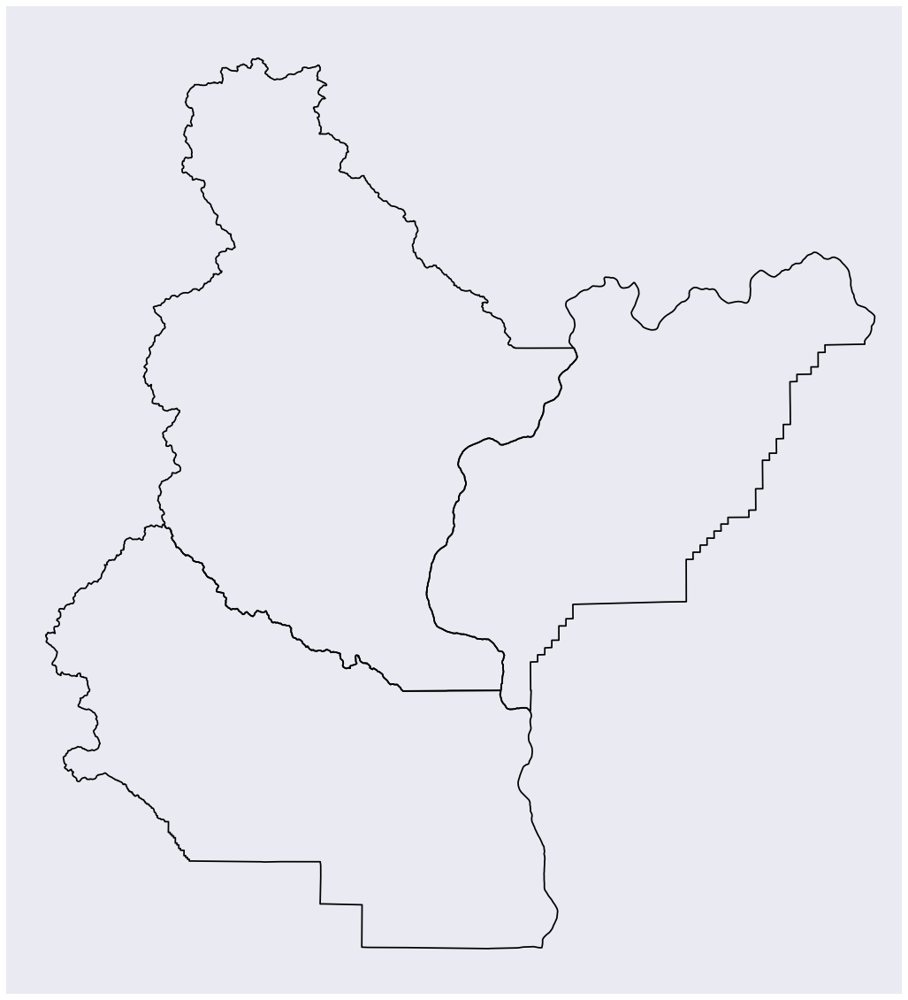

Date: 2012-09-02
--------------------------------------------------


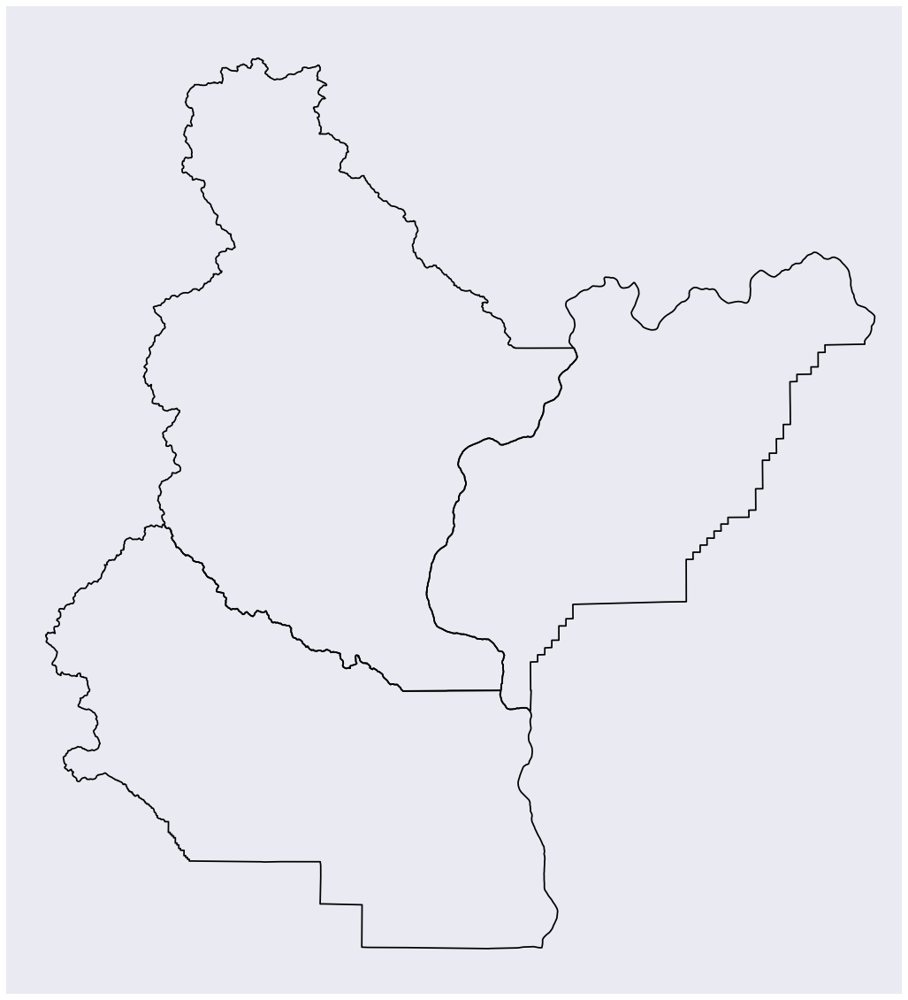

Date: 2012-09-03
--------------------------------------------------
list index out of range


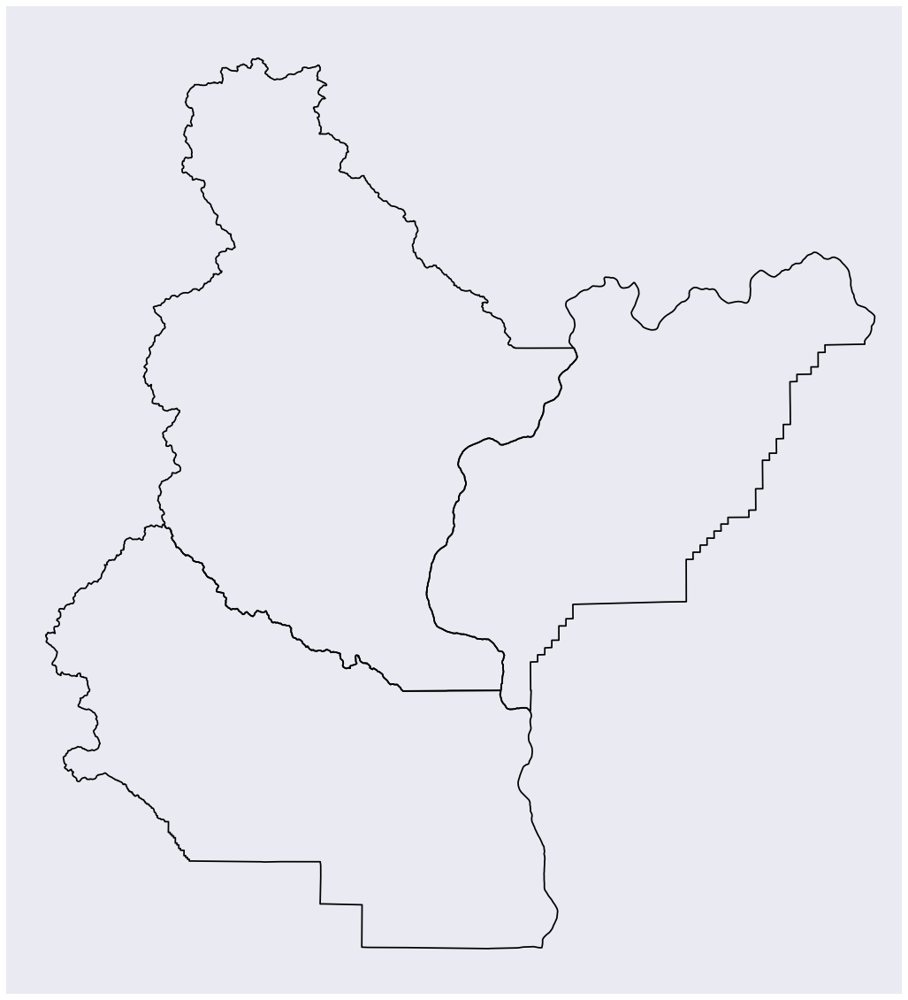

Date: 2012-09-04
--------------------------------------------------
list index out of range


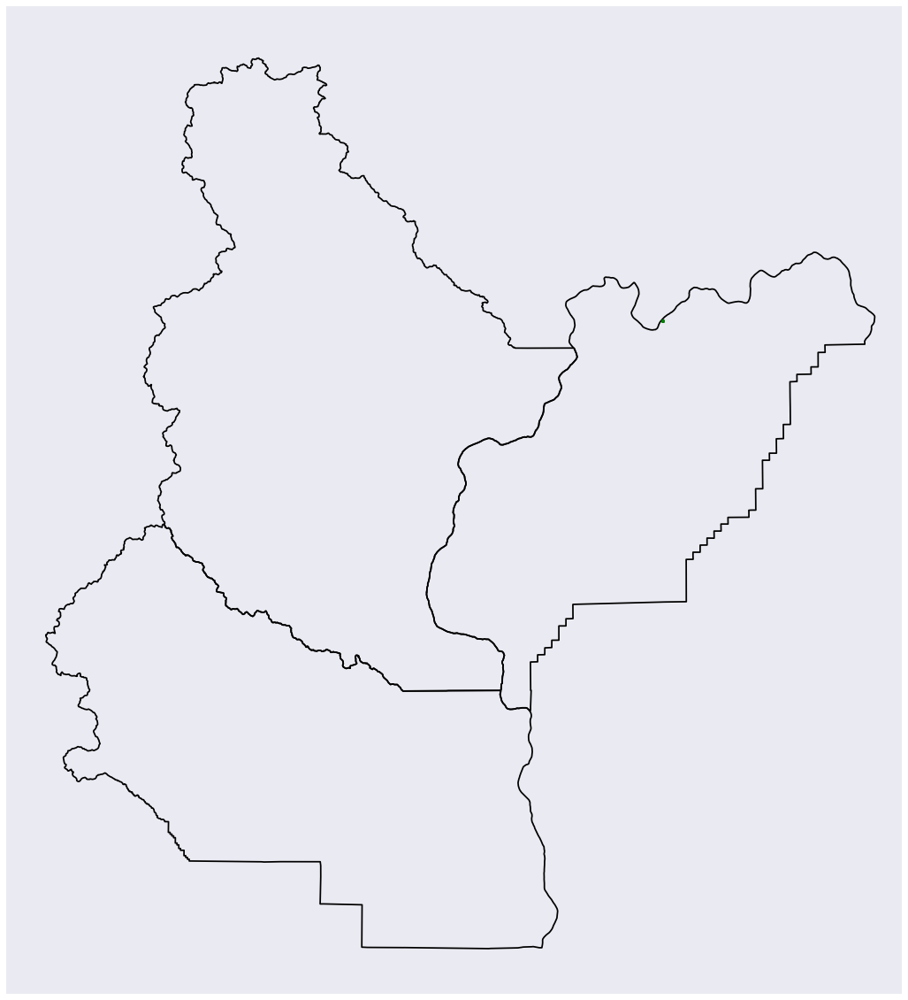

Date: 2012-09-05
--------------------------------------------------
list index out of range


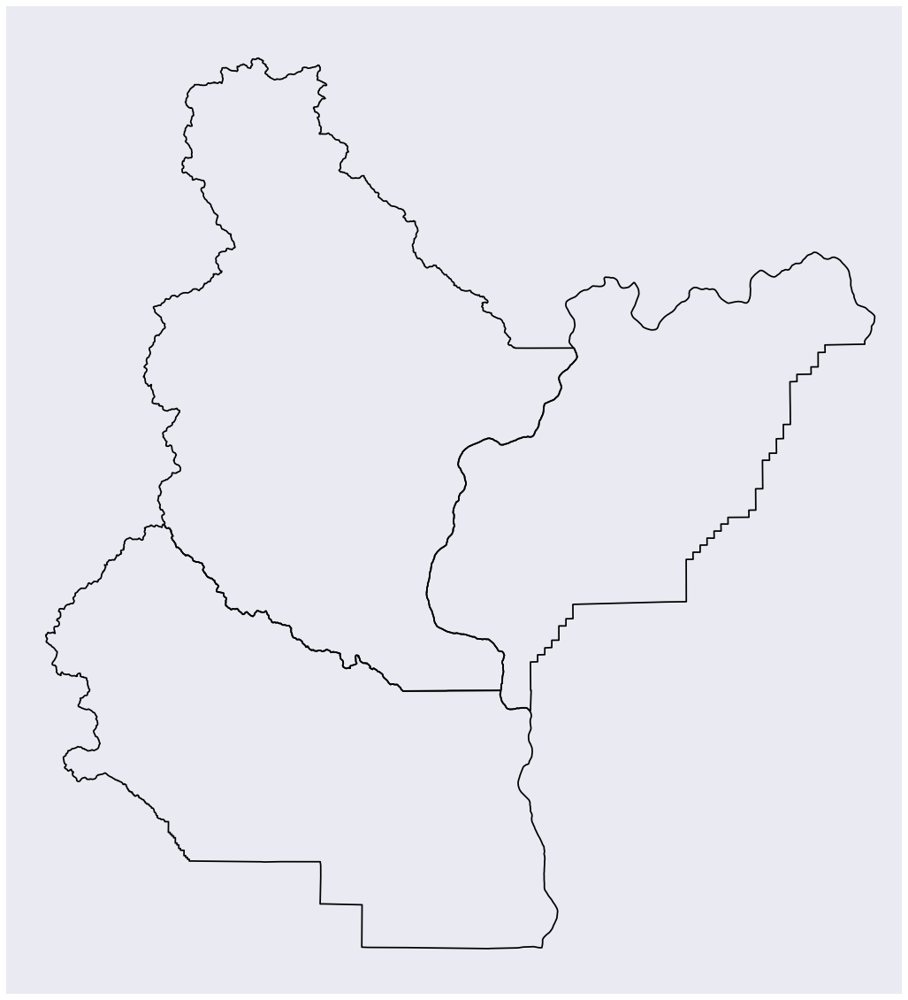

Date: 2012-09-06
--------------------------------------------------


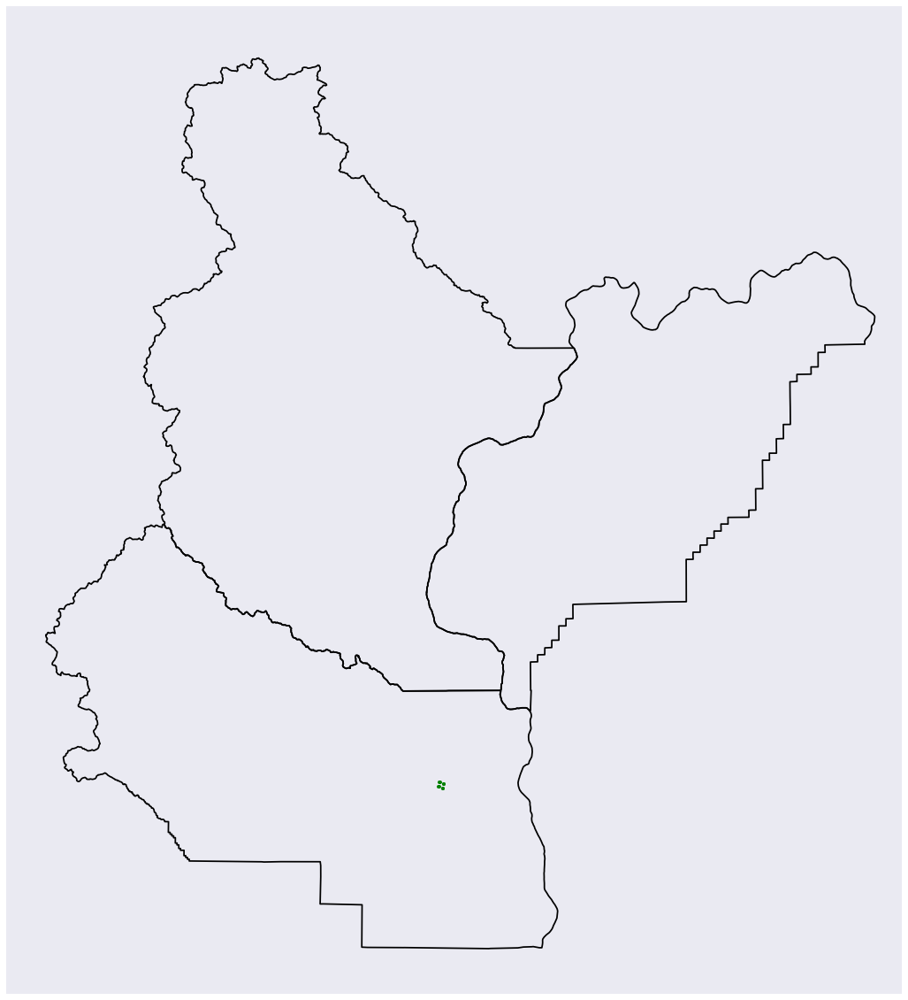

Date: 2012-09-07
--------------------------------------------------


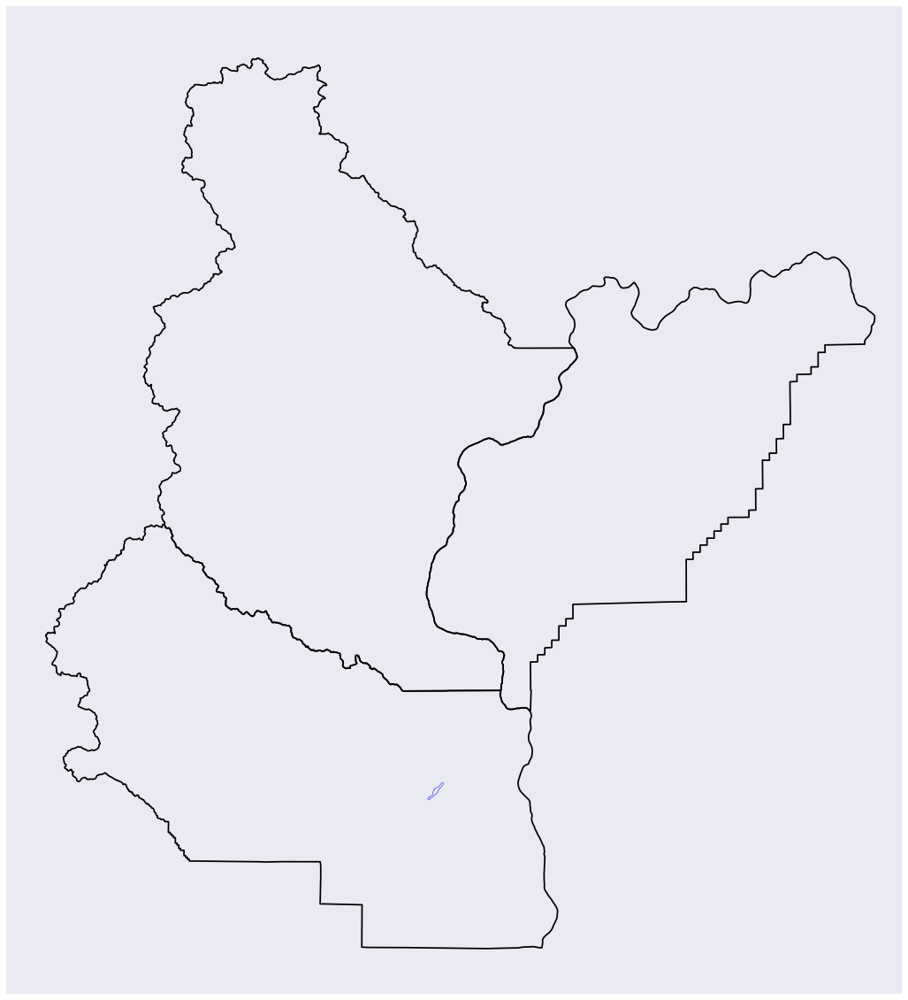

Date: 2012-09-08
--------------------------------------------------


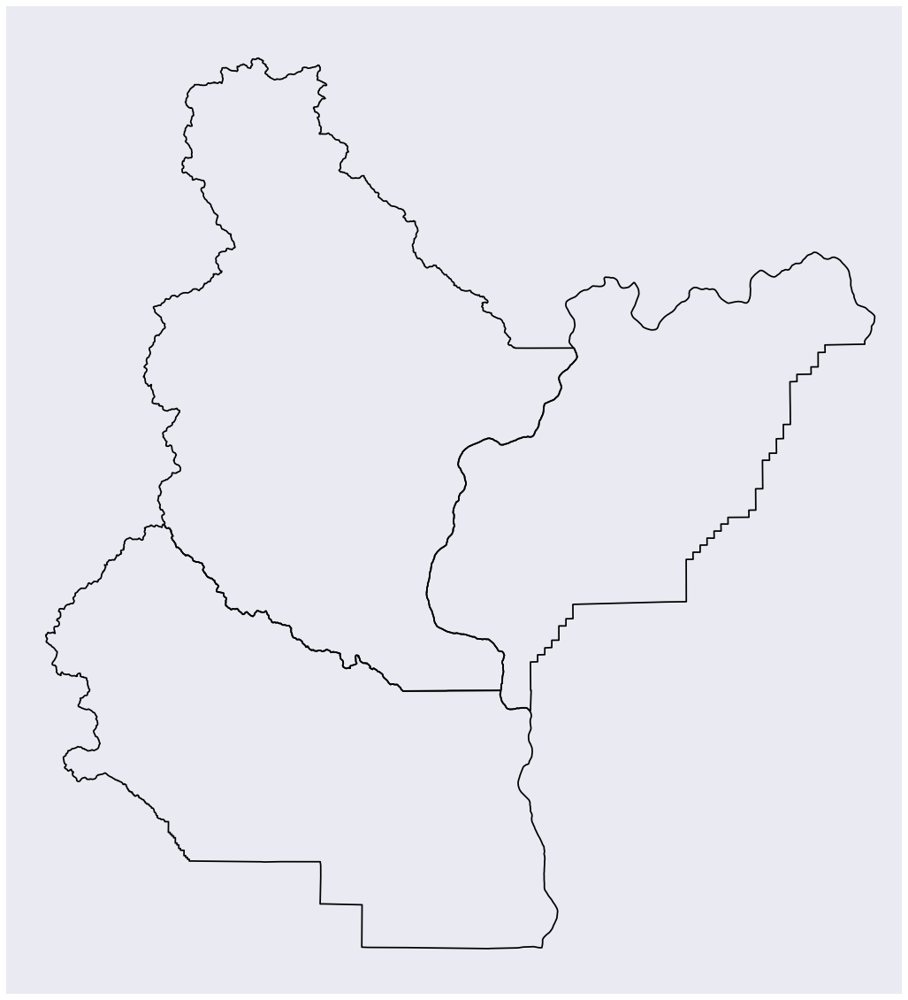

Date: 2012-09-09
--------------------------------------------------


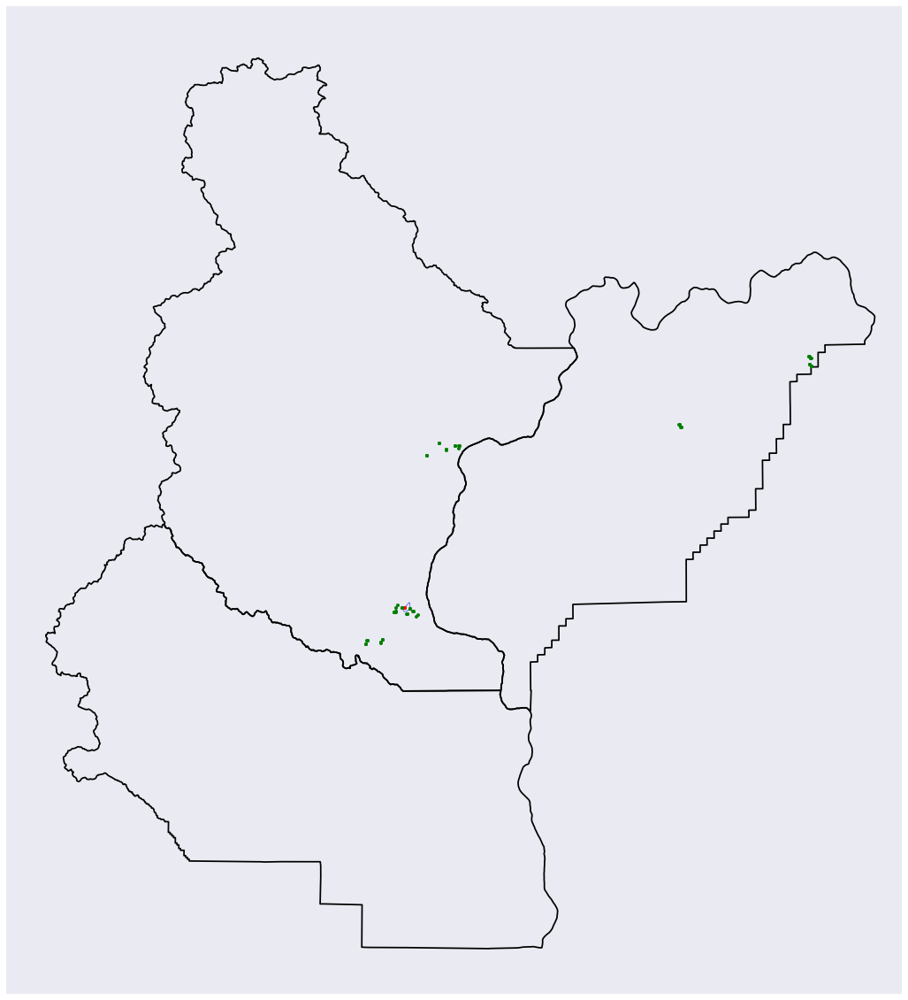

Date: 2012-09-10
--------------------------------------------------


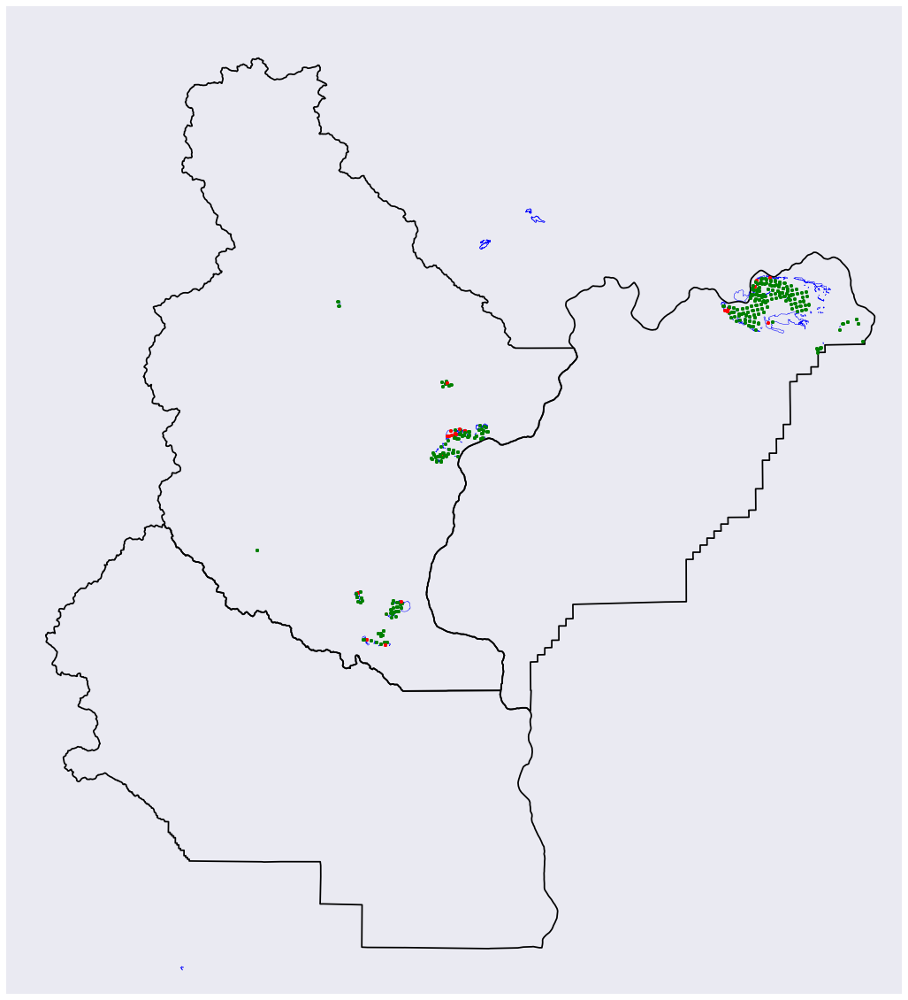

Date: 2012-09-11
--------------------------------------------------


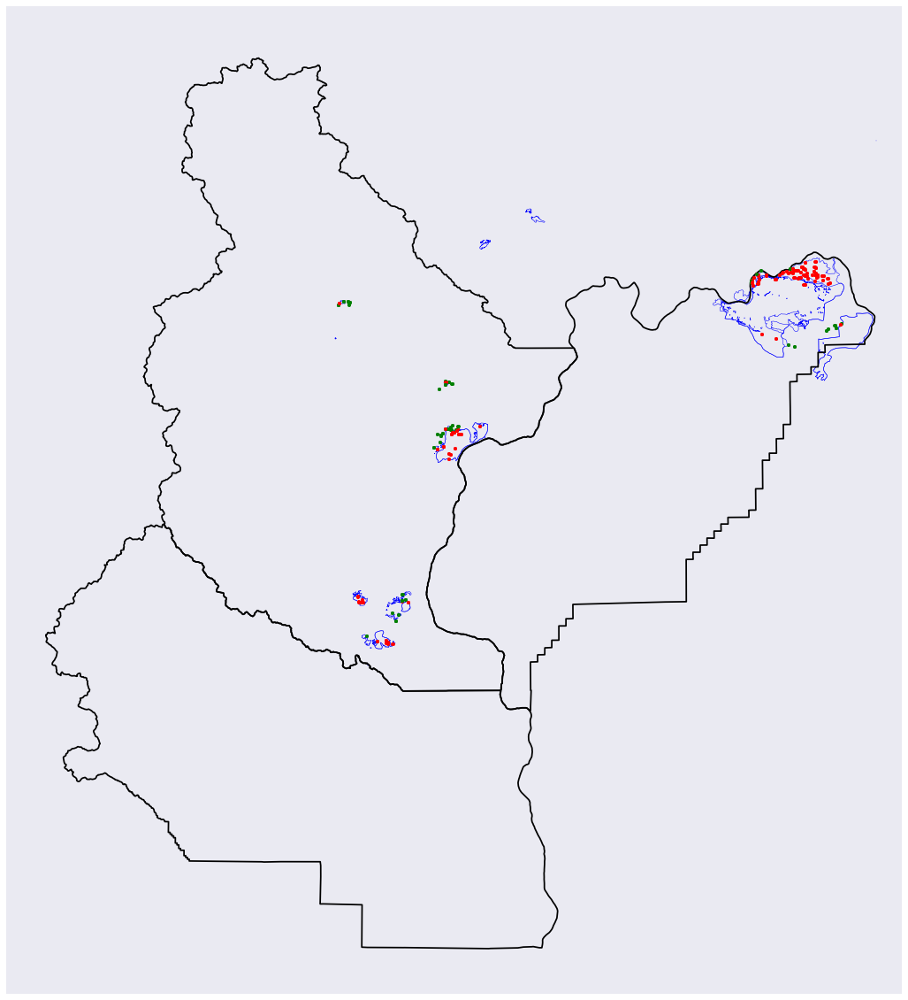

Date: 2012-09-12
--------------------------------------------------


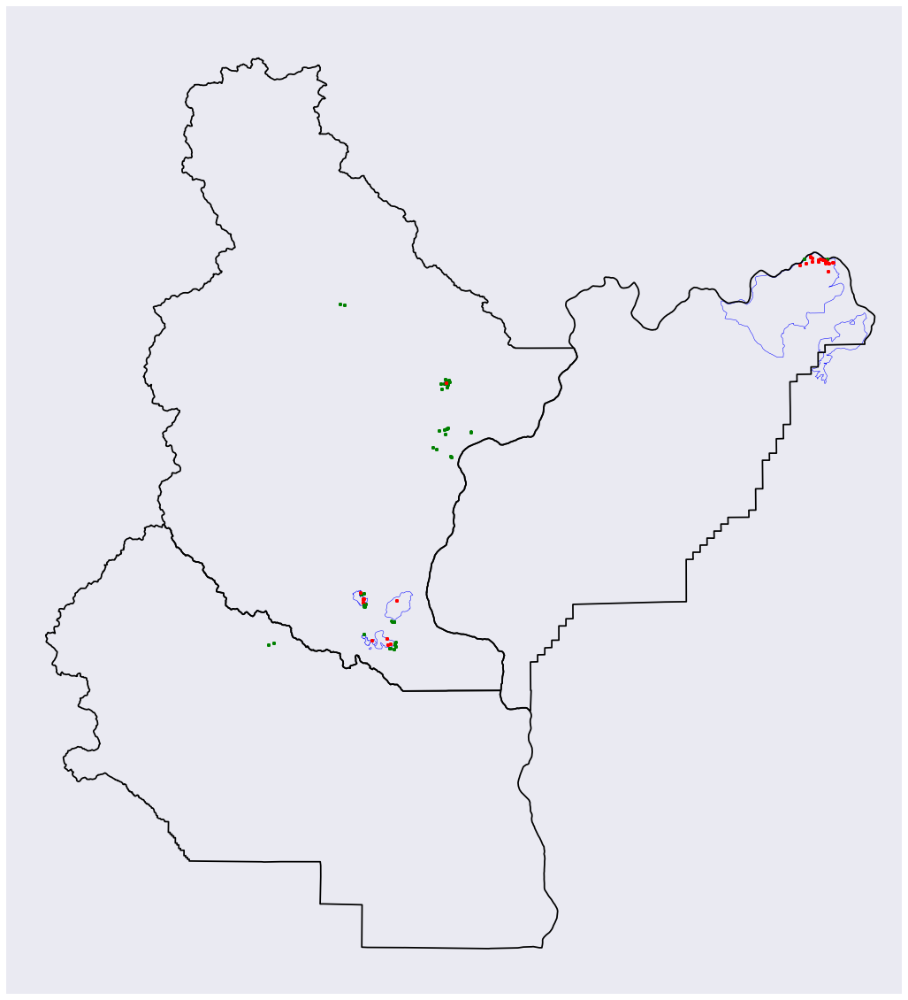

Date: 2012-09-13
--------------------------------------------------


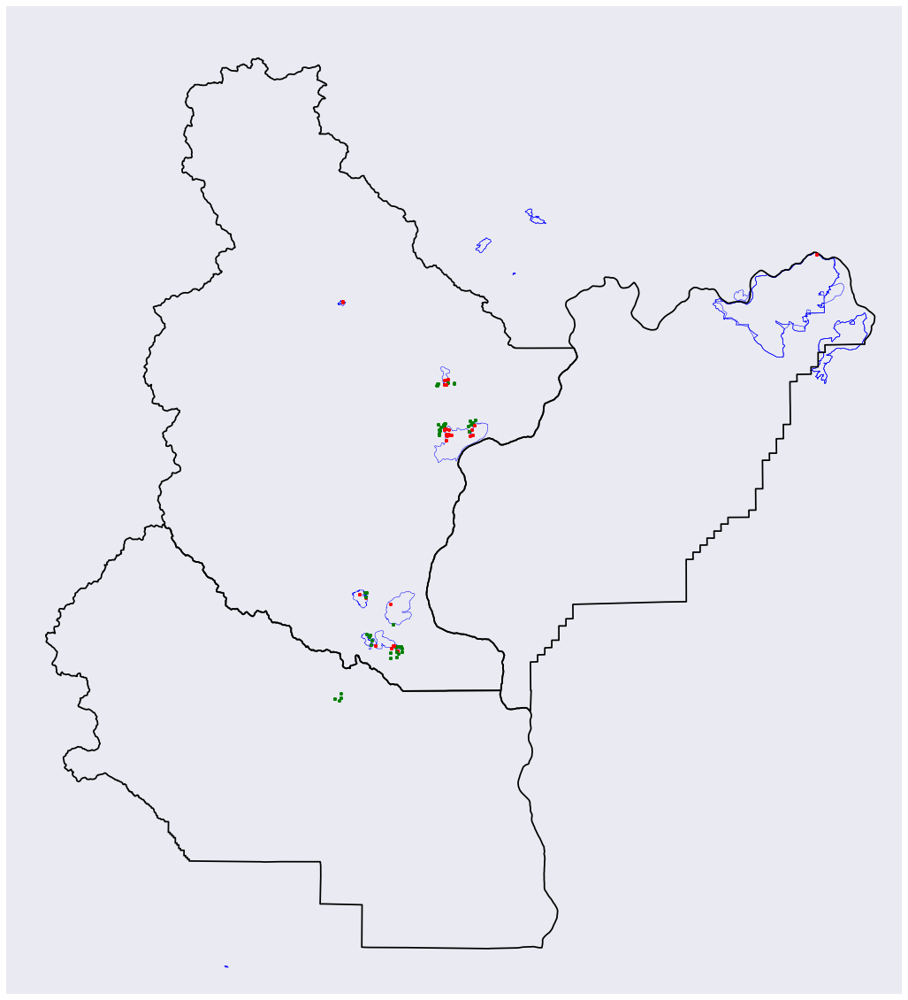

Date: 2012-09-14
--------------------------------------------------


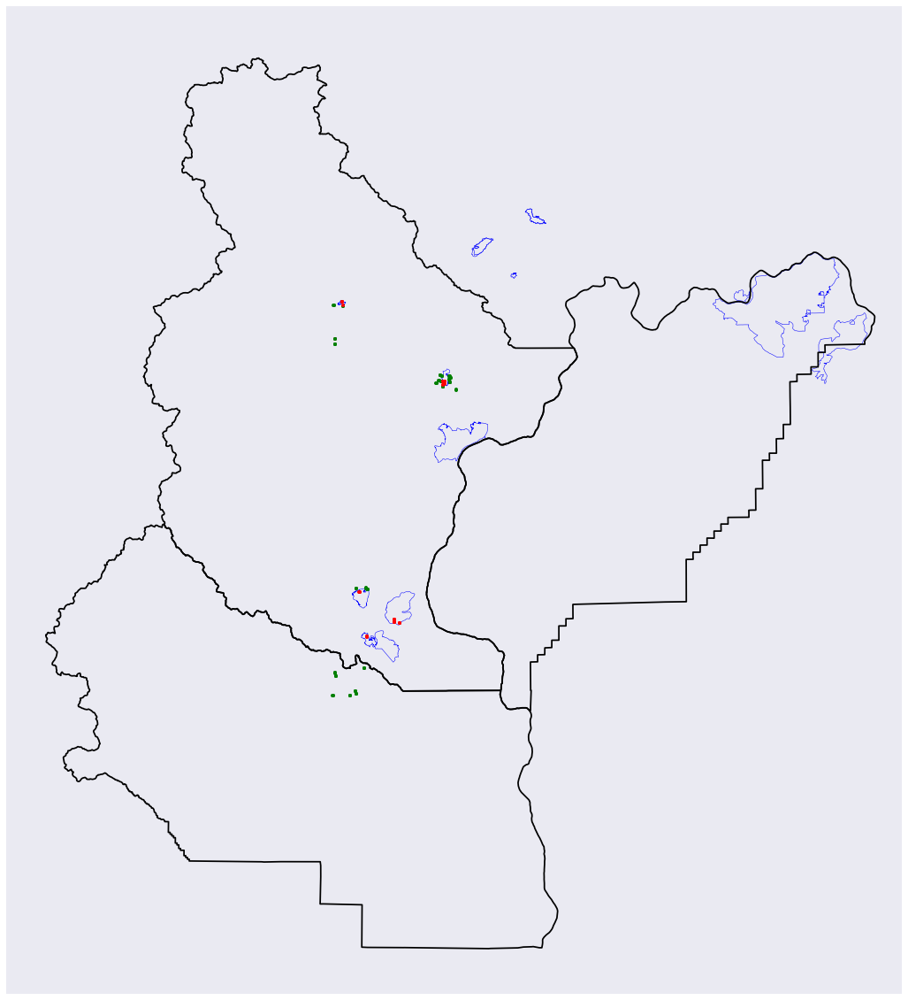

Date: 2012-09-15
--------------------------------------------------


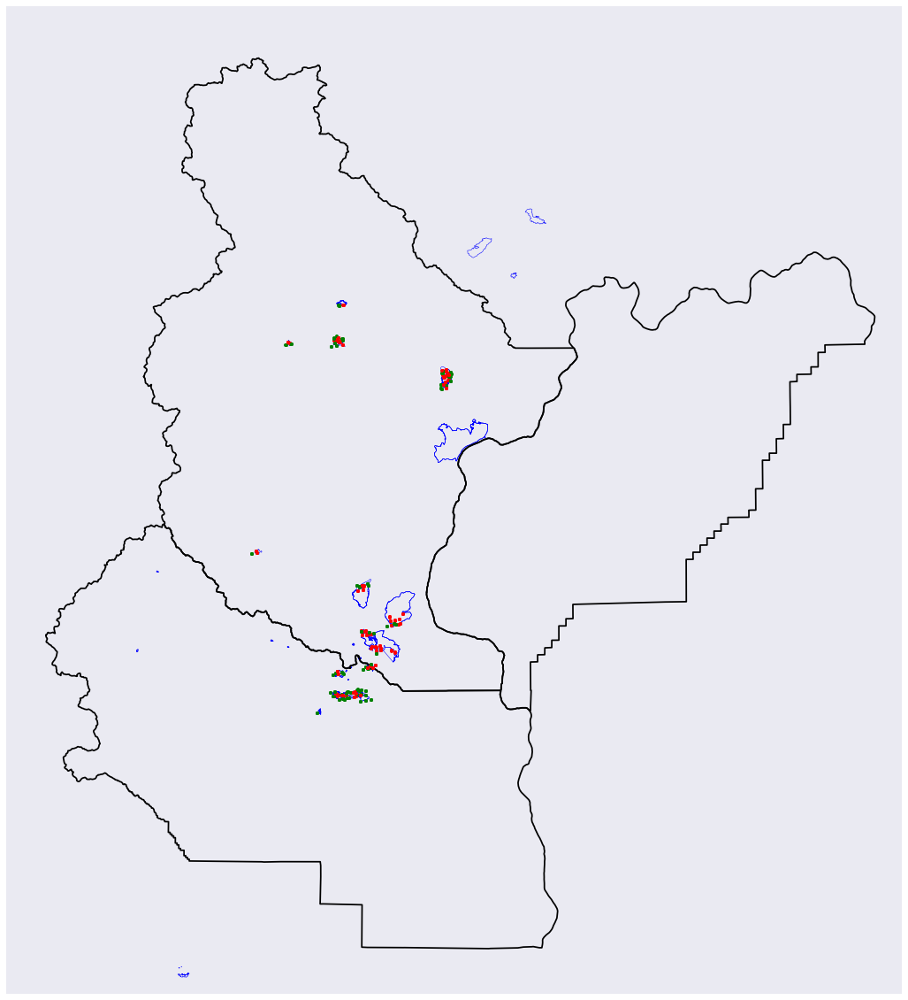

Date: 2012-09-16
--------------------------------------------------


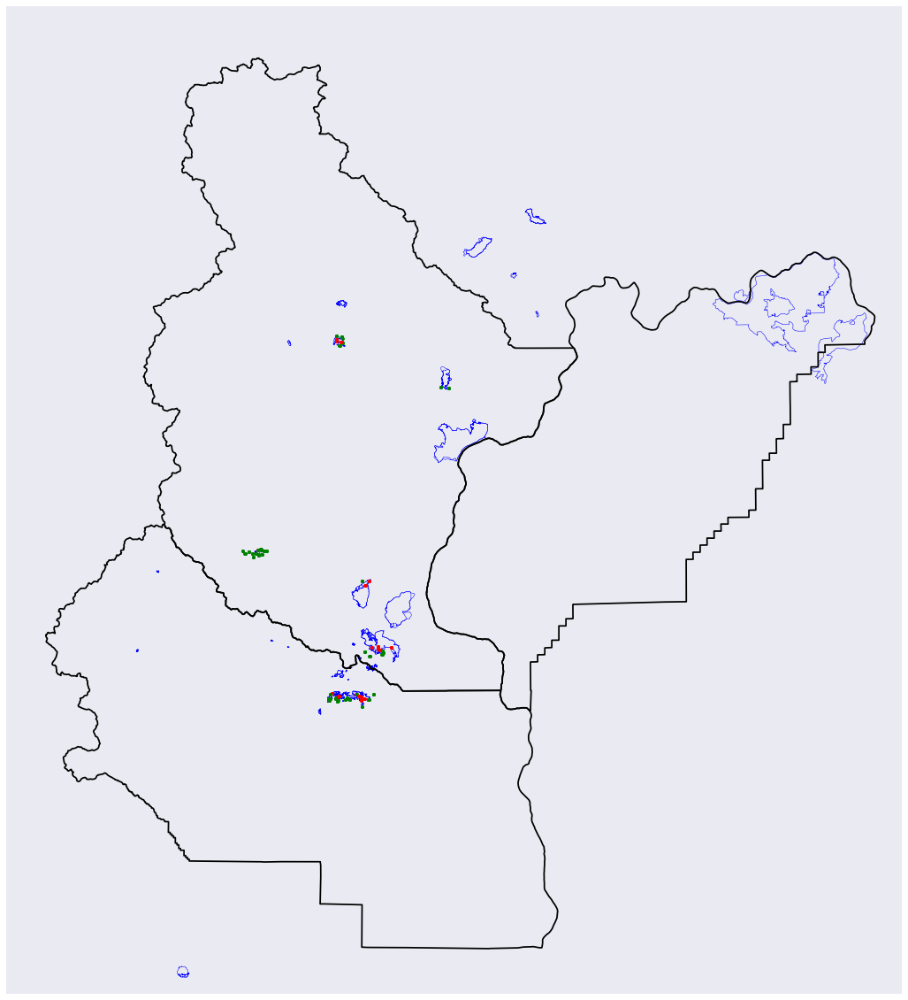

Date: 2012-09-17
--------------------------------------------------


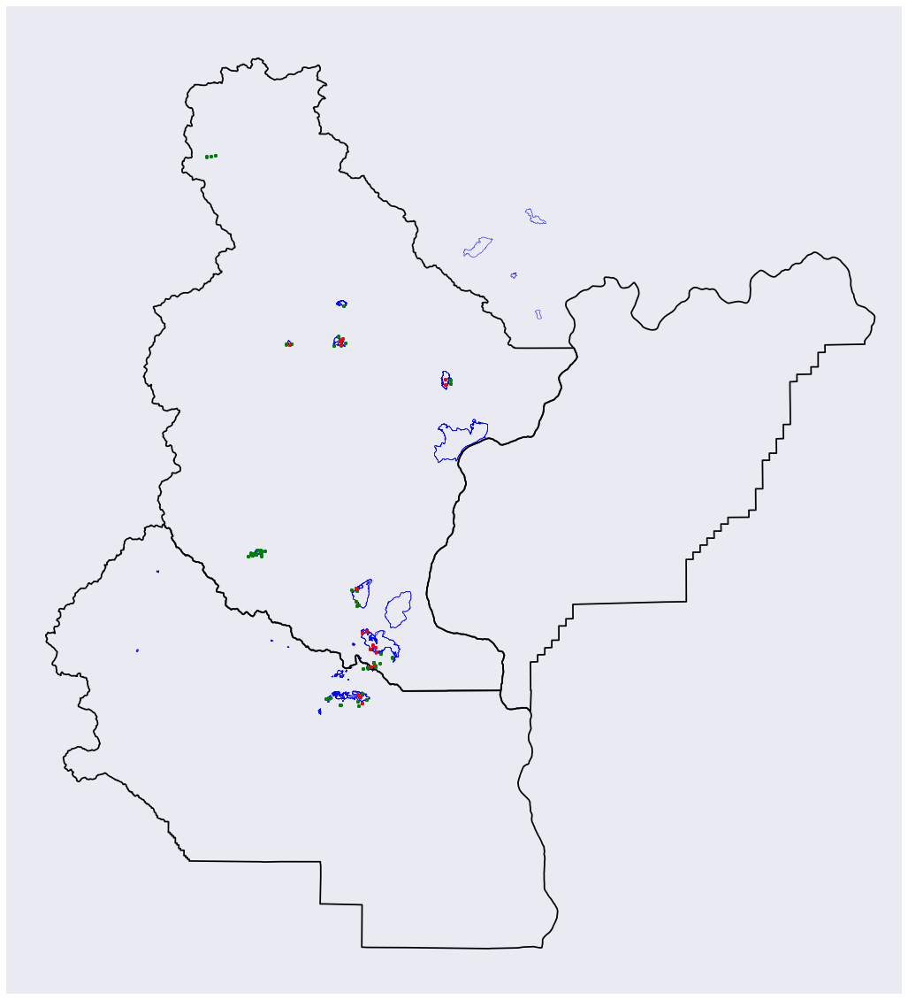

Date: 2012-09-18
--------------------------------------------------


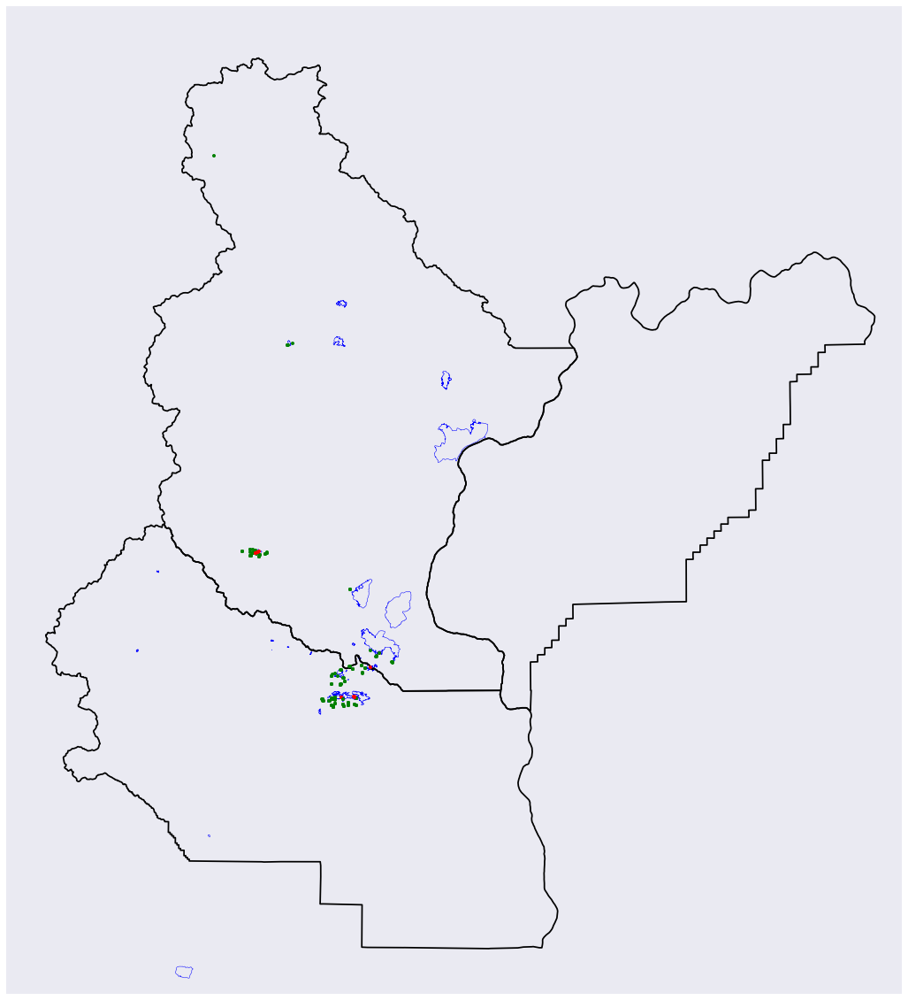

Date: 2012-09-19
--------------------------------------------------


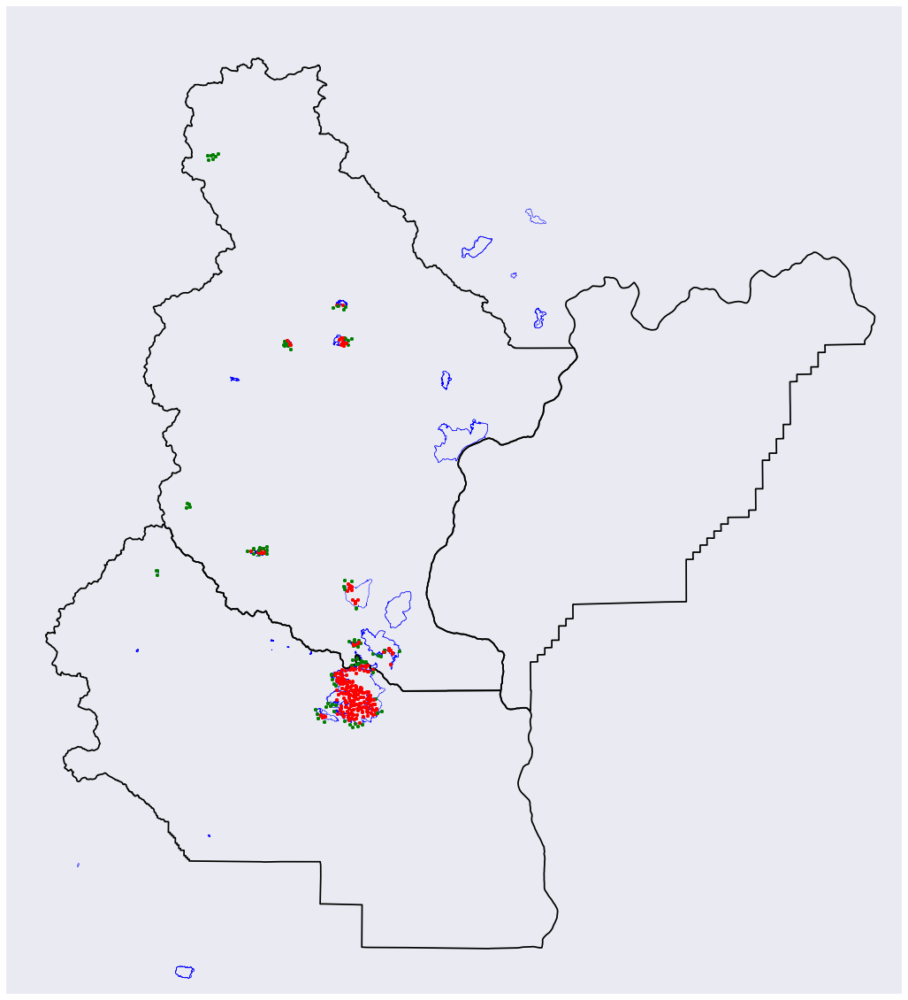

Date: 2012-09-20
--------------------------------------------------


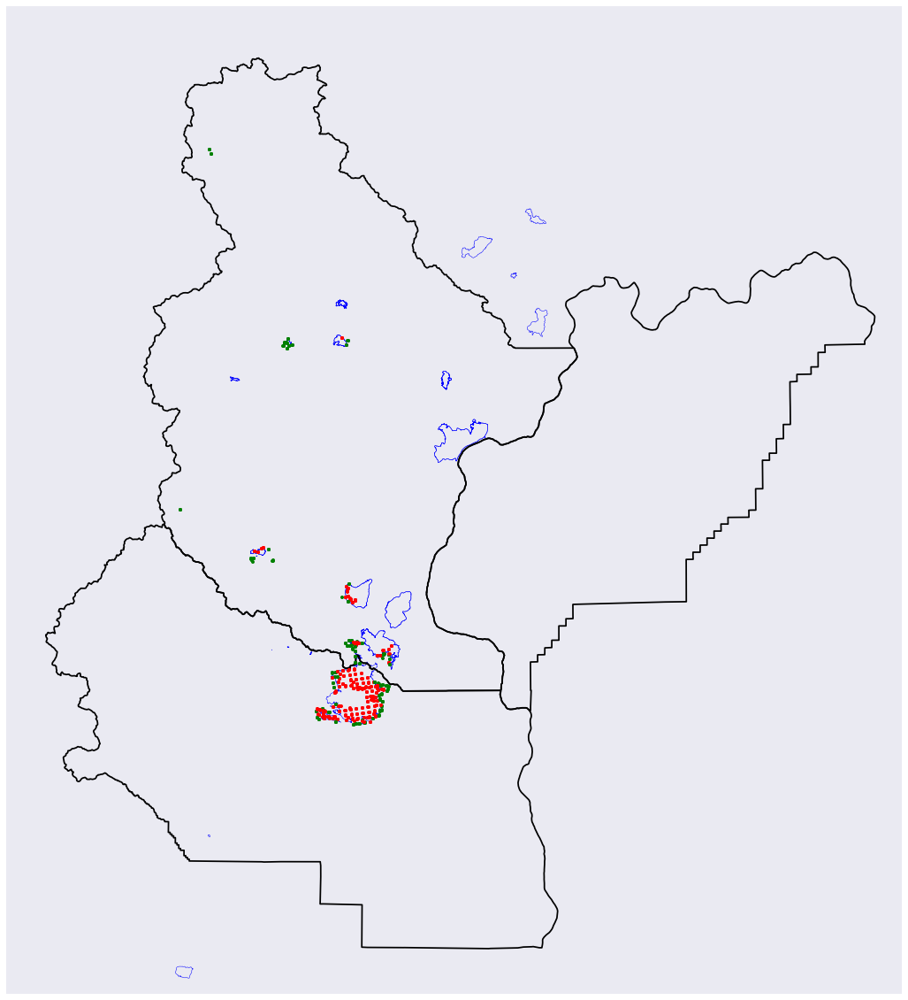

Date: 2012-09-21
--------------------------------------------------


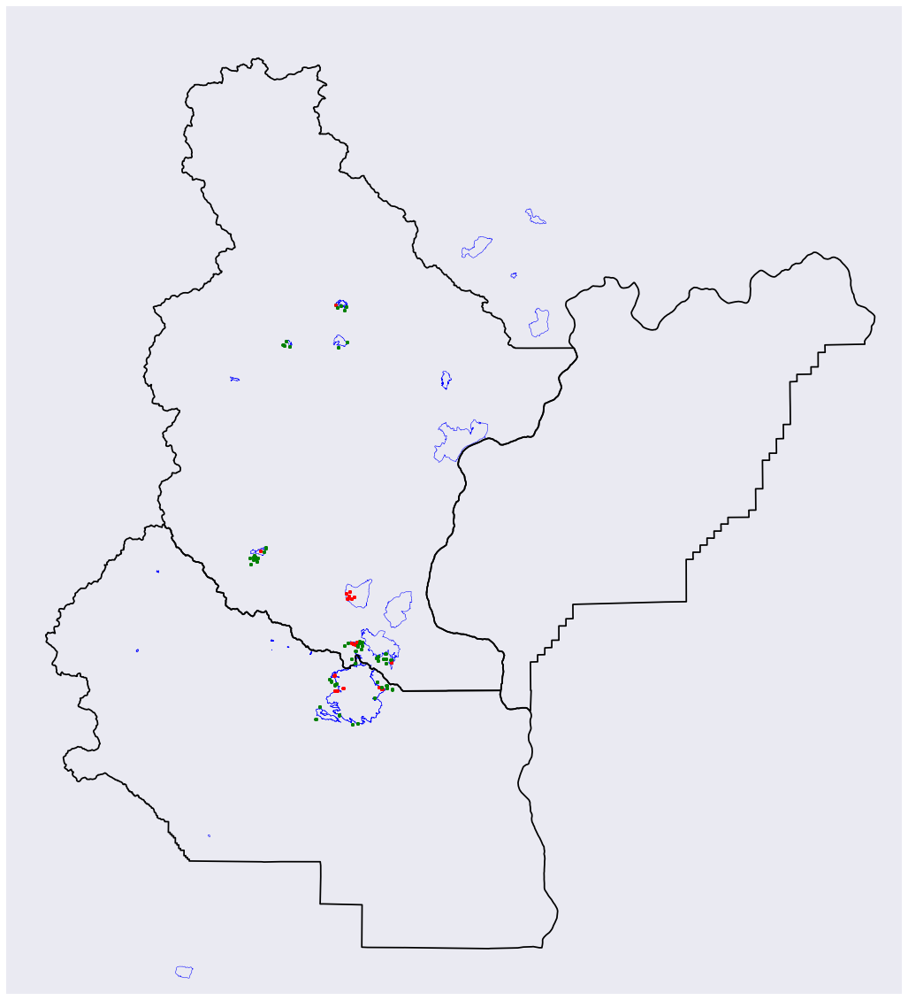

Date: 2012-09-22
--------------------------------------------------


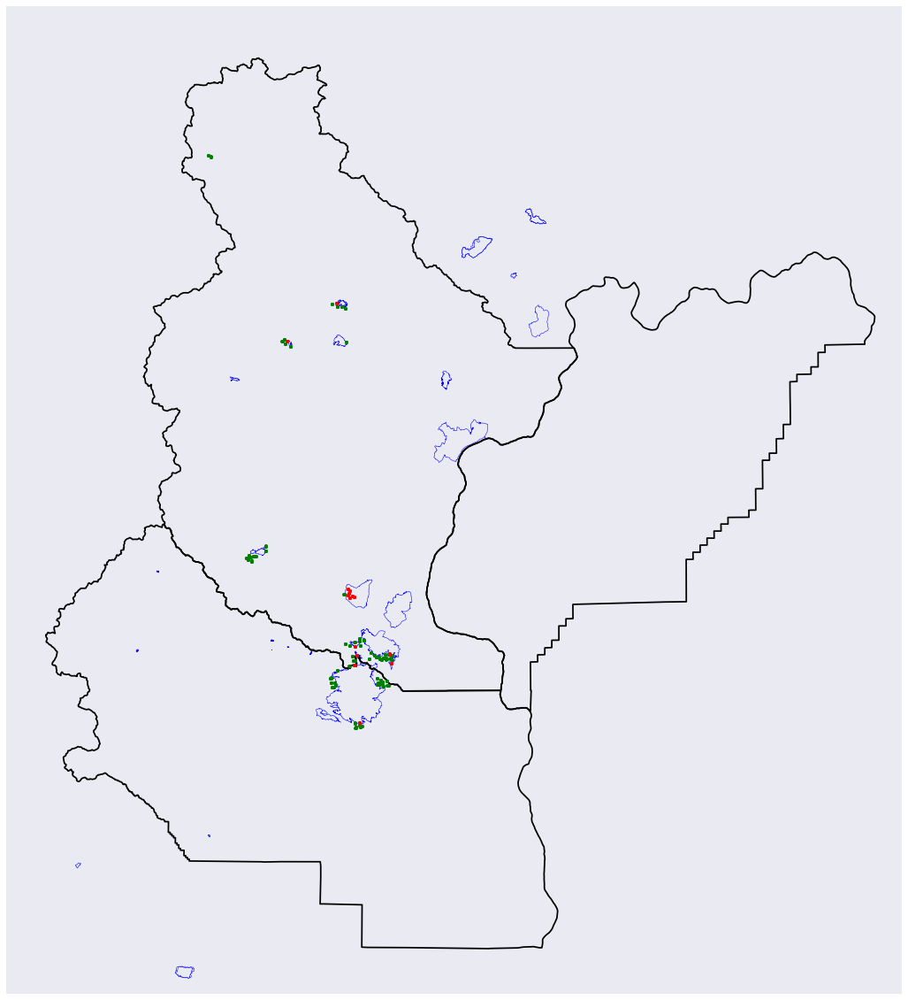

Date: 2012-09-23
--------------------------------------------------


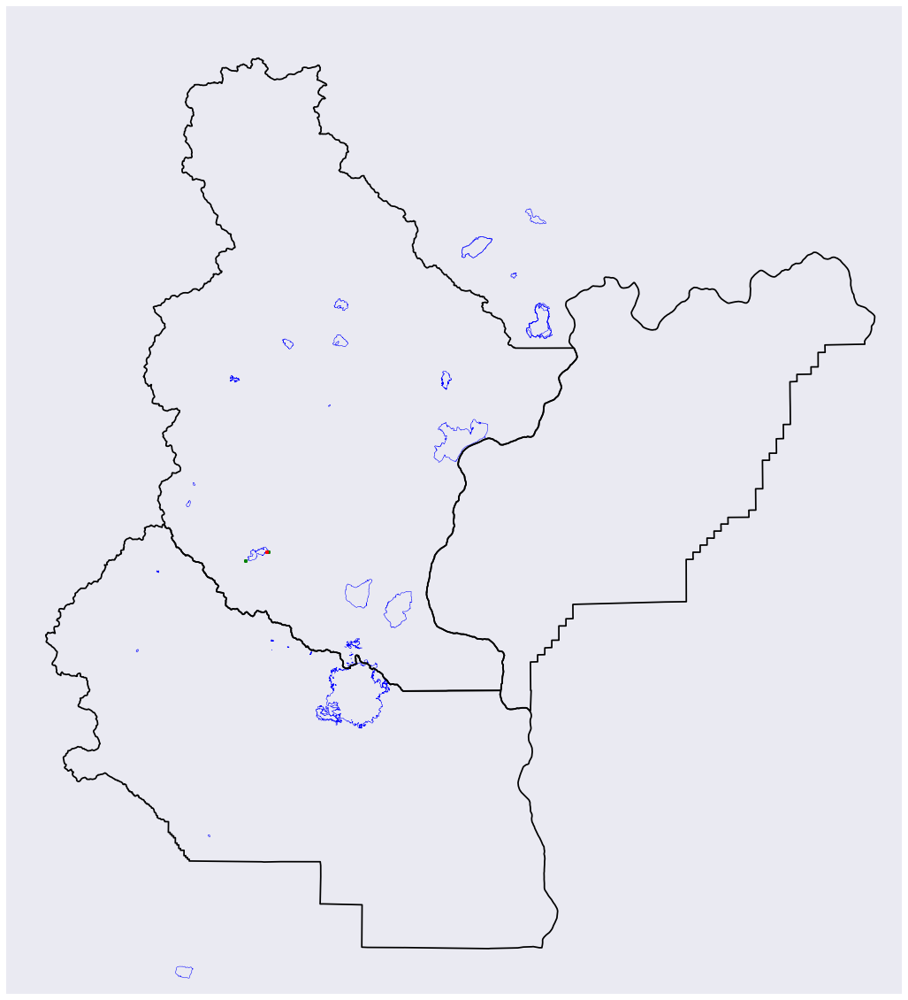

Date: 2012-09-24
--------------------------------------------------


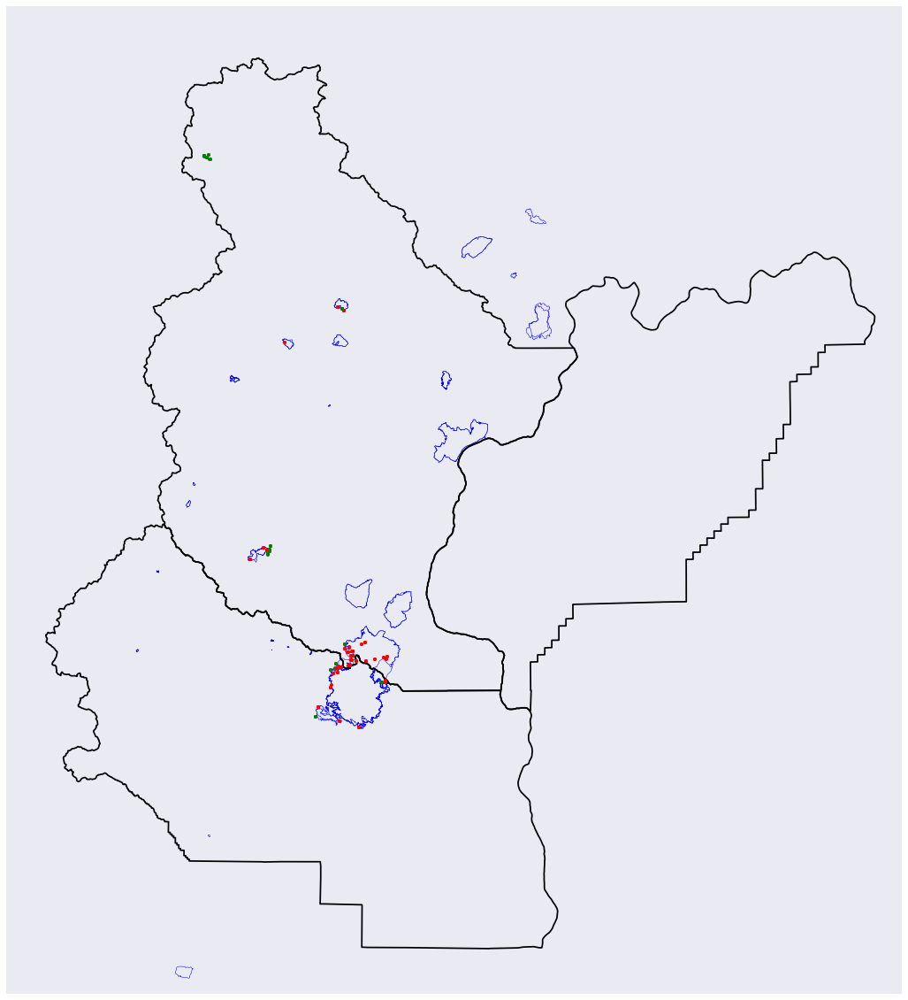

Date: 2012-09-25
--------------------------------------------------


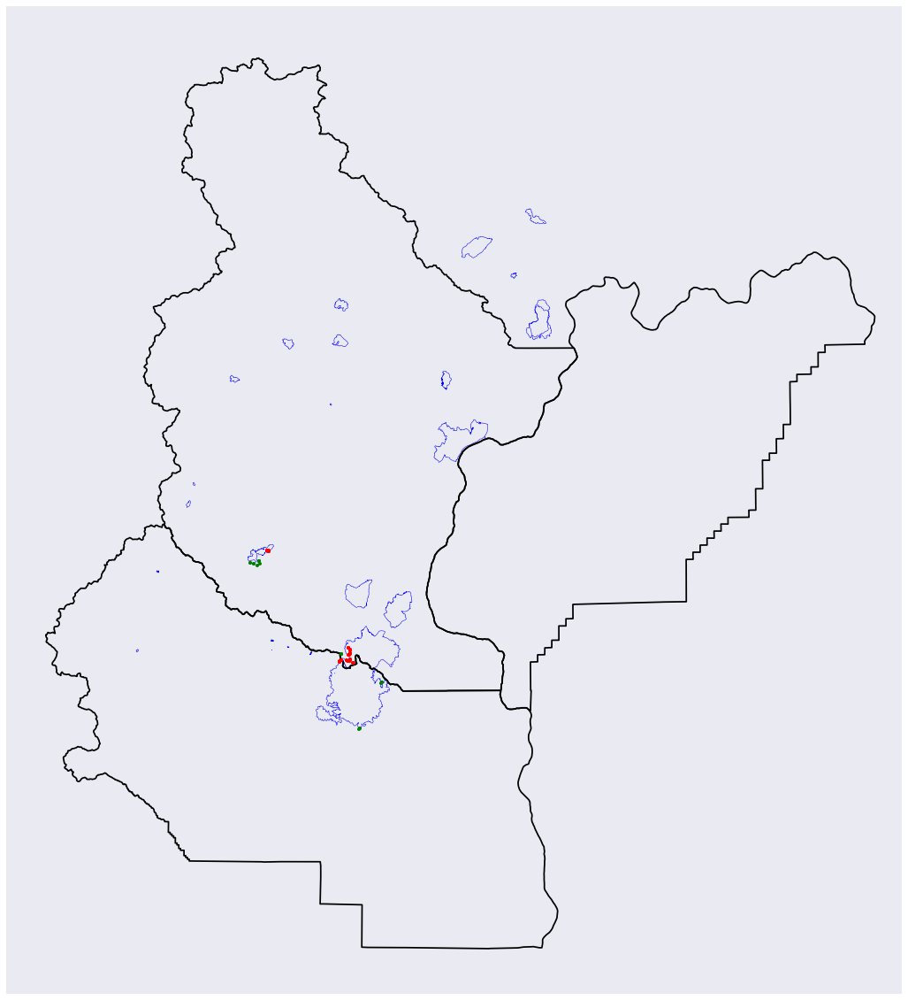

Date: 2012-09-26
--------------------------------------------------


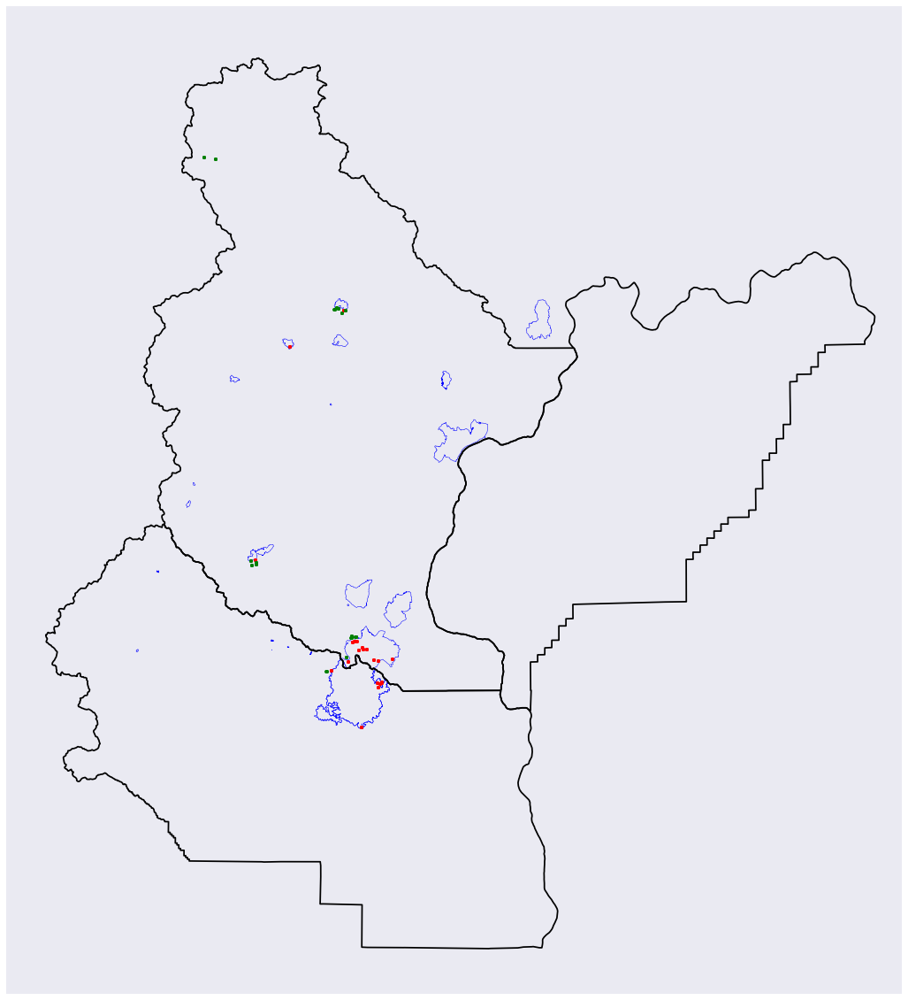

Date: 2012-09-27
--------------------------------------------------


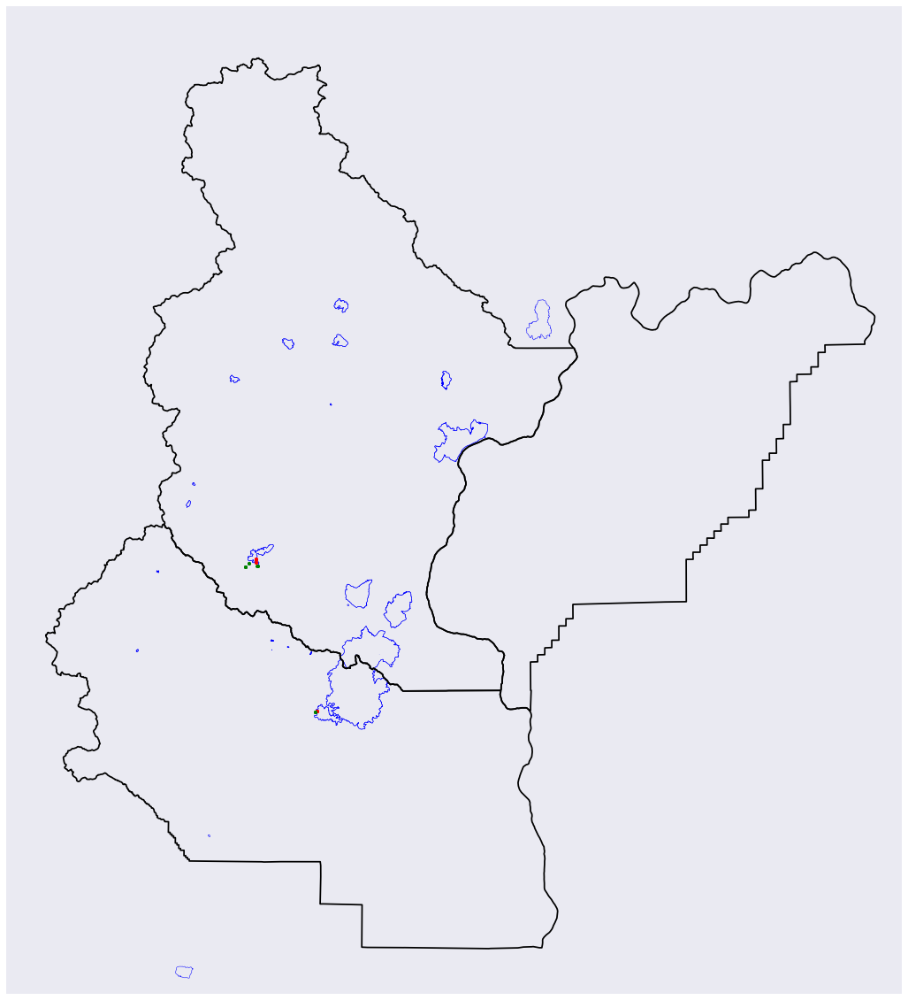

Date: 2012-09-28
--------------------------------------------------


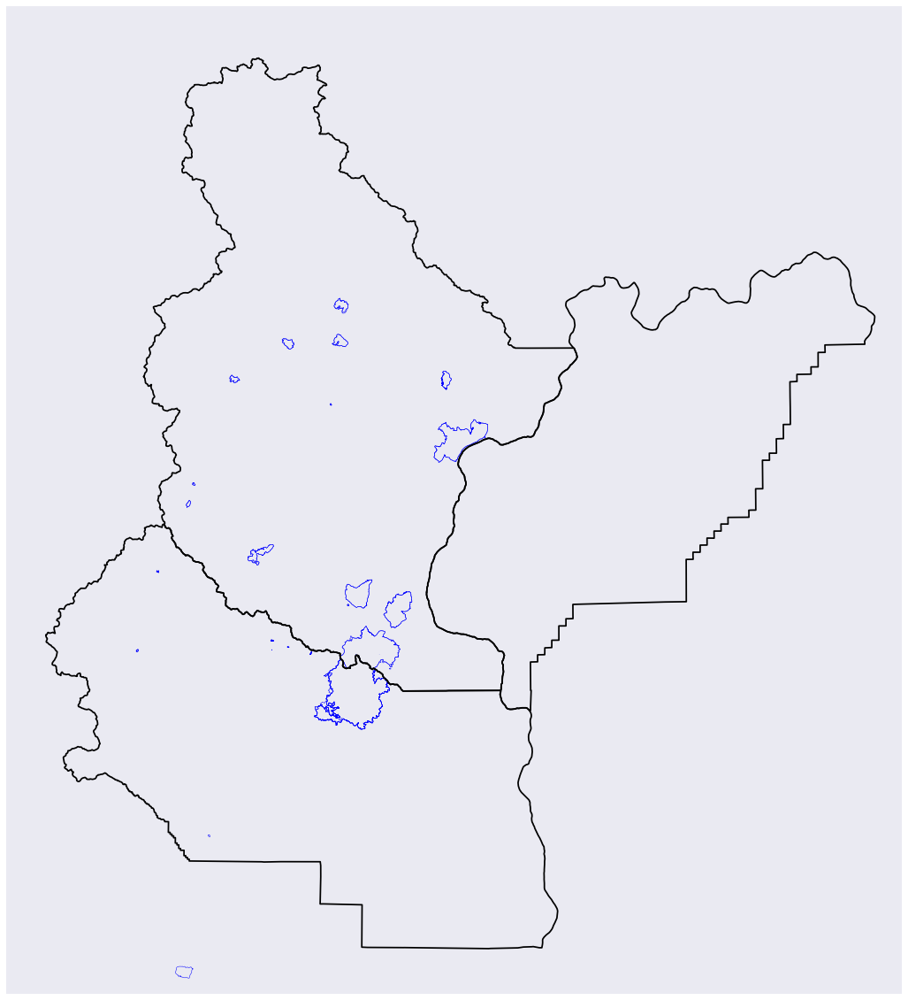

Date: 2012-09-29
--------------------------------------------------


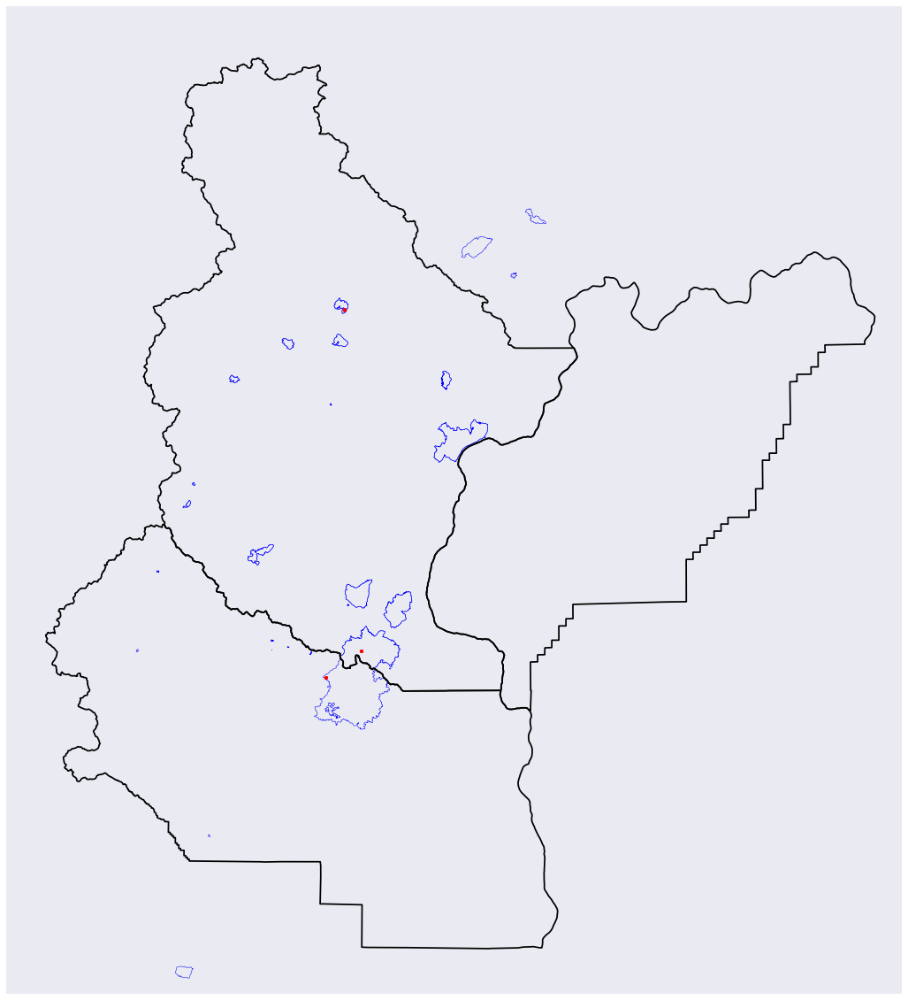

Date: 2012-09-30
--------------------------------------------------


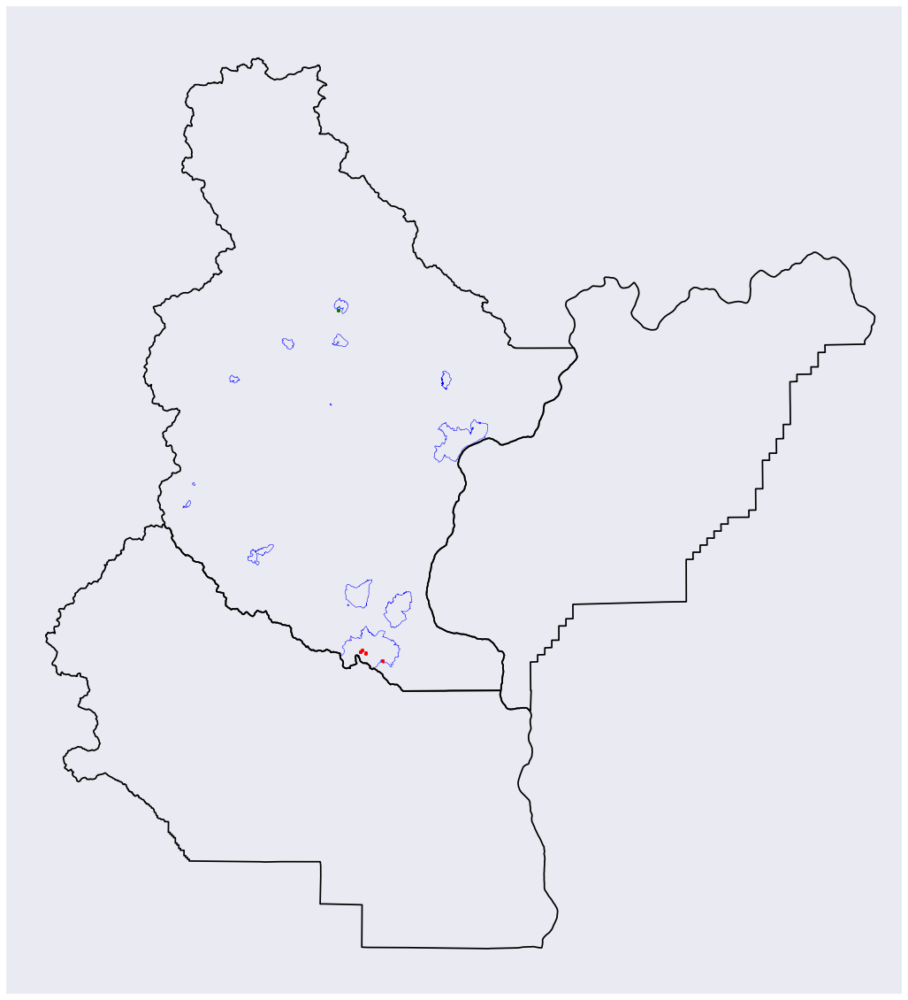

In [37]:
for dt in xrange(1, 31): 
    dt = '2012-09-0' + str(dt) if dt < 10 else '2012-09-' + str(dt)
    print 'Date: {}'.format(dt)
    print '-' * 50
    plot_county_dt('Washington', 'wa', '53', ['Chelan', 'Douglas', 'Kittitas'], dt)

Above we have county boundaries plotted, with fires/non-fires as well as fire perimeter boundaries. When looking at this, there is nothing to suggest that any of the merging is incorrect. While some points above might look like they are in fire boundaries but not labeled as fires, this an artifact of the actual plotting point size (e.g. if they were as small as possible and we could actually visualize where they fall, we would see that they don't fall within the boundaries). From this perspective, it seems that codewise, everything checks out. 

I think there are still two takeaways from the plots above: 

1. Comprehensive forest-fire perimeter boundaries are not being submitted, even for those states that appear to accurately submit boundaries. 
2. For the forest-fire perimeter boundaries that are being submitted, they are potentially missing some observations that should be labeled as forest-fires (e.g. they are not completely accurate). 

In terms of (1), I think that we can see this clearly when we look at the first plot (Trinity County in CA) from August 1st to August 2nd (e.g. the first two plots). On August 1st, we can see that there are clumps of observations (green labels) that fall in the middle right of the county. They are green because there is no fire-perimeter boundary around them. On August 2nd there is a boundary in this same location, which means that we now label them as red (e.g. forest-fires). It seems unlikely that they weren't fires on August 1 (or at least some of them) but were on August 2nd. Of course, they are denoted as non-fires on August 1 but fires on August 2nd because of the way I am labeling them (e.g. if they are in a forest-fire perimter boundary they are fires, and otherwise they are not). However, given the public data that is available, I think this is the best we can do in terms of trying to establish ground truth. This brings up an interesting question of whether or not the fire perimeter boundaries were not submitted for that given area because of a lack of resources (e.g. nobody had the time), or because they didn't know that there were fires there. In either case, if we could use some kind of algorithm to detect that there were forest-fires there (and be confident that they were forest-fires), that would be useful. 

In terms of (2), I think that we can see this fairly clearly when looking at the fire-perimeter boundaries and the observations that fall in/around them. We see that within a good number of the fire-perimeter boundaries, we have a lot of observations labeled as forest-fires (e.g. they're colored red), which makes sense. We can also see that around the outskirts of a good number of these boundaries are also a lot of observations. However, these aren't labeled as forest-fires. It seems likely that many of these observations are forest-fires, or at the very least that they should be flagged as suspicious/worth looking into. It seems likely that the forest-fire perimeter boundaries were hand drawn, leaving some room for error, and some room for not catching the entirety of fires in that area. 

This (at least for now) concludes my EDA of the MODIS data. I still have to take a look at the MODIS compared to VIIRS data, but that'll come in another notebook. Given what I've found above, I think it will most likely be best to proceed with semi-supervised or unsupervised learning. While I will probably still use some supervised techniques to see how they perform and/or use them as a baseline, I don't expect them to perfrom as well as other techniques. I think there are three major takeaways from this grouping of EDA that will inform how to move forward: 

1. Forest-fires do seem to clump together. 
2. Forest-fires don't appear to occur in the same areas from year to year, or even across a couple of years (at earliest, I saw one or two instances of a two year cycle). 
3. Submitted forest-fire perimeter boundaries are incomplete (e.g. not all states submit them, and even for those states that do, they might miss some boundaries), and probably not 100% accurate (e.g. not comprehensive in the area of the forest-fire). 

The bottom line with all of this is that I'll probably have to try a bunch of models out, examine the results, and figure out which one would be most useful (if at all) in the real world. 